## Imports and functions

In [1]:
# -------------------------------------------------------------------
# 1) Standard library and environment utilities
# -------------------------------------------------------------------
import os
from datetime import datetime
from math import floor, log

# -------------------------------------------------------------------
# 2) Data / numerical analysis stack
# -------------------------------------------------------------------
import numpy as np
import pandas as pd

# -------------------------------------------------------------------
# 3) Plotting and visualization
# -------------------------------------------------------------------
import matplotlib.pyplot as plt
import seaborn as sns
from pylab import rcParams

# -------------------------------------------------------------------
# 4) Time series and statistics
# -------------------------------------------------------------------
from scipy import signal
from scipy.stats import norm, pearsonr, rankdata
from statsmodels.tsa import seasonal
from statsmodels.tsa.api import VAR
from statsmodels.tsa.stattools import adfuller, ccf, grangercausalitytests

# -------------------------------------------------------------------
# 5) Machine learning and preprocessing
# -------------------------------------------------------------------
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import RFE, SelectFromModel
from sklearn.linear_model import LassoCV, LinearRegression
from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler, StandardScaler

# -------------------------------------------------------------------
# 6) BigQuery client dependencies (kept for compatibility with existing workflow)
# -------------------------------------------------------------------
# from google.cloud import bigquery, bigquery_storage
from pandas_gbq import to_gbq

# -------------------------------------------------------------------
# 7) Project utilities: move reusable helper functions to analysis_utils.py
# -------------------------------------------------------------------
from analysis_utils import (
    append_csv_to_dataframe,
    adjusted_r2,
    bic,
    ccf_funct,
    cross_correlate,
    detrender,
    dual_plot_corr,
    evaluate_model,
    forward_fill_increment,
    lagged_corr_plot,
    lin_model,
    plot_ccf_2,
    robust_r2_score,
    roll_apply_max_ccf,
    series_rel_plot,
    twinplot,
    LinearModelClass,
)

# Notebook plotting defaults
rcParams['figure.figsize'] = 12, 5

# Common plotting color scheme
color1 = 'black'
color2 = 'grey'
color3 = '#ffcc00'
f = 12 * 1e6

### Intro

In [2]:
directory_path = "C:/Users/illoi/Escritorio-2/00 - RETAIL INSIGHTS & ANALYTICS/01 - MARKET ANALYSIS/Data/US - Copy"
df_file_name = 'prov2.csv'
result_df_file_name = 'prov.csv'
sep = ','

df = pd.read_csv(os.path.join(directory_path, df_file_name), sep=sep, index_col=0, parse_dates=[0])
result_df = pd.read_csv(os.path.join(directory_path, result_df_file_name), sep=sep, index_col=0, parse_dates=[0])
df.head()

,CB CCI,Household PCE,Michigan CSI,PCE Durable goods Furnishings and durable household equipment,PCE,PCEDG PCE Durable goods,PCEDGC96 Real PCE Durable goods Chain-type,PCEPI PCE Chain-type,PCEPILFE PCE Excl Food and Energy Chain-Type,Real Households Final PCE,...,Real Usable Personal Income,Personal Consumption Expenditures per capita,Real Personal Consumption Expenditures per capita,Real Personal Consumption Expenditures per household,Consumption as share of GDP,roll_Consumption as share of GDP,roll_Consumption exp as share of GDP,Retail Sales Furniture & HF corr,Y,Y_infl_adj
1992-01-01,52.5,4109.625,67.5,121.980,4084.7,495.6,NaN,62.638,63.641,1607342.5,...,25967.688136,15.954993,28.278407,75.674101,0.641935,0.642253,0.643000,3699.0,3975.607143,2874.625555
1992-02-01,50.2,4109.625,68.8,121.980,4099.5,501.3,NaN,62.797,63.814,1607342.5,...,25953.929663,16.000568,28.297801,75.783899,0.641548,0.642516,0.643143,3759.0,3992.937500,2880.907287
1992-03-01,47.3,4109.625,76.0,121.980,4117.0,491.7,NaN,62.949,63.973,1607342.5,...,25957.001921,16.059669,28.300232,75.833836,0.642662,0.642504,0.643250,3997.0,4020.301587,2890.224002
1992-04-01,56.5,4109.625,77.2,122.968,4131.5,490.0,NaN,63.119,64.183,1616605.0,...,26001.846848,16.109056,28.326169,75.937146,0.642765,0.642619,0.643333,3981.0,4051.587500,2906.447274
1992-05-01,65.1,4109.625,79.2,122.968,4158.4,501.9,NaN,63.203,64.273,1616605.0,...,25990.949403,16.202541,28.429371,76.267435,0.642879,0.642933,0.643500,4109.0,4078.626263,2919.560675


### Adding the diff columns

In [3]:
original_cols = df.columns

In [4]:
diff_df = pd.DataFrame()
pct_df = pd.DataFrame()
roll_pct_df = pd.DataFrame()

diff_df = df.diff()
pct_df = df.pct_change(fill_method=None)
roll_pct_df = df.pct_change(fill_method=None).rolling(window=12, min_periods=1, center=True).mean()

diff_df.rename(columns=dict(zip(diff_df.columns,'diff_' + diff_df.columns)), inplace=True)
pct_df.rename(columns=dict(zip(pct_df.columns,'pct_chg_' + pct_df.columns)), inplace=True)
roll_pct_df.rename(columns=dict(zip(roll_pct_df.columns,'roll_pct_chg_' + roll_pct_df.columns)), inplace=True)

df = pd.concat([df, diff_df, pct_df, roll_pct_df], axis=1)

## HF analysis

### Intro

<Axes: >

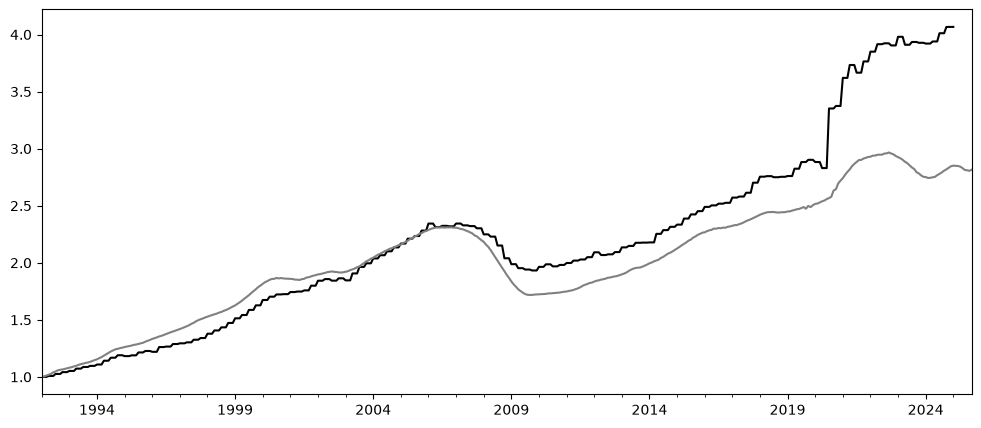

In [5]:
(df['PCE Durable goods Furnishings and durable household equipment'] / 
 df['PCE Durable goods Furnishings and durable household equipment'].iloc[0]).plot(color=color1)
(df['Y']/df['Y'].iloc[0]).plot(color=color2)

PearsonRResult(statistic=np.float64(0.9086440979582737), pvalue=np.float64(1.633876948057627e-151))

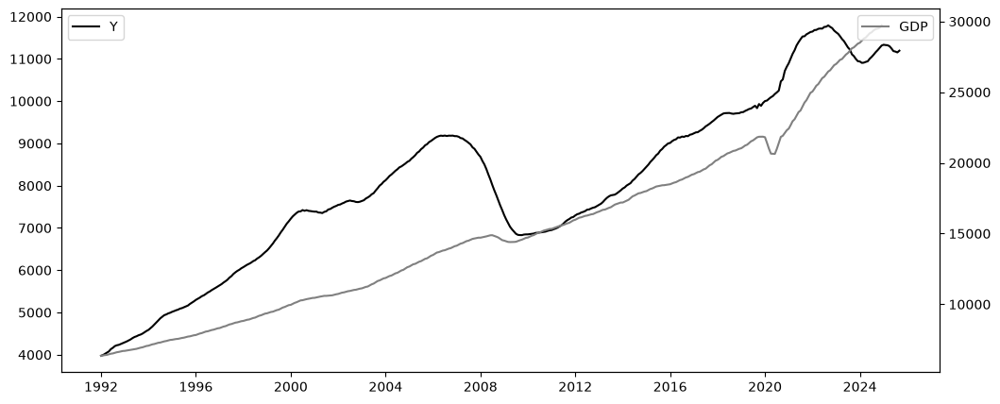

In [6]:
dual_plot_corr(df['Y'], df['GDP'])

In [7]:
for col in ['US All home sales', 'Real Estate - market sales']:
    df['roll_' + col] = df[col].rolling(window=12, min_periods=1, center=True).mean()

C:\Users\illoi\AppData\Local\Temp\ipykernel_36812\3994844901.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['roll_' + col] = df[col].rolling(window=12, min_periods=1, center=True).mean()
C:\Users\illoi\AppData\Local\Temp\ipykernel_36812\3994844901.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['roll_' + col] = df[col].rolling(window=12, min_periods=1, center=True).mean()


PearsonRResult(statistic=np.float64(0.9458107623008477), pvalue=np.float64(4.044870335502413e-192))

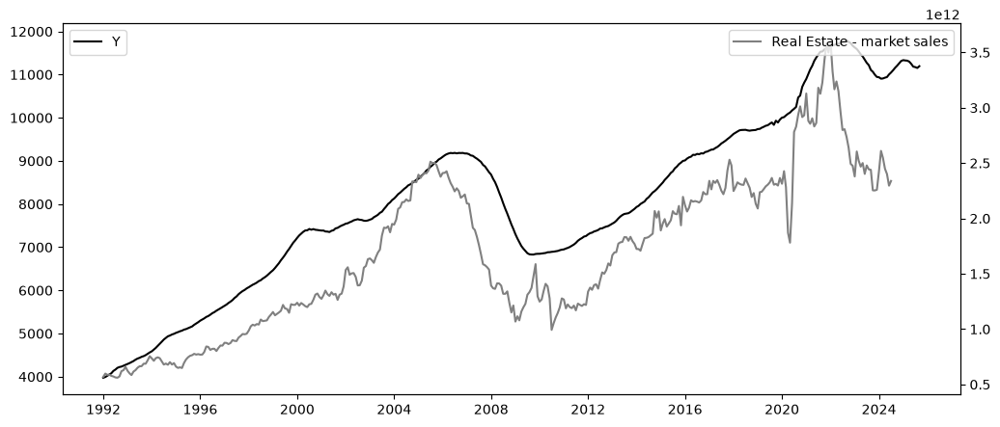

In [8]:
dual_plot_corr(df['Y'], df['Real Estate - market sales'])

PearsonRResult(statistic=np.float64(0.9532509955962574), pvalue=np.float64(7.756477524346908e-206))

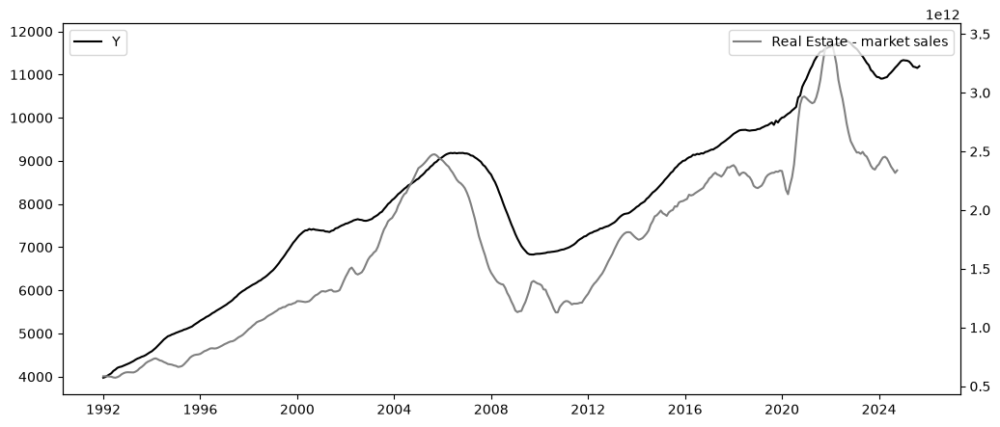

In [9]:
dual_plot_corr(df['Y'], df['Real Estate - market sales'].rolling(window=6, min_periods=1, center=True).mean())

PearsonRResult(statistic=np.float64(0.8549749158873078), pvalue=np.float64(8.124015313980239e-114))

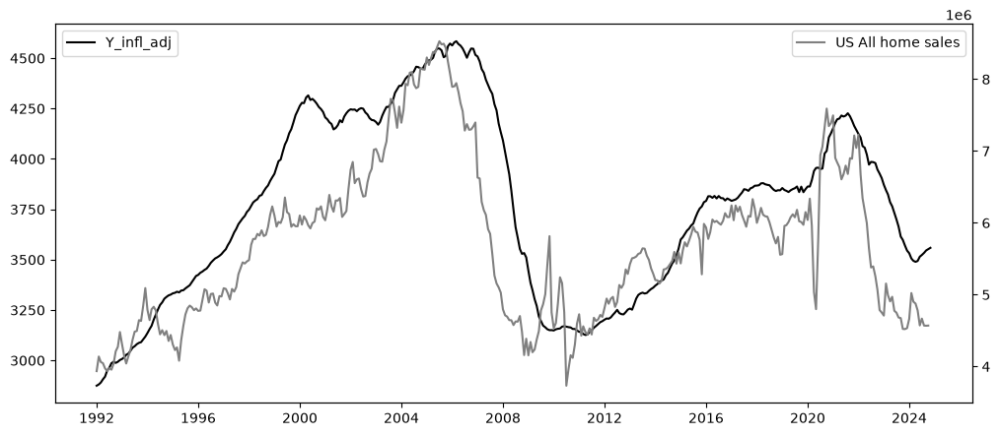

In [10]:
dual_plot_corr(df['Y_infl_adj'], df['US All home sales'])

PearsonRResult(statistic=np.float64(0.8753084626781963), pvalue=np.float64(4.4949629224536586e-126))

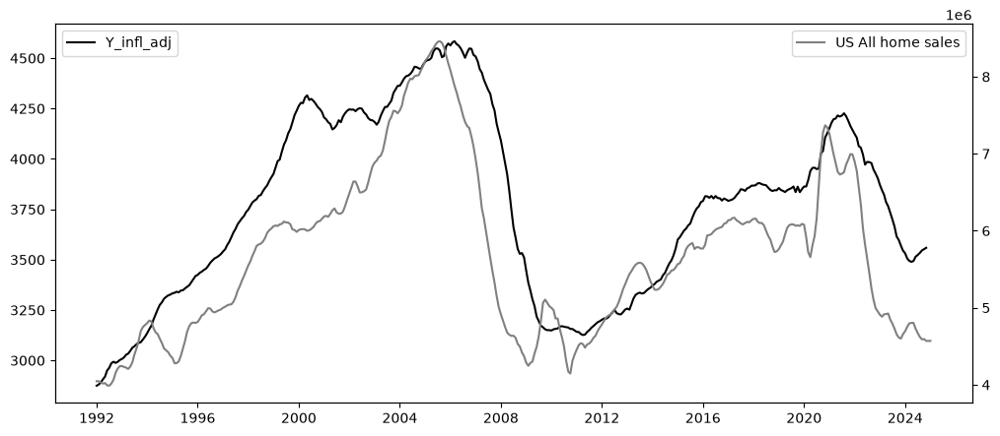

In [11]:
dual_plot_corr(df['Y_infl_adj'], df['US All home sales'].rolling(window=6, min_periods=1, center=True).mean())

PearsonRResult(statistic=np.float64(0.9223856986364619), pvalue=np.float64(3.952822849388735e-161))

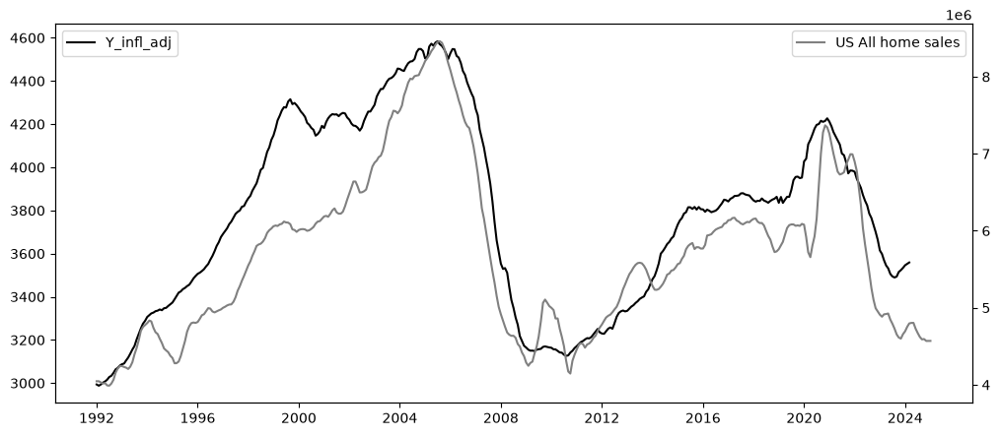

In [12]:
dual_plot_corr(df['Y_infl_adj'].shift(-8), df['US All home sales'].rolling(window=6, min_periods=1, center=True).mean())

### HF diminishing weight in US economy

#### HF inflation vs general inflation

<Axes: >

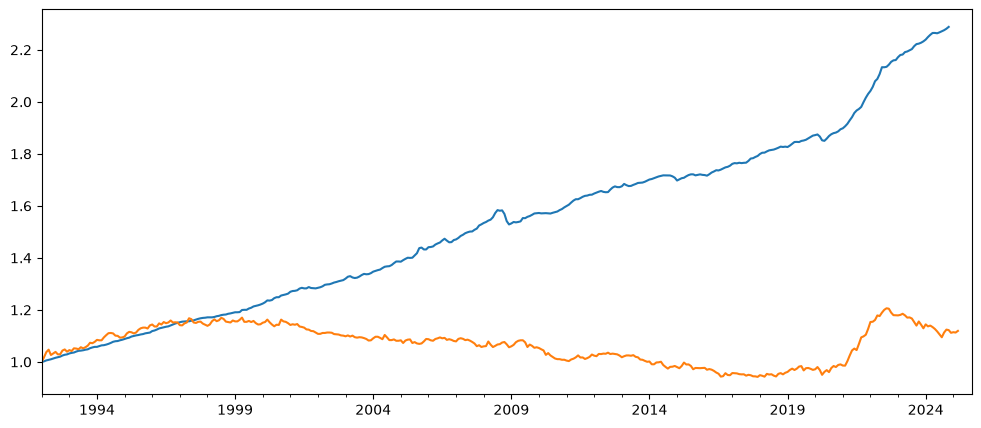

In [13]:
(df['Consumer Price Index'] / df['Consumer Price Index'].iloc[0]).plot()
(df['HF CPI'] / df['HF CPI'].iloc[0]).plot()

C:\Users\illoi\AppData\Local\Temp\ipykernel_36812\1651469774.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['HF Affordability index'] = (df['HF CPI'] / df['HF CPI'].iloc[0]) / (df['Consumer Price Index'] / df['Consumer Price Index'].iloc[0])


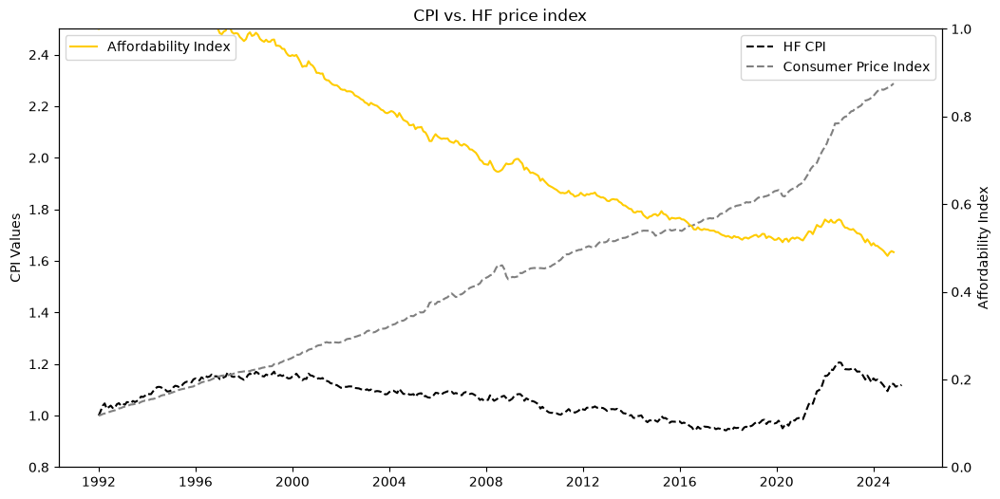

In [14]:
df['HF Affordability index'] = (df['HF CPI'] / df['HF CPI'].iloc[0]) / (df['Consumer Price Index'] / df['Consumer Price Index'].iloc[0])

# df[['HF CPI', 'Consumer Price Index']].plot(color=[color3, color1])
# ax2 = plt.twinx()
# ax2.plot(df['HF Affordability index'], color=color3, linestyle="--")

fig, ax1 = plt.subplots(figsize=(12,6))

# Plot HF CPI and CPI on primary y-axis
ax1.plot(df['HF CPI'] / df['HF CPI'].iloc[0], color=color1, label='HF CPI', linestyle="--")
ax1.plot(df['Consumer Price Index'] / df['Consumer Price Index'].iloc[0], color=color2, label='Consumer Price Index', linestyle="--")
ax1.set_ylim((0.8,2.5))
ax1.set_ylabel('CPI Values')
ax1.legend(loc='upper right')

# Create twin y-axis
ax2 = ax1.twinx()
ax2.plot(df['HF Affordability index'], color=color3, label='Affordability Index')
ax2.set_ylabel('Affordability Index')
ax2.legend(loc='upper left')
ax2.set_ylim((0,1))

plt.title('CPI vs. HF price index')
plt.show()

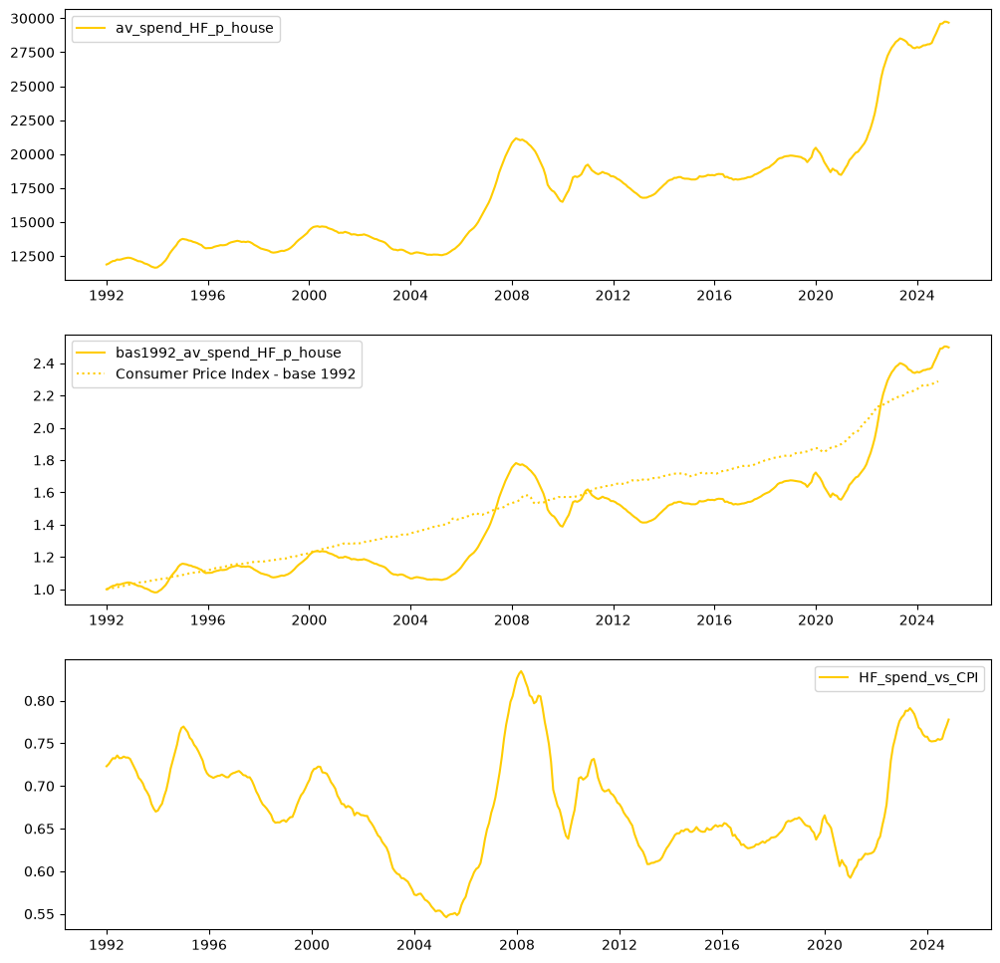

In [15]:
av_spend_HF_p_house_series = f * df['Y'] / df['US All home sales'].rolling(window=12, min_periods=1, center=True).mean()
bas1992_av_spend_HF_p_house_series = av_spend_HF_p_house_series / av_spend_HF_p_house_series.iloc[0]
HF_spend_vs_CPI_series = bas1992_av_spend_HF_p_house_series / df['Consumer Price Index']

fig, (ax1, ax2, ax3) = plt.subplots(3,1, figsize=(12,12))
ax1.plot(av_spend_HF_p_house_series, color=color3, label='av_spend_HF_p_house')
ax2.plot(bas1992_av_spend_HF_p_house_series, color=color3, label='bas1992_av_spend_HF_p_house')
ax2.plot(df['Consumer Price Index'] / df['Consumer Price Index'].iloc[0], linestyle=':', color=color3, label='Consumer Price Index - base 1992')
ax3.plot(HF_spend_vs_CPI_series, color=color3, label='HF_spend_vs_CPI')
ax1.legend()
ax2.legend()
ax3.legend()

#### GDP

PearsonRResult(statistic=np.float64(0.9086440979582737), pvalue=np.float64(1.633876948057627e-151))

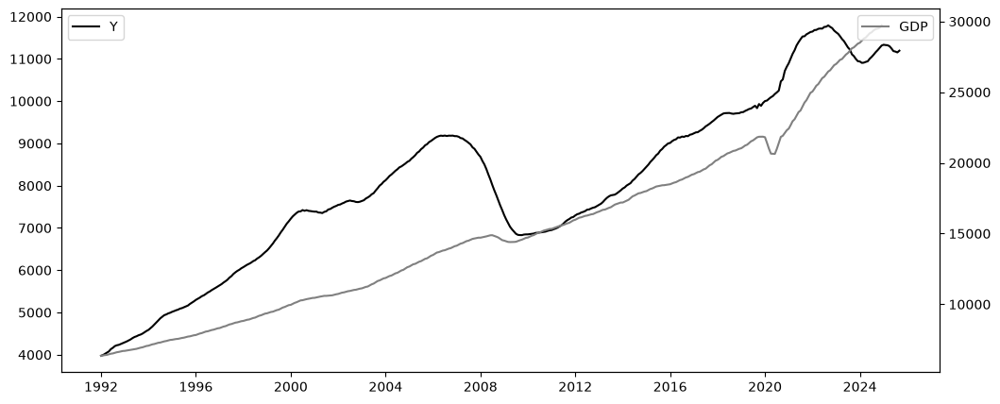

In [16]:
dual_plot_corr(df['Y'], df['GDP'])

PearsonRResult(statistic=np.float64(0.21312477222121848), pvalue=np.float64(2.038559633942622e-05))

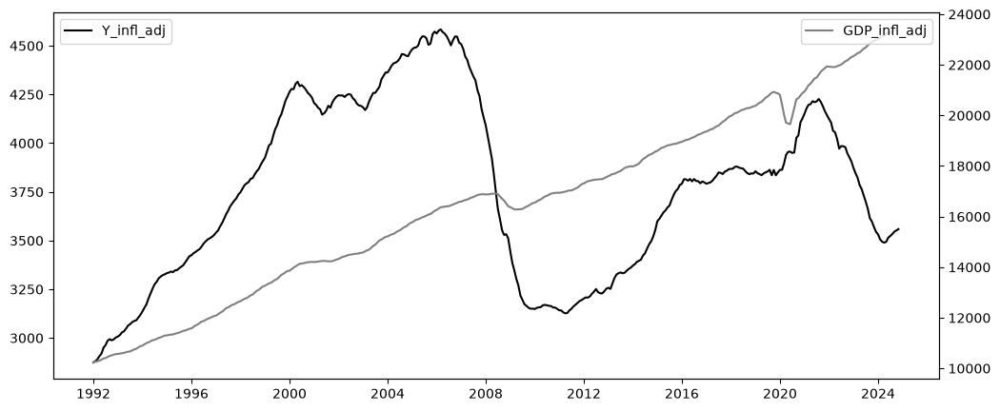

In [17]:
dual_plot_corr(df['Y_infl_adj'], df['GDP_infl_adj'])

In [18]:
df.index[df['Y_infl_adj'].argmax()]

Timestamp('2006-03-01 00:00:00')

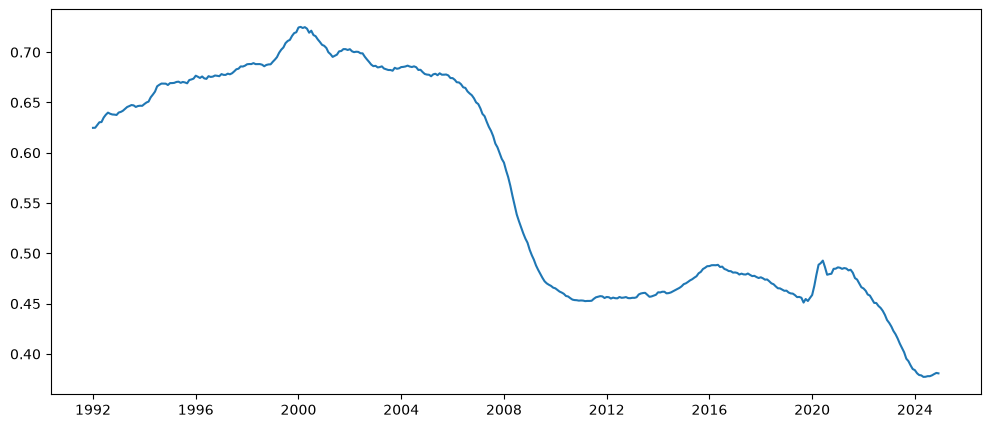

In [19]:
plt.plot(df['Y']/df['GDP'])

C:\Users\illoi\AppData\Local\Temp\ipykernel_36812\1164099131.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['Y_sh_GDP'] = df['Y']/df['GDP'] * 12/1e3
C:\Users\illoi\AppData\Local\Temp\ipykernel_36812\1164099131.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['Y_sh_GDP_infl_adj'] = df['Y_infl_adj']/df['GDP_infl_adj'] * 12/1e3  * df[df.index.year==2017]['Consumer Price Index'].mean()


PearsonRResult(statistic=np.float64(nan), pvalue=np.float64(nan))

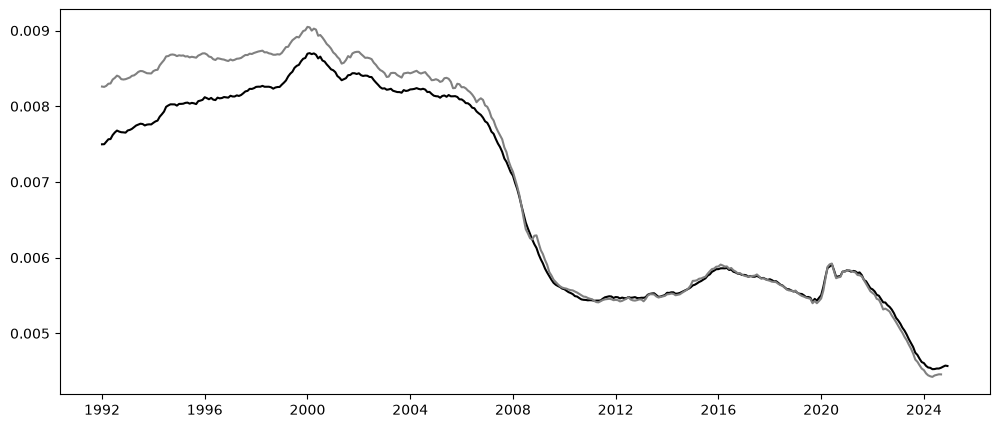

In [20]:
df['Y_sh_GDP'] = df['Y']/df['GDP'] * 12/1e3
df['Y_sh_GDP_infl_adj'] = df['Y_infl_adj']/df['GDP_infl_adj'] * 12/1e3  * df[df.index.year==2017]['Consumer Price Index'].mean()

plt.plot(df['Y_sh_GDP'], color='black')
plt.plot(df['Y_sh_GDP_infl_adj'], color='grey')

pearsonr(df['Y_sh_GDP'], df['Y_sh_GDP_infl_adj'])

In [21]:
df['Y_sh_GDP_av'] = (df['Y_sh_GDP'] + df['Y_sh_GDP_infl_adj']) / 2

C:\Users\illoi\AppData\Local\Temp\ipykernel_36812\3639019152.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['Y_sh_GDP_av'] = (df['Y_sh_GDP'] + df['Y_sh_GDP_infl_adj']) / 2


In [22]:
df['RE_sh_GDP'] = df['Real Estate - market sales']/df['GDP'] * 1/1e9

C:\Users\illoi\AppData\Local\Temp\ipykernel_36812\2282626805.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['RE_sh_GDP'] = df['Real Estate - market sales']/df['GDP'] * 1/1e9


PearsonRResult(statistic=np.float64(0.417000200403309), pvalue=np.float64(7.004487025508338e-18))

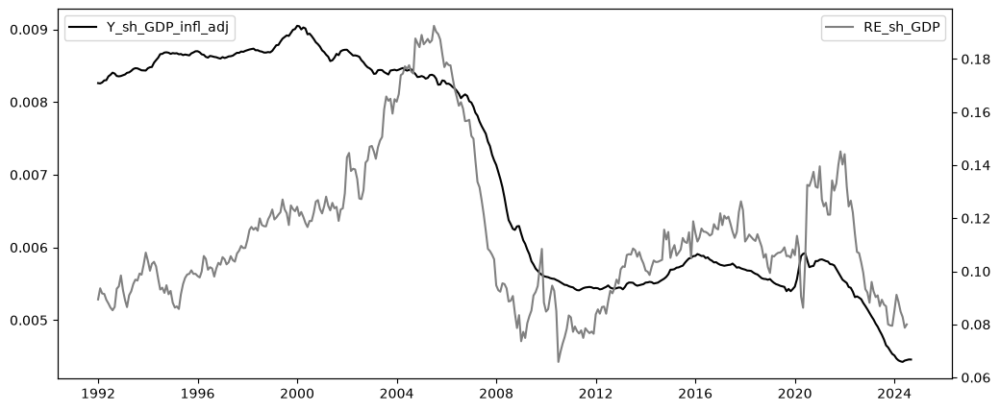

In [23]:
dual_plot_corr(df['Y_sh_GDP_infl_adj'], df['RE_sh_GDP'])

#### Declining weight of furnishing in the economy

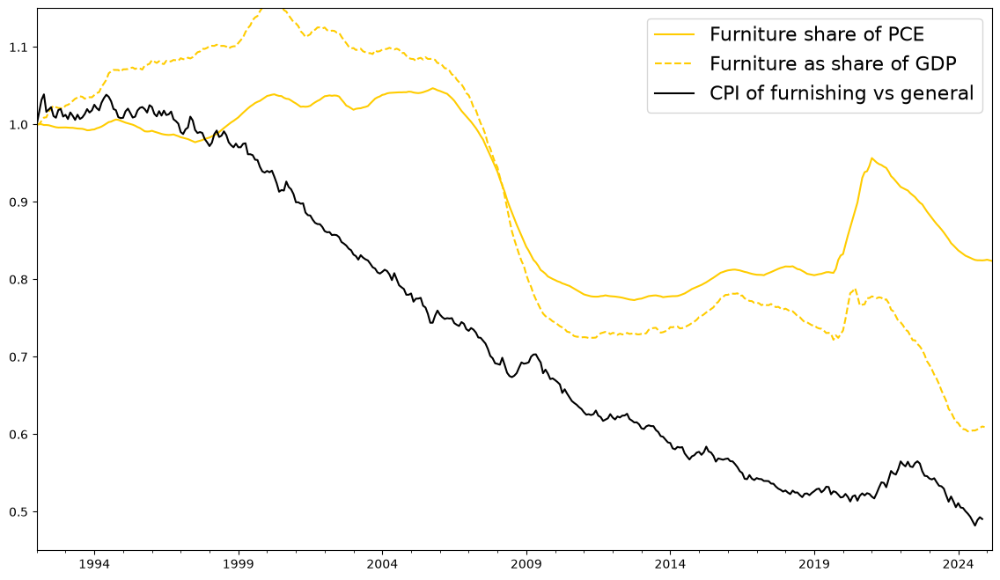

In [24]:
# plt.figure(figsize=(8.5, 8))
plt.figure(figsize=(14, 8))
(df['Furniture share of PCE'] / df['Furniture share of PCE'].iloc[0]).plot(color=color3, label='Furniture share of PCE')
(df['Y_sh_GDP'] / df['Y_sh_GDP'].iloc[0]).plot(color=color3, linestyle='--', label='Furniture as share of GDP')
(df['HF Affordability index']/df['HF Affordability index'].iloc[0]).plot(color=color1, label='CPI of furnishing vs general')
plt.ylim([0.45,1.15])
plt.xlim([datetime(1992, 1, 1), datetime(2025, 3, 1)])
plt.legend(fontsize=16)

C:\Users\illoi\AppData\Local\Temp\ipykernel_36812\671826668.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['HF share of PCE over afford'] = ((df['Furniture share of PCE'] / df['Furniture share of PCE'].iloc[0]) /
C:\Users\illoi\AppData\Local\Temp\ipykernel_36812\671826668.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['HF share of PCE over power afford'] = ((df['Furniture share of PCE'] / df['Furniture share of PCE'].iloc[0]) /


<Axes: >

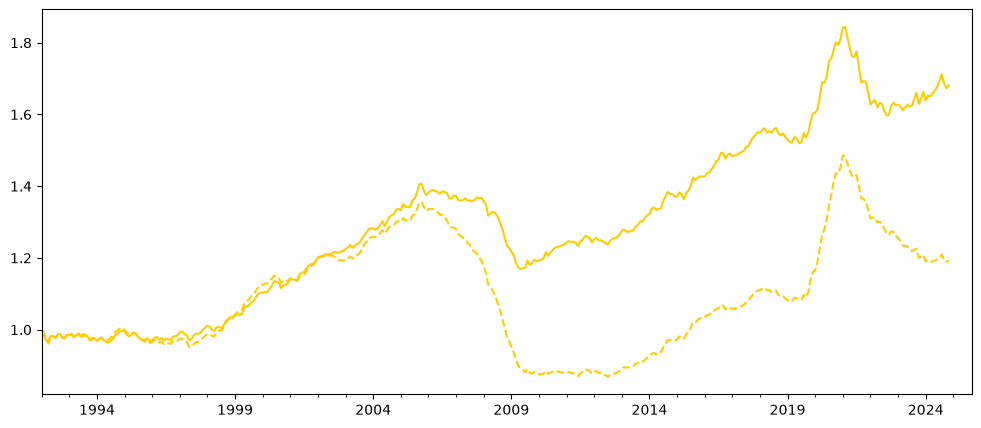

In [25]:
df['HF share of PCE over afford'] = ((df['Furniture share of PCE'] / df['Furniture share of PCE'].iloc[0]) / 
                                     (df['HF Affordability index']/df['HF Affordability index'].iloc[0]))

df['HF share of PCE over power afford'] = ((df['Furniture share of PCE'] / df['Furniture share of PCE'].iloc[0]) / 
                                     (df['HF Affordability index']/df['HF Affordability index'].iloc[0]) ** 0.4)

df['HF share of PCE over afford'].plot(color=color3)
(2*df['HF share of PCE over power afford'] - 1).plot(color=color3, linestyle='--')

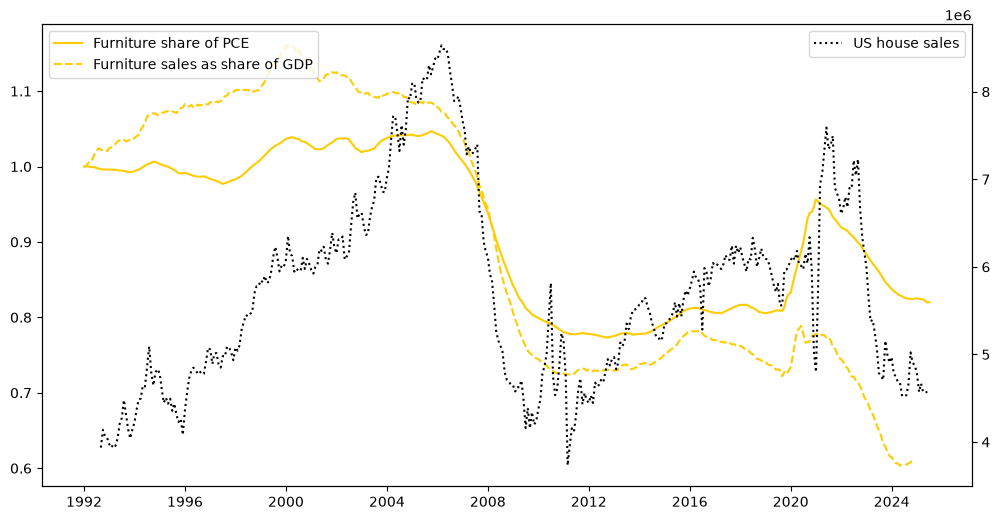

In [26]:
fig, ax1 = plt.subplots(1,1, figsize=(12,6))
ax1.plot((df['Furniture share of PCE'] / df['Furniture share of PCE'].iloc[0]), color=color3, label='Furniture share of PCE')
ax1.plot((df['Y_sh_GDP'] / df['Y_sh_GDP'].iloc[0]), color=color3, linestyle='--', label='Furniture sales as share of GDP')
ax1.legend(loc='upper left')
ax2 = ax1.twinx()
ax2.plot(df['US All home sales'].shift(8), color=color1, linestyle=':', label='US house sales')
ax2.legend(loc='upper right')

<Axes: >

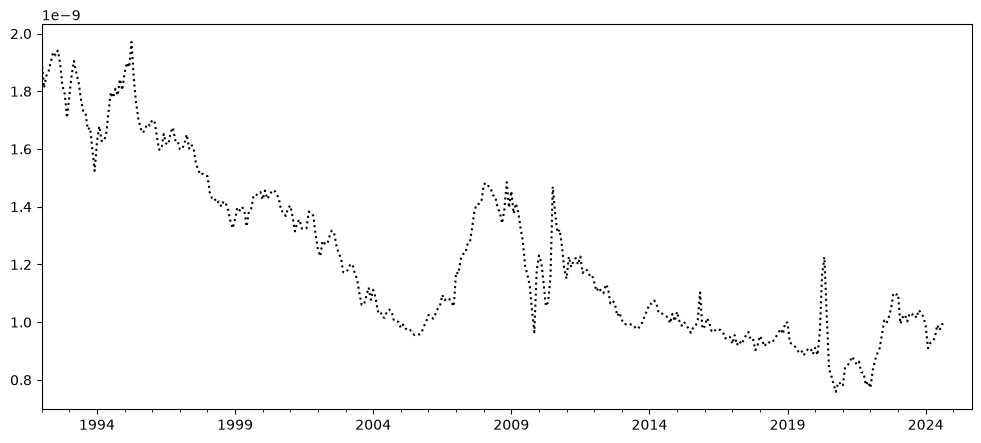

In [27]:
(df['Y_sh_GDP'] / df['US All home sales']).plot(color=color1, linestyle=':')

np.float64(0.7217809948653615)

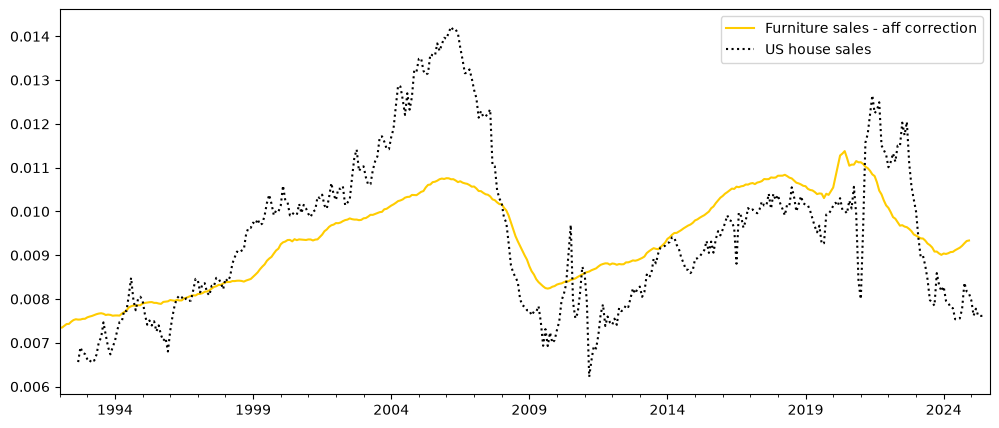

In [28]:
(df['Y_sh_GDP'] / df['HF Affordability index'].rolling(window=12, min_periods=1, center=True).mean()).plot(color=color3, label='Furniture sales - aff correction')
(df['US All home sales']/6e8).shift(8).plot(color=color1, linestyle=':', label='US house sales')
plt.legend()
df['US All home sales'].corr(df['Y_sh_GDP'] / df['HF Affordability index'].rolling(window=12, min_periods=1, center=True).mean())

### CCI

#### Consumption CCI

In [29]:
df.memory_usage().sum()/1e6

np.float64(1.27656)

<Axes: >

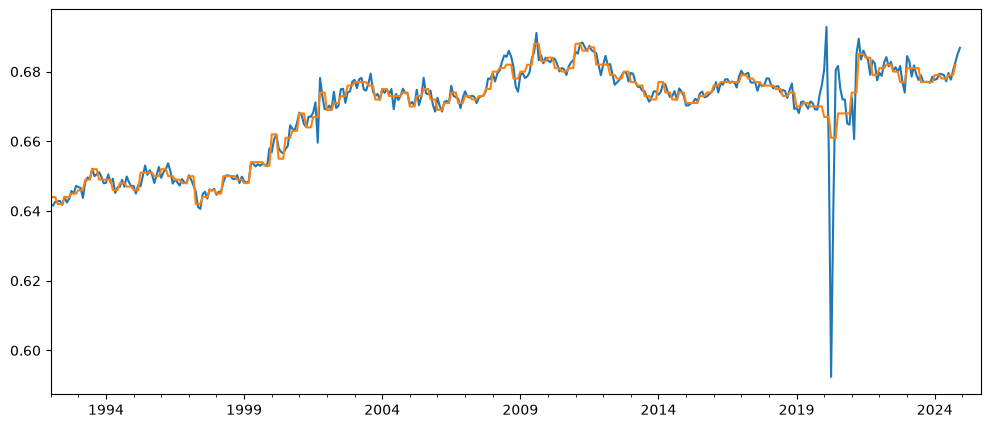

In [30]:
(df['Personal Consumption Expenditures'] / df['GDP']).plot()
(df['Personal consumption expenditures as share of GDP'] / 100).plot()

##### Comparing both indices

np.float64(0.6872474855483939)

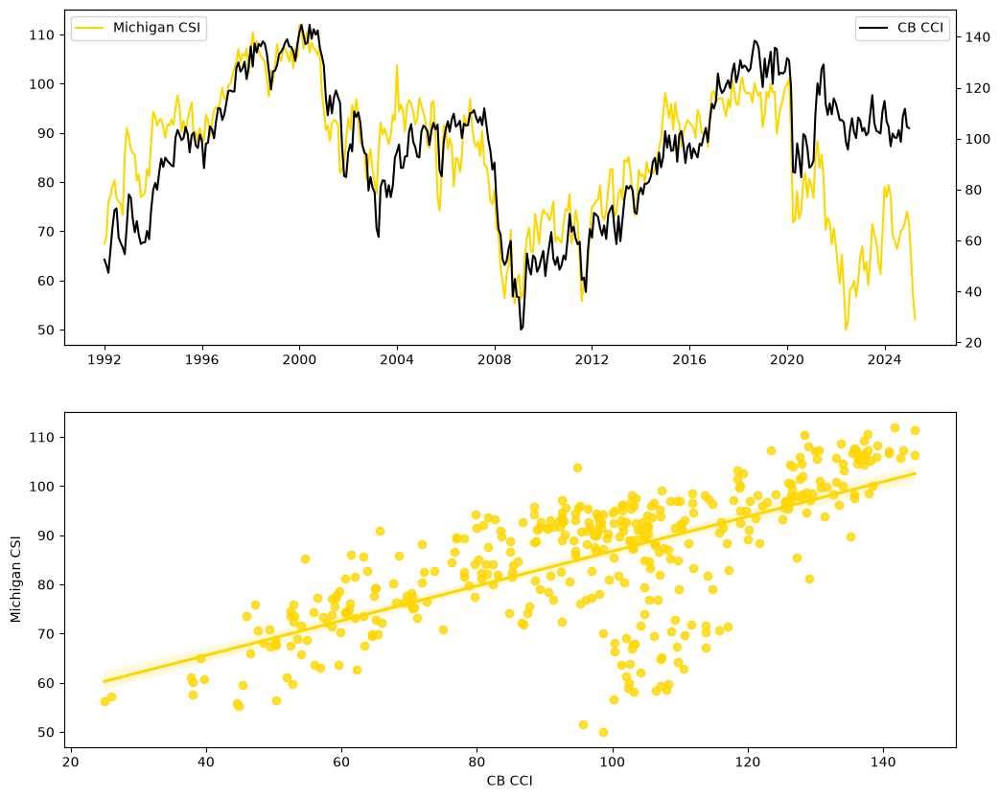

In [31]:
series_rel_plot(df['Michigan CSI'], df['CB CCI'])

np.float64(0.6611111181032203)

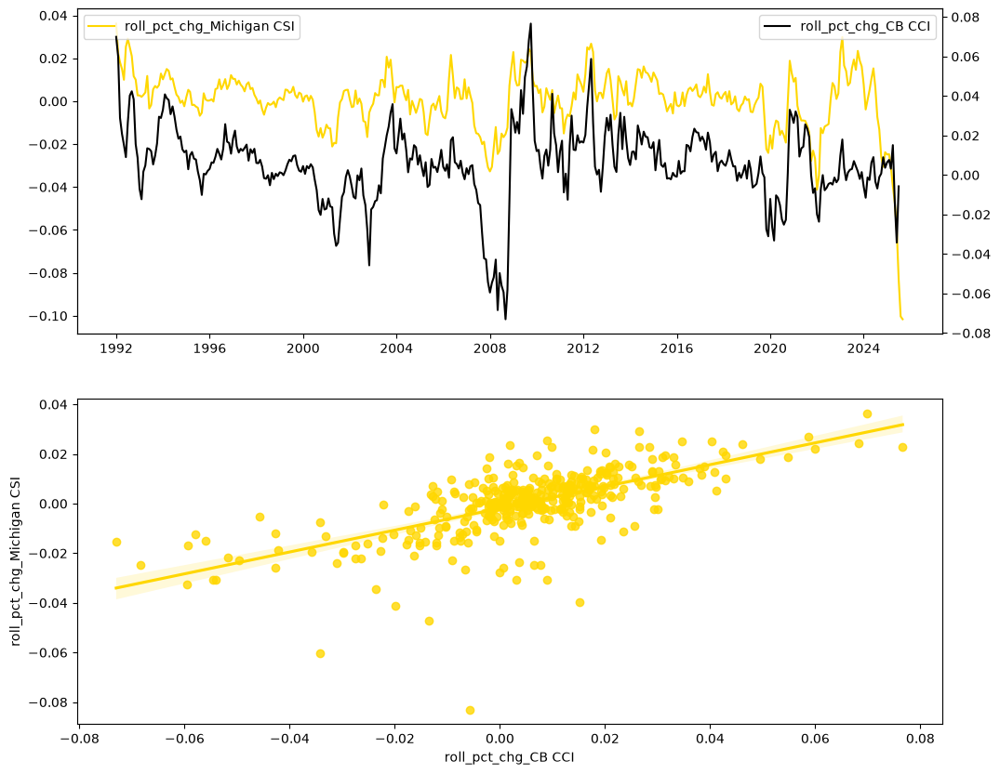

In [32]:
series_rel_plot(df['roll_pct_chg_Michigan CSI'], df['roll_pct_chg_CB CCI'])

##### As share of GDP

np.float64(-0.5333152173340547)

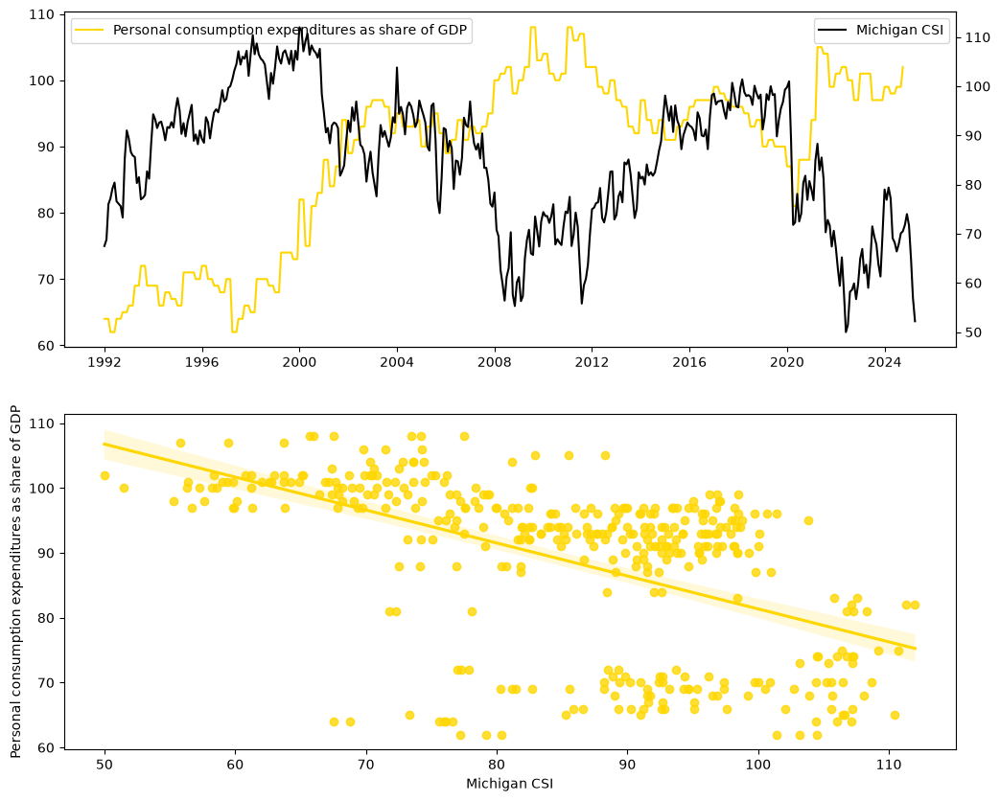

In [33]:
series_rel_plot(10 * (df['Personal consumption expenditures as share of GDP'] - 58), df['Michigan CSI'])

-10
-0.5900186652136169


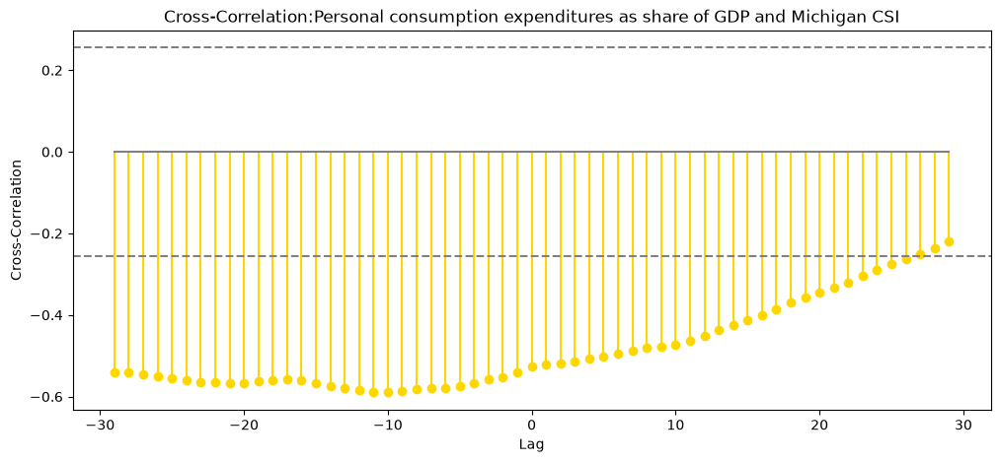

In [34]:
ccf_funct(df['Personal consumption expenditures as share of GDP'].dropna(), df['Michigan CSI'].dropna(), 30, both_sides=True);

PearsonRResult(statistic=np.float64(-0.267521682278517), pvalue=np.float64(6.972860128359217e-08))

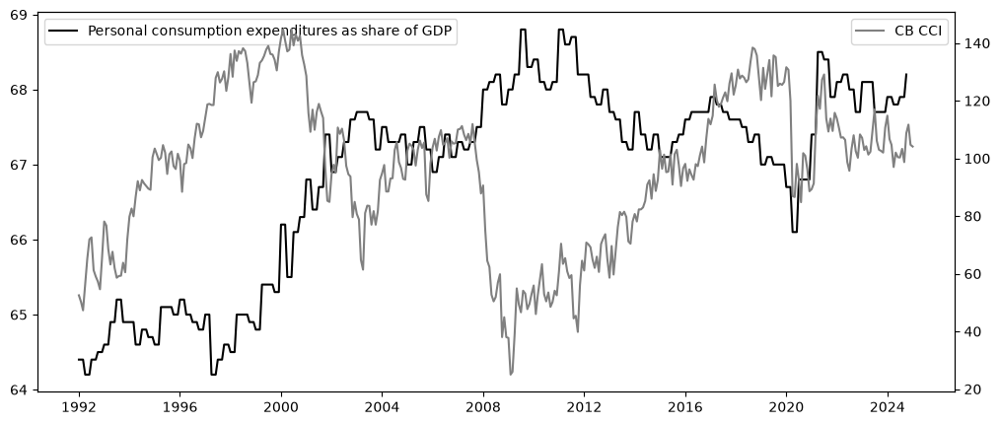

In [35]:
dual_plot_corr(df['Personal consumption expenditures as share of GDP'], df['CB CCI'])

##### Roll pct change

In [36]:
df['corr_roll_pct_chg_Personal Consumption Exp'] = df['roll_pct_chg_Personal Consumption Expenditures'].apply(lambda x: max(min(x, 0.012), -0.003))

C:\Users\illoi\AppData\Local\Temp\ipykernel_36812\1277690170.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['corr_roll_pct_chg_Personal Consumption Exp'] = df['roll_pct_chg_Personal Consumption Expenditures'].apply(lambda x: max(min(x, 0.012), -0.003))


np.float64(0.1541129437649726)

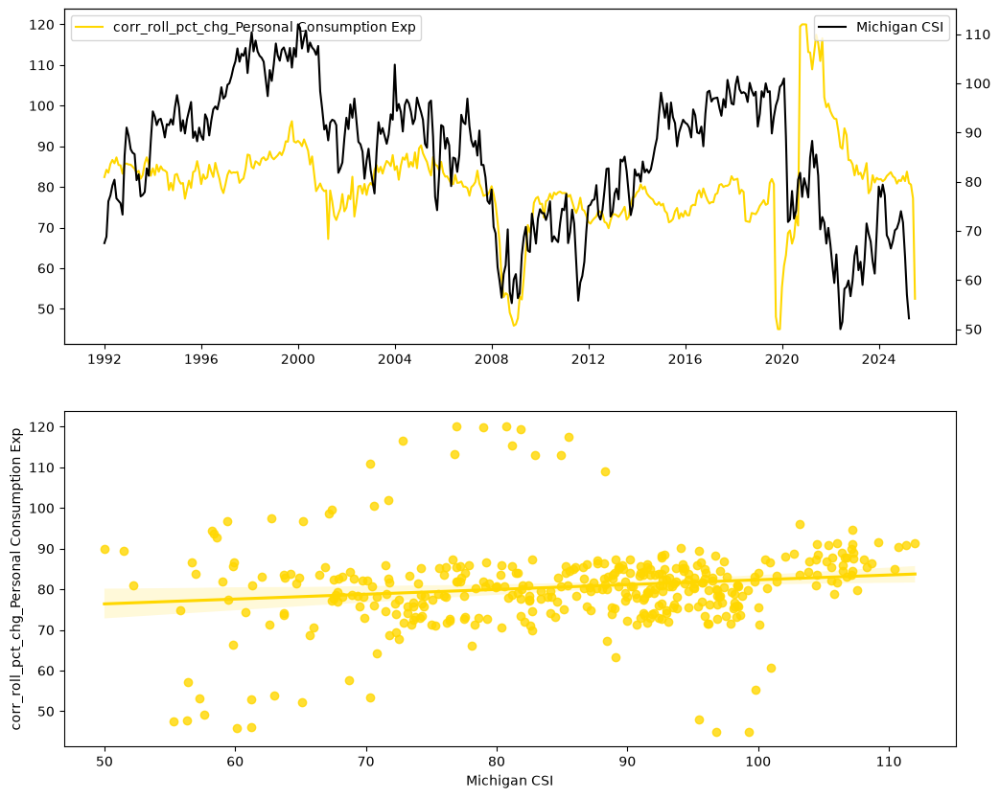

In [37]:
series_rel_plot(60 + 5e3 * df['corr_roll_pct_chg_Personal Consumption Exp'], df['Michigan CSI'])

0
nan


C:\Users\illoi\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\scipy\signal\_signaltools.py:257: RuntimeWarning: Use of fft convolution on input with NAN or inf results in NAN or inf output. Consider using method='direct' instead.
  return convolve(in1, _reverse_and_conj(in2, xp), mode, method)


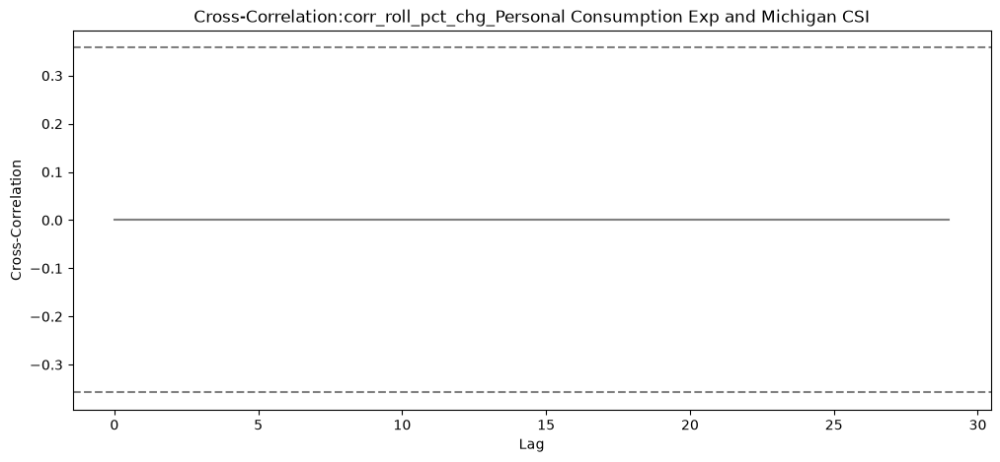

In [38]:
_ = ccf_funct(df['corr_roll_pct_chg_Personal Consumption Exp'], df['Michigan CSI'], 30)

np.float64(0.049724154481408586)

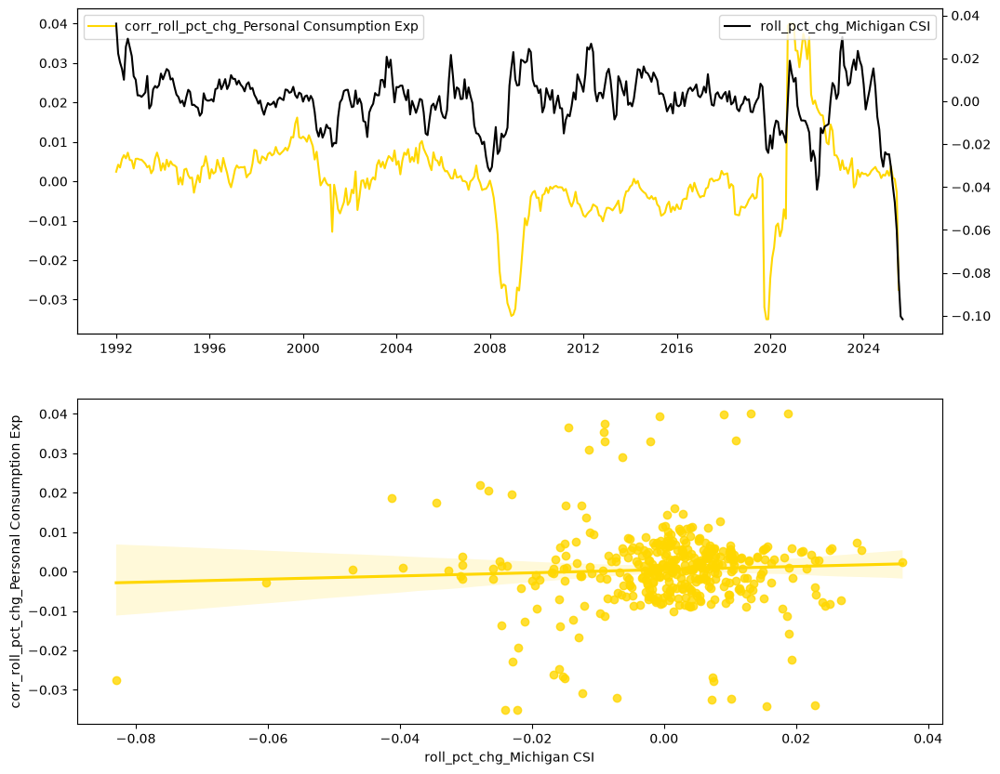

In [39]:
series_rel_plot(5 * df['corr_roll_pct_chg_Personal Consumption Exp'] - 0.02, df['roll_pct_chg_Michigan CSI'])

0
nan


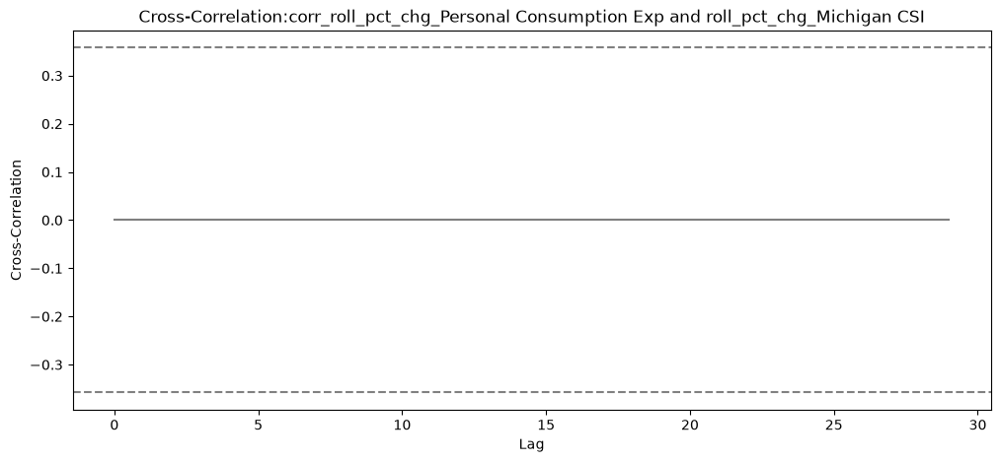

In [40]:
_ = ccf_funct(df['corr_roll_pct_chg_Personal Consumption Exp'], df['roll_pct_chg_Michigan CSI'], 30)

##### Checking inflation

<Axes: >

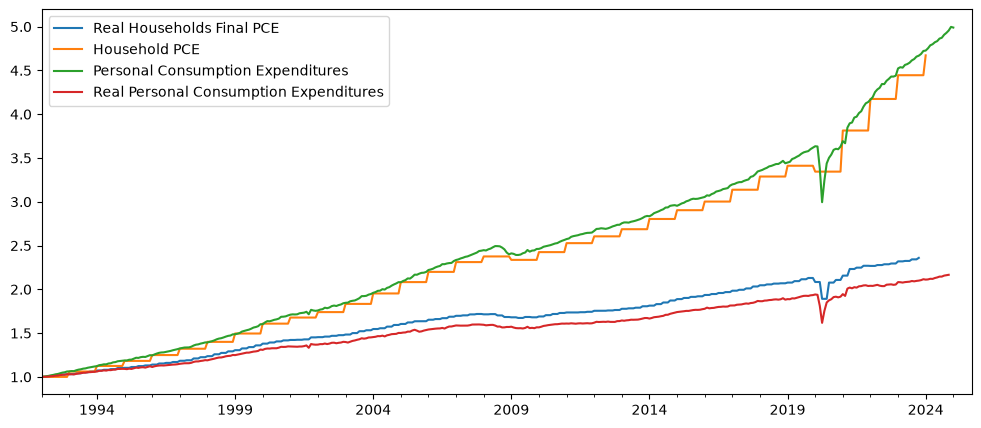

In [41]:
PCE_cols = ['Real Households Final PCE', 'Household PCE', 'Personal Consumption Expenditures', 'Real Personal Consumption Expenditures']
(df[PCE_cols] / df[PCE_cols].iloc[0,:]).plot()

(-0.01, 0.02)

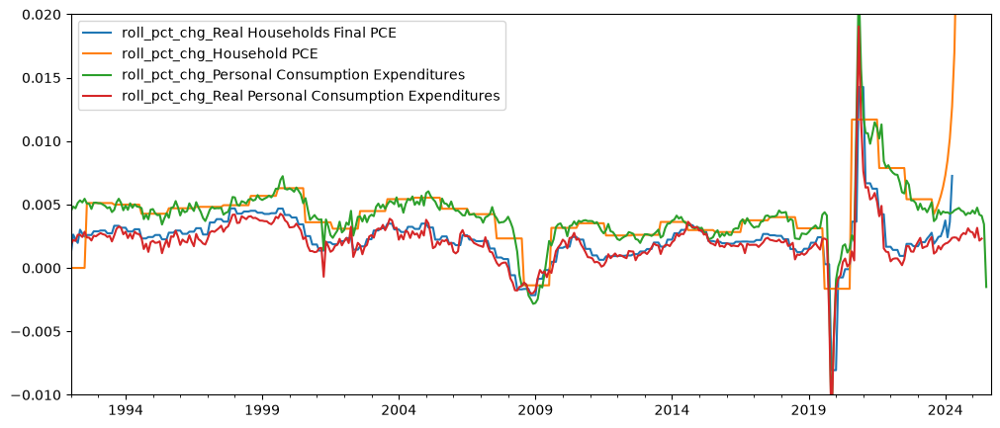

In [42]:
pct_PCE_cols = ['roll_pct_chg_Real Households Final PCE', 'roll_pct_chg_Household PCE', 
                'roll_pct_chg_Personal Consumption Expenditures', 'roll_pct_chg_Real Personal Consumption Expenditures']

df[pct_PCE_cols].plot()
plt.ylim([-0.01,0.02])

<Axes: >

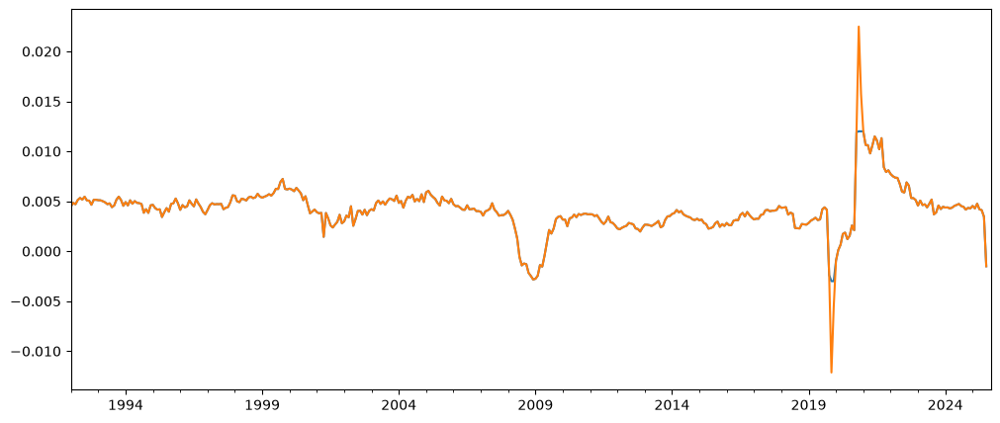

In [43]:
df['corr_roll_pct_chg_Personal Consumption Exp'].plot()
df['roll_pct_chg_Personal Consumption Expenditures'].plot()

<Axes: >

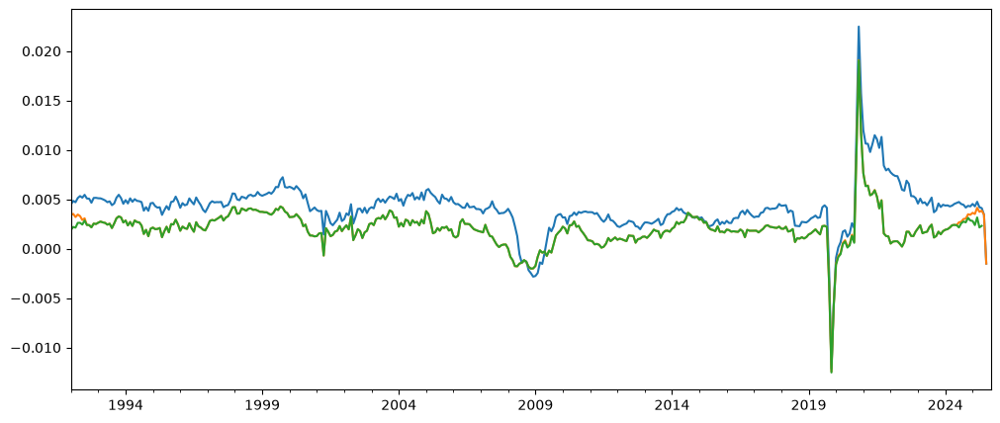

In [44]:
(df['roll_pct_chg_Personal Consumption Expenditures']).plot()
(df['roll_pct_chg_Personal Consumption Expenditures'] - 1/12 * df['12M_roll_inflation']).plot()
df['roll_pct_chg_Real Personal Consumption Expenditures'].plot()

##### Real Personal Consumption Expenditures

C:\Users\illoi\AppData\Local\Temp\ipykernel_36812\2017183182.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['corr_roll_pct_chg_Real Personal Consumption Exp'] = df['roll_pct_chg_Real Personal Consumption Expenditures'].apply(lambda x: max(min(x, 0.005), -0.002))


<Axes: >

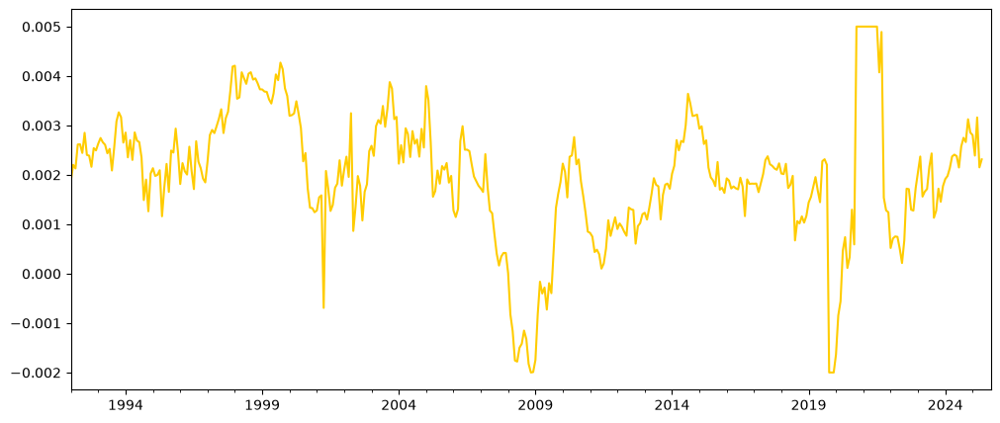

In [45]:
df['corr_roll_pct_chg_Real Personal Consumption Exp'] = df['roll_pct_chg_Real Personal Consumption Expenditures'].apply(lambda x: max(min(x, 0.005), -0.002))
df['corr_roll_pct_chg_Real Personal Consumption Exp'].plot(color=color3)

np.float64(0.4355885472703095)

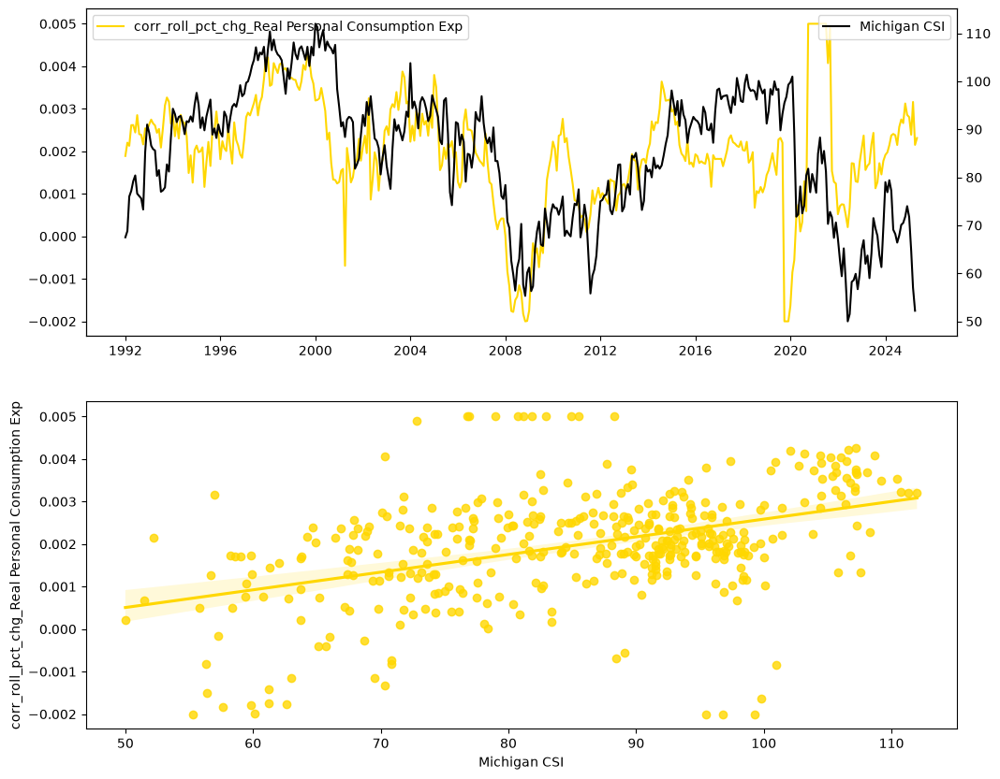

In [46]:
series_rel_plot(df['corr_roll_pct_chg_Real Personal Consumption Exp'], df['Michigan CSI'])

C:\Users\illoi\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\scipy\signal\_signaltools.py:257: RuntimeWarning: Use of fft convolution on input with NAN or inf results in NAN or inf output. Consider using method='direct' instead.
  return convolve(in1, _reverse_and_conj(in2, xp), mode, method)


-29
nan


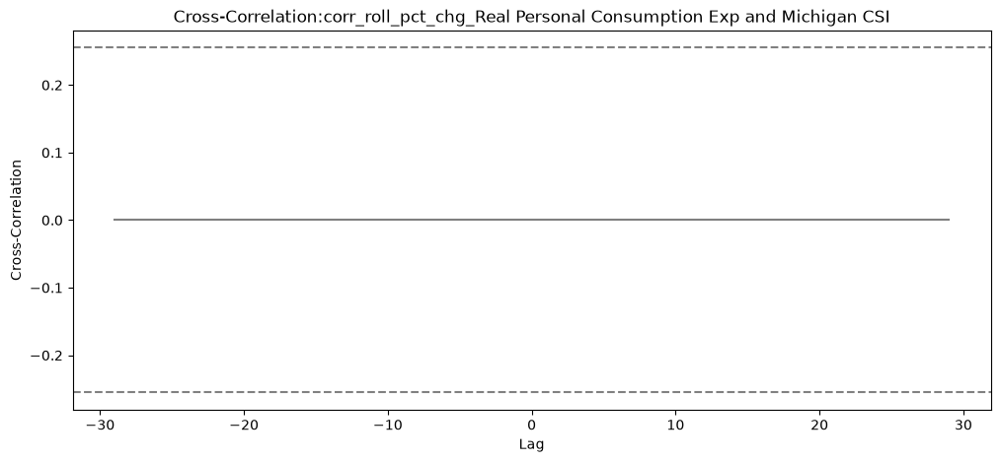

In [47]:
_ = ccf_funct(df['corr_roll_pct_chg_Real Personal Consumption Exp'], df['Michigan CSI'], 30, both_sides=True)

np.float64(0.5310542175252442)

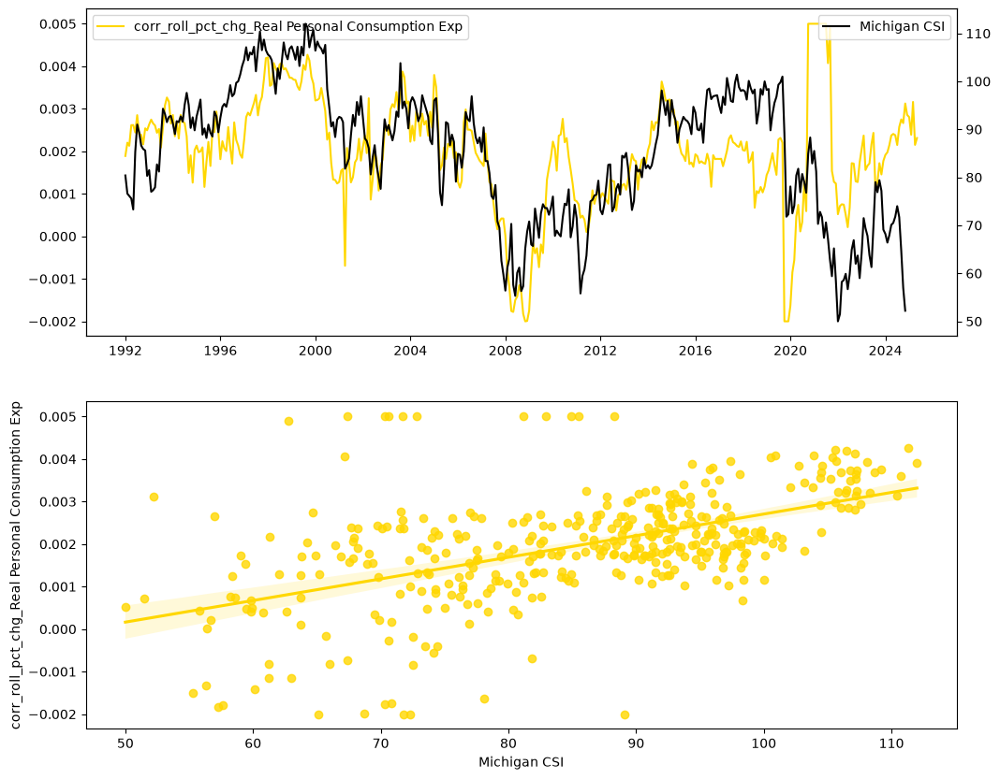

In [48]:
series_rel_plot(df['corr_roll_pct_chg_Real Personal Consumption Exp'], df['Michigan CSI'].shift(-5))

##### Short df

<Axes: >

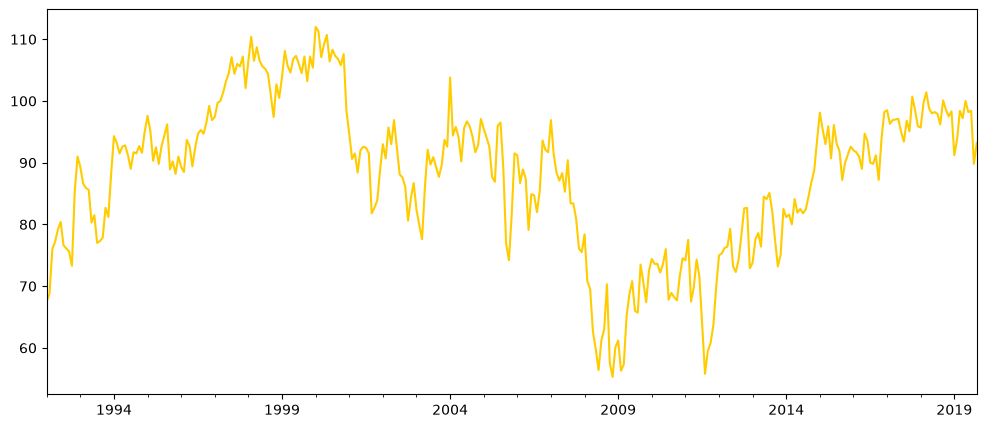

In [49]:
short_df = df[df.index < "2019-10-01"]
# short_df = df[df.index > "2021-01-01"]
# short_df = df[(df.index < "2019-10-01") | (df.index > "2021-05-01")]
short_df['Michigan CSI'].plot(color=color3)

np.float64(0.6731098807286349)

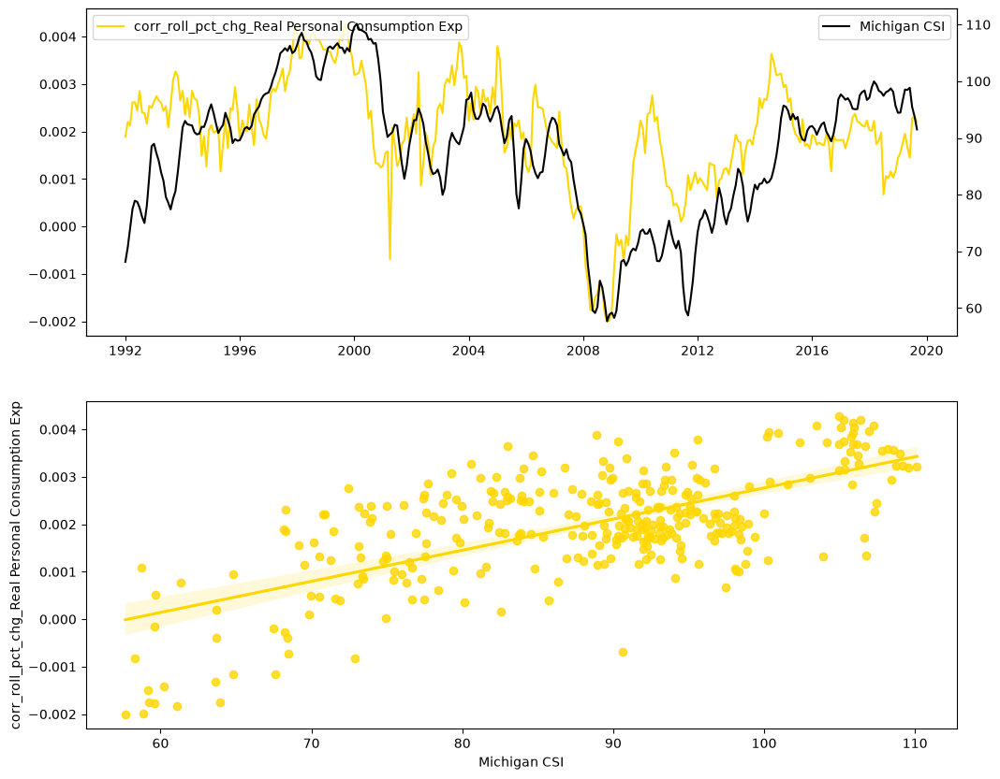

In [50]:
series_rel_plot(short_df['corr_roll_pct_chg_Real Personal Consumption Exp'], short_df['Michigan CSI'].rolling(window=3, min_periods=1, center=True).mean())

-5
0.7459245729316398


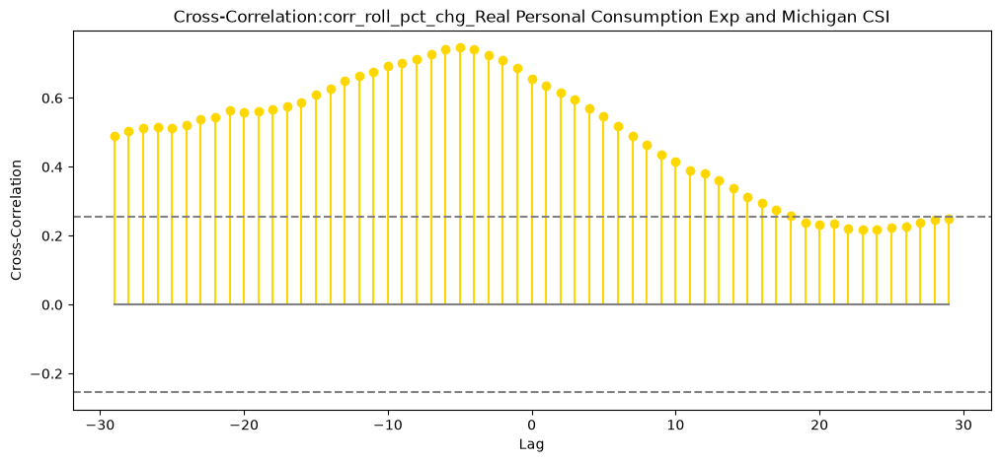

In [51]:
_ = ccf_funct(short_df['corr_roll_pct_chg_Real Personal Consumption Exp'], 
              short_df['Michigan CSI'], 30, both_sides=True)

-5
0.7437411700359973


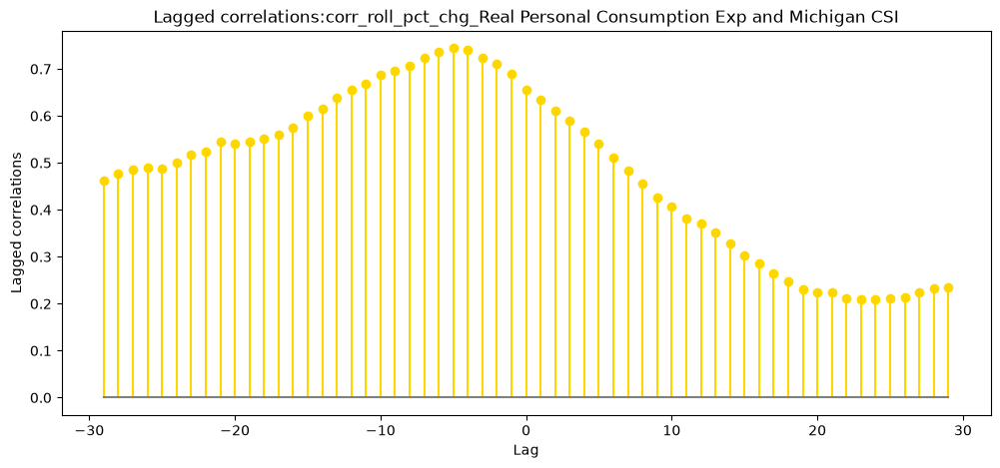

In [52]:
pce_MCSI_vals = lagged_corr_plot(short_df['corr_roll_pct_chg_Real Personal Consumption Exp'], short_df['Michigan CSI'], 30, both_sides=True)
print(pce_MCSI_vals.argmax() - 29)
print(pce_MCSI_vals.max())

np.float64(0.7437411700359972)

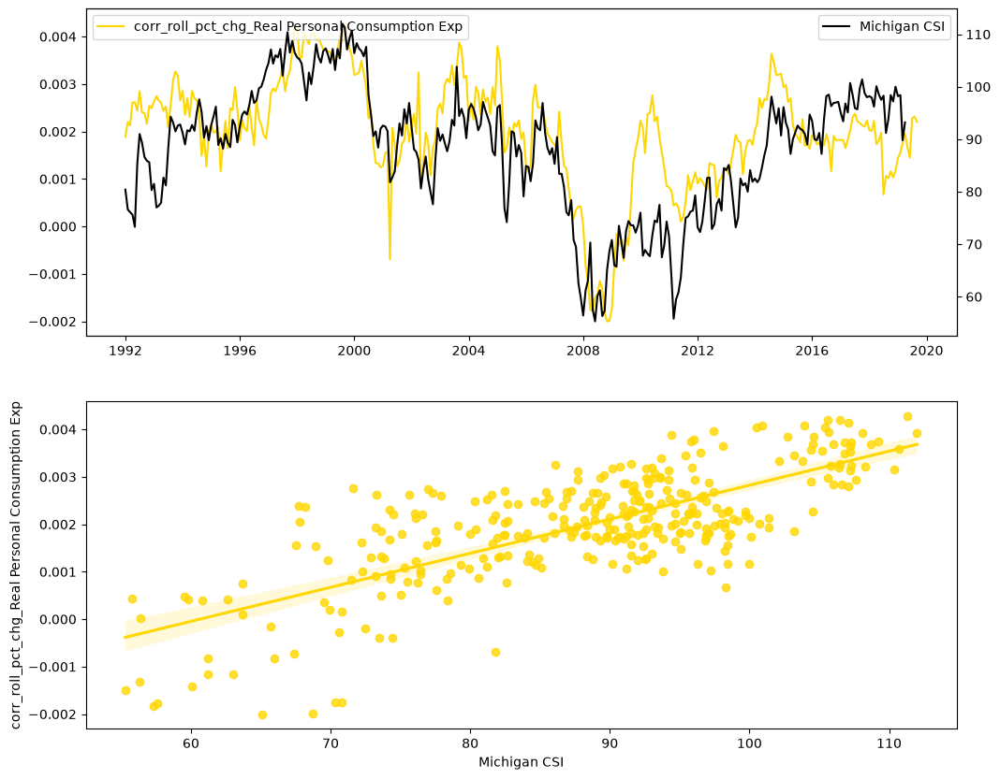

In [53]:
series_rel_plot(short_df['corr_roll_pct_chg_Real Personal Consumption Exp'], short_df['Michigan CSI'].shift(-5))

##### Final

np.float64(0.6035080678702511)

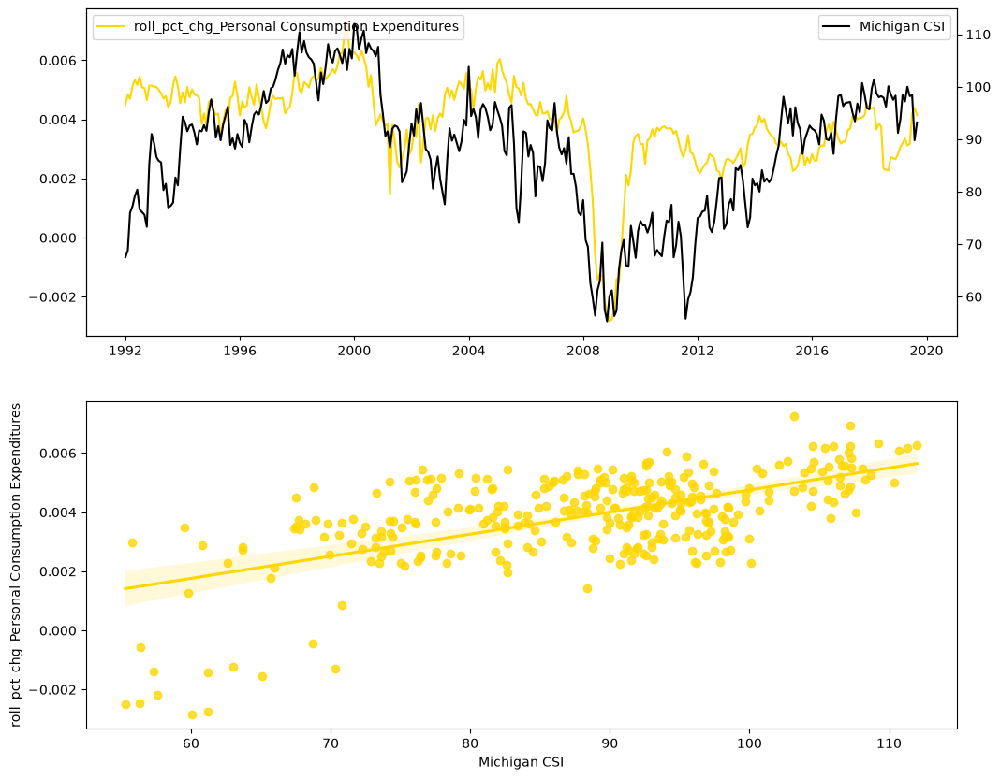

In [54]:
series_rel_plot(short_df['roll_pct_chg_Personal Consumption Expenditures'], short_df['Michigan CSI'])

-1
0.6090217179569396


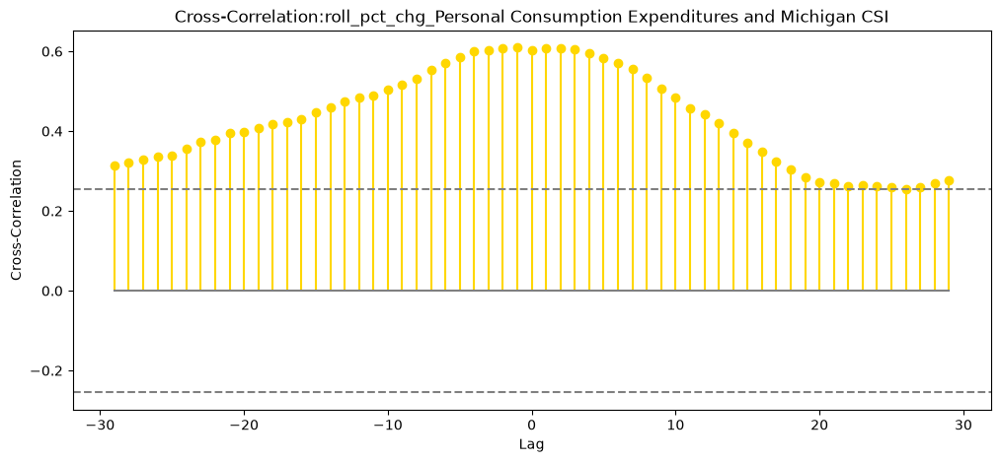

In [55]:
_ = ccf_funct(short_df['roll_pct_chg_Personal Consumption Expenditures'], short_df['Michigan CSI'], 30, both_sides=True)

-1
0.6097901154730307


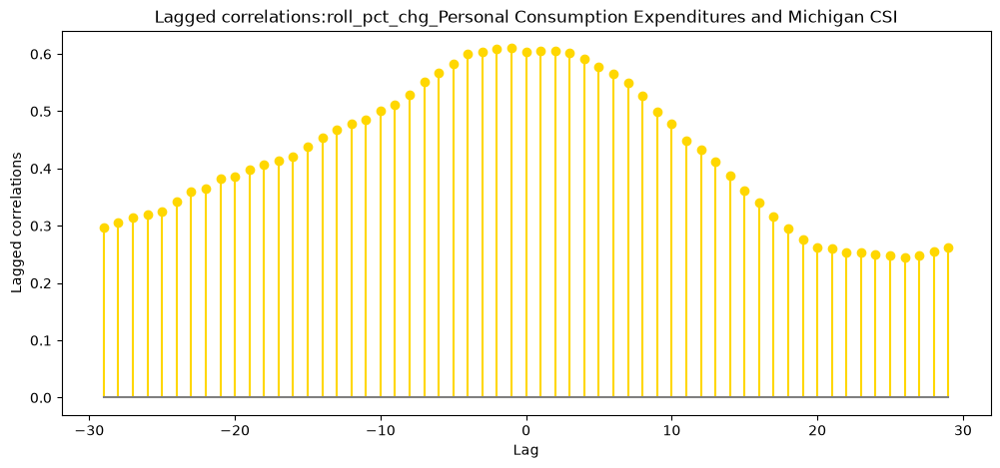

In [56]:
pce_MCSI_vals = lagged_corr_plot(short_df['roll_pct_chg_Personal Consumption Expenditures'], short_df['Michigan CSI'], 30, both_sides=True)
print(pce_MCSI_vals.argmax() - 29)
print(pce_MCSI_vals.max())

np.float64(0.6097901154730307)

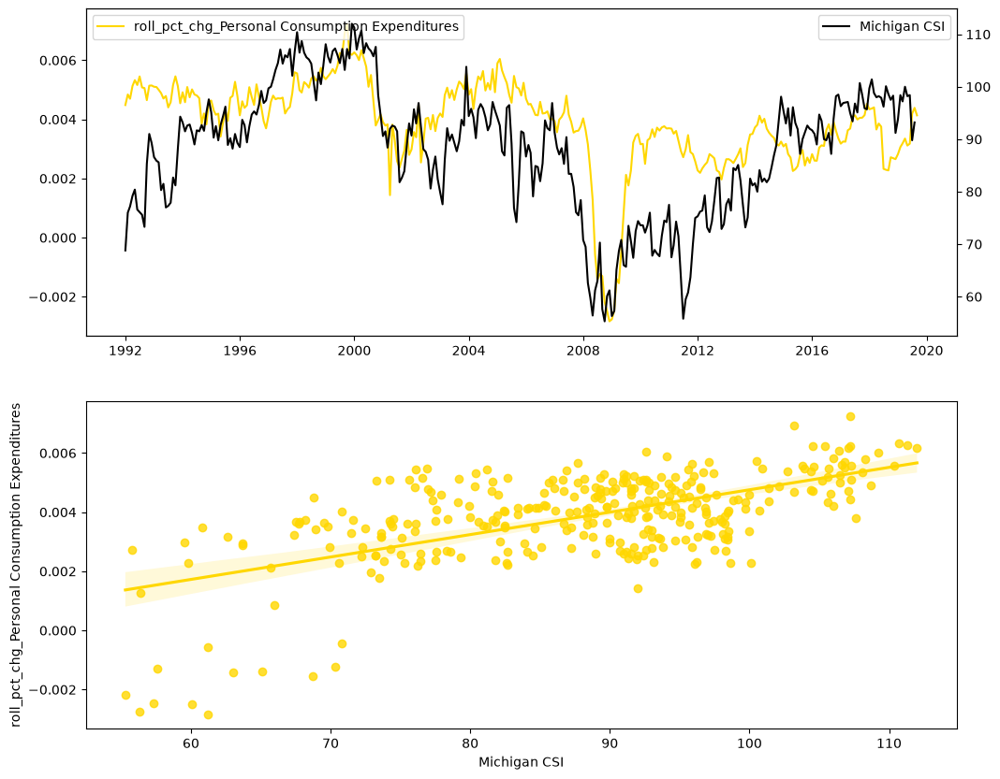

In [57]:
series_rel_plot(short_df['roll_pct_chg_Personal Consumption Expenditures'], short_df['Michigan CSI'].shift(-1))

##### Max period - Consumption vs CSI

In [58]:
aux_df = result_df[['Personal Consumption Expenditures', 'Michigan CSI', 'Consumer Price Index']].dropna()

aux_df = aux_df[aux_df.index > "1984-01-01"]
aux_df = aux_df[aux_df.index < "2019-10-01"]

aux_df['Inflation'] = aux_df['Consumer Price Index'].ffill().pct_change()
aux_df['12M_roll_inflation'] = aux_df['Inflation'].fillna(0).rolling(window=12, min_periods=1, center=True).sum()

aux_df['roll_pct_chg_PCE'] = aux_df['Personal Consumption Expenditures'].ffill().pct_change().rolling(window=12, min_periods=1, center=True).mean()
aux_df['roll_pct_chg_RPCE'] = (aux_df['Personal Consumption Expenditures'] / result_df['Consumer Price Index']).ffill().pct_change().rolling(window=12, min_periods=1, center=True).mean()

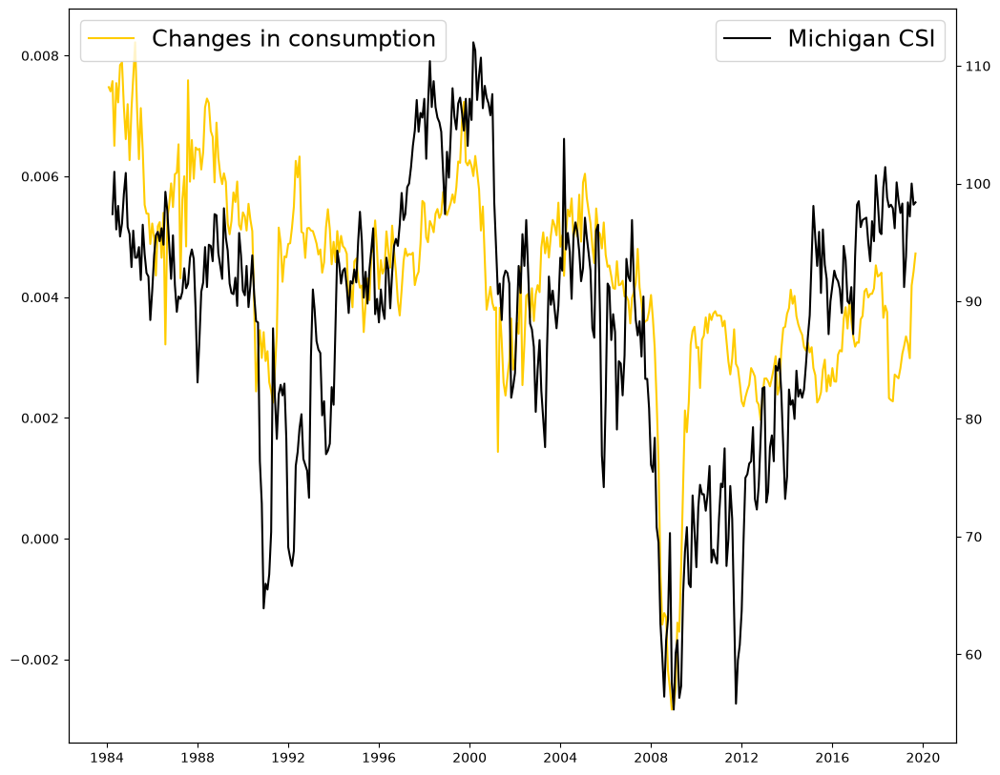

In [59]:
s_1 = aux_df['roll_pct_chg_PCE']
s_2 =  aux_df['Michigan CSI'].shift(2)

plt.figure(figsize=(12,10))
label1, label2 = ['Changes in consumption', s_2.name]

plt.plot(s_1, color=color3, label=label1)
plt.legend(loc='upper left', fontsize=17)
ax2 = plt.twinx()
ax2.plot(s_2, color=color1, label=label2)
ax2.legend(loc='upper right', fontsize=17)

<Axes: xlabel='Michigan CSI', ylabel='roll_pct_chg_PCE'>

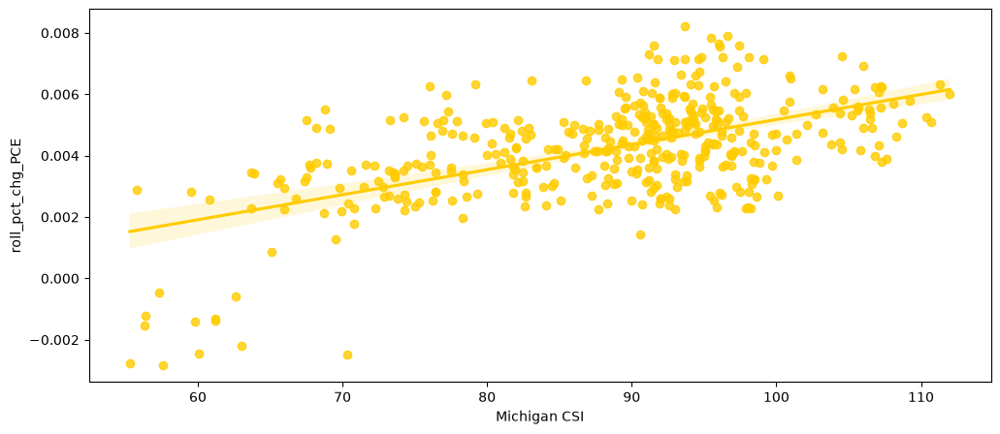

In [60]:
sns.regplot(x=s_2, y=s_1, color=color3)

np.float64(0.5705529069477424)

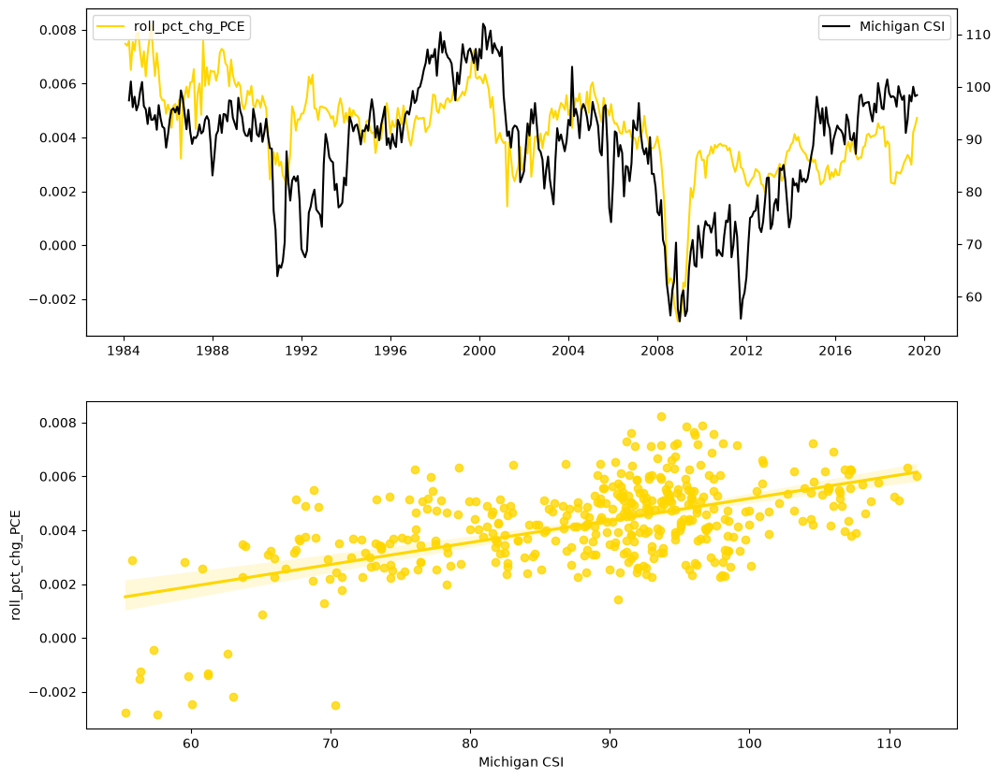

In [61]:
series_rel_plot(aux_df['roll_pct_chg_PCE'], aux_df['Michigan CSI'].shift(2))

-1
0.6090217179569396


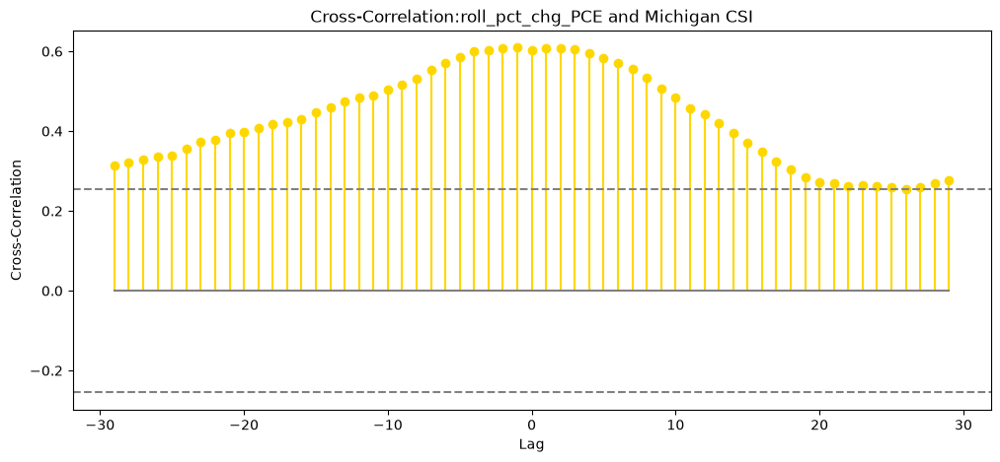

In [62]:
_ = ccf_funct(short_df['roll_pct_chg_PCE'], short_df['Michigan CSI'], 30, both_sides=True)

##### Consumption vs CSI - COVID

In [63]:
covid_df = df[df.index >= "2018-01-01"]

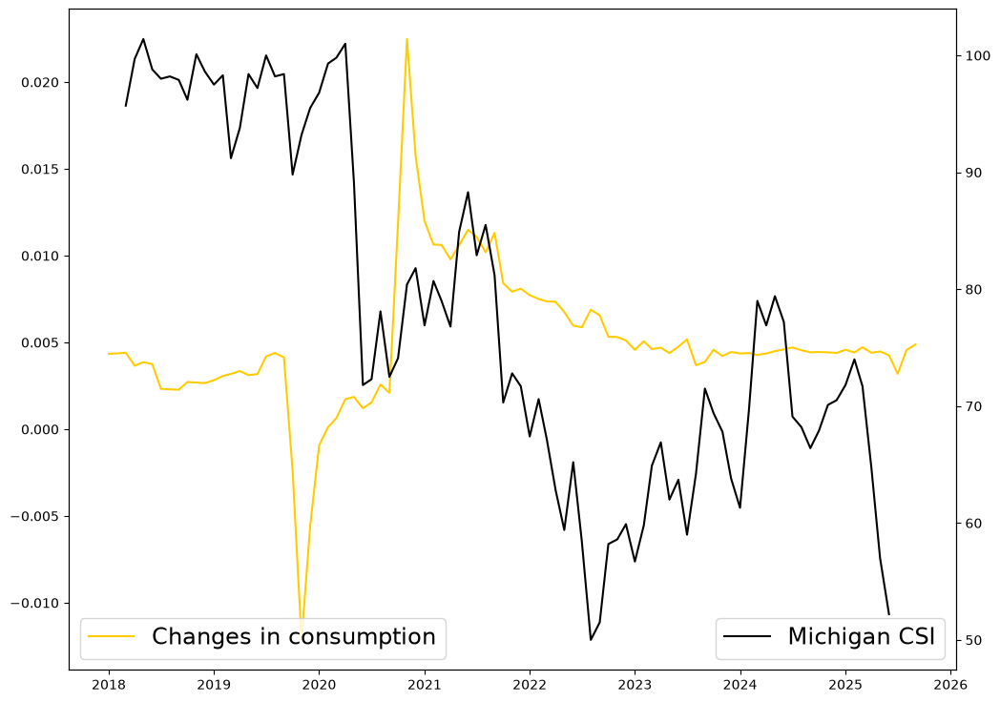

In [64]:
s_1 = covid_df['roll_pct_chg_PCE']
s_2 =  covid_df['Michigan CSI'].shift(2)

plt.figure(figsize=(12,9))
label1, label2 = ['Changes in consumption', s_2.name]

plt.plot(s_1, color=color3, label=label1)
plt.legend(loc='lower left', fontsize=17)
ax2 = plt.twinx()
ax2.plot(s_2, color=color1, label=label2)
ax2.legend(loc='lower right', fontsize=17)

<Axes: xlabel='Michigan CSI', ylabel='roll_pct_chg_PCE'>

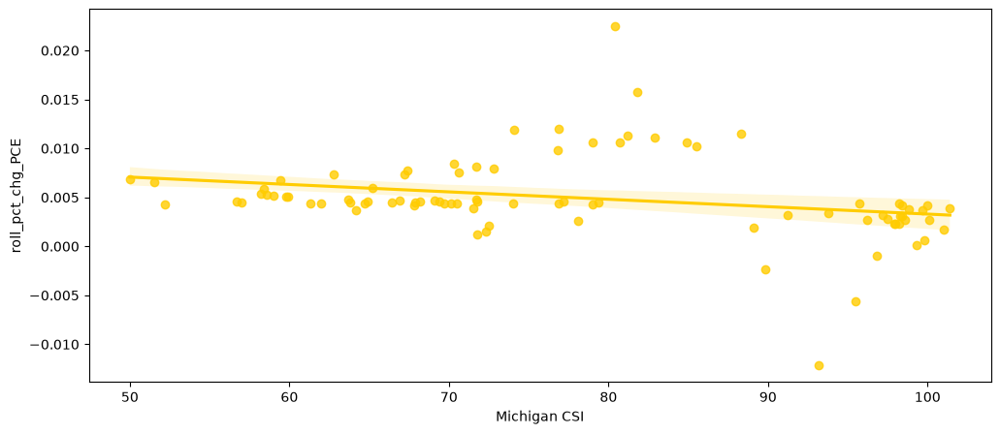

In [65]:
sns.regplot(x=s_2, y=s_1, color=color3)

np.float64(-0.26978509979575466)

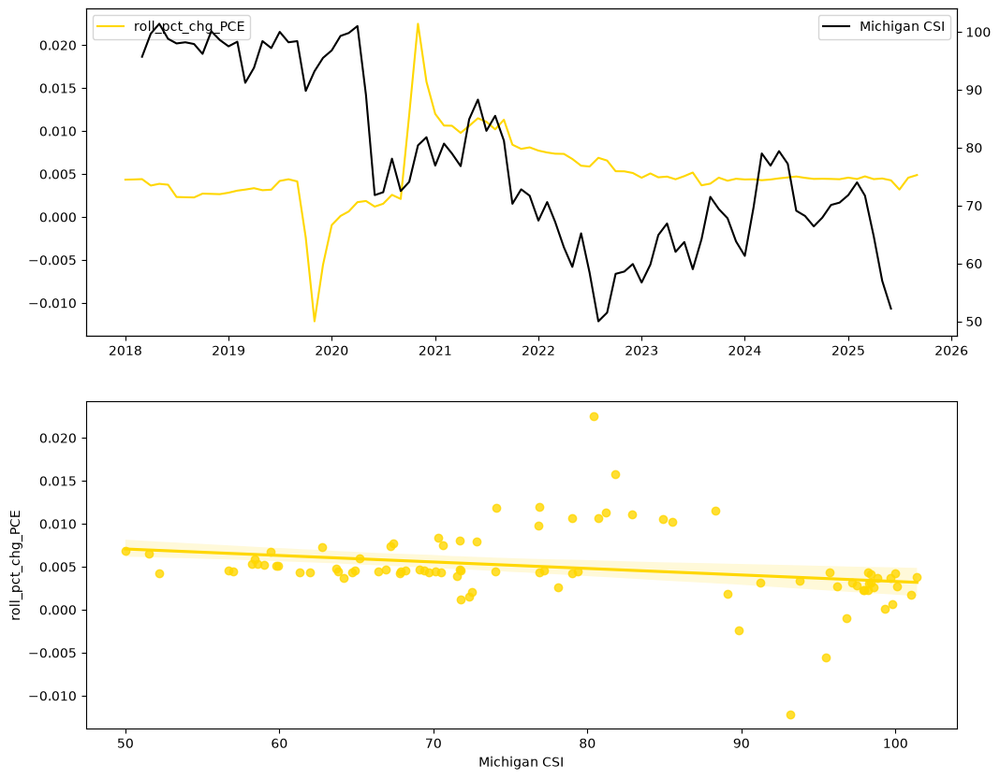

In [66]:
series_rel_plot(covid_df['roll_pct_chg_PCE'], covid_df['Michigan CSI'].shift(2))

-29
nan


C:\Users\illoi\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\scipy\signal\_signaltools.py:257: RuntimeWarning: Use of fft convolution on input with NAN or inf results in NAN or inf output. Consider using method='direct' instead.
  return convolve(in1, _reverse_and_conj(in2, xp), mode, method)


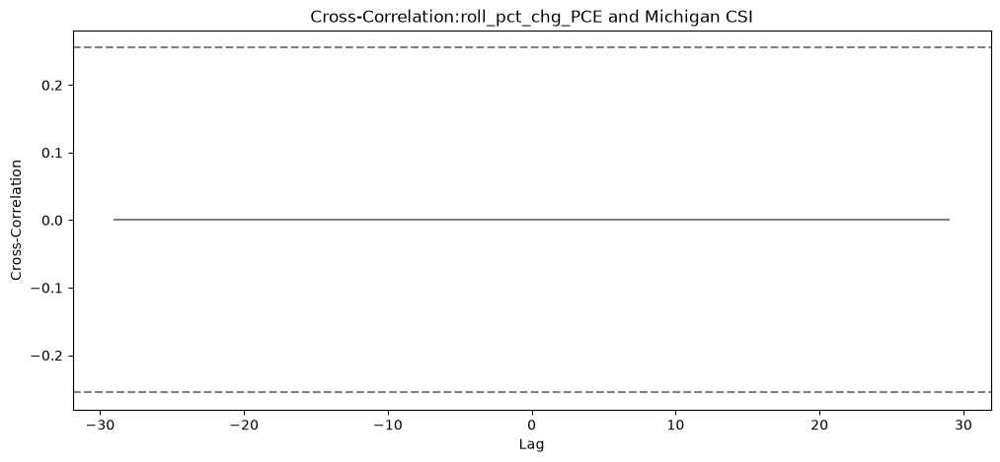

In [67]:
_ = ccf_funct(covid_df['roll_pct_chg_PCE'], covid_df['Michigan CSI'], 30, both_sides=True)

##### Consumption vs Inflation

np.float64(0.6102646350417189)

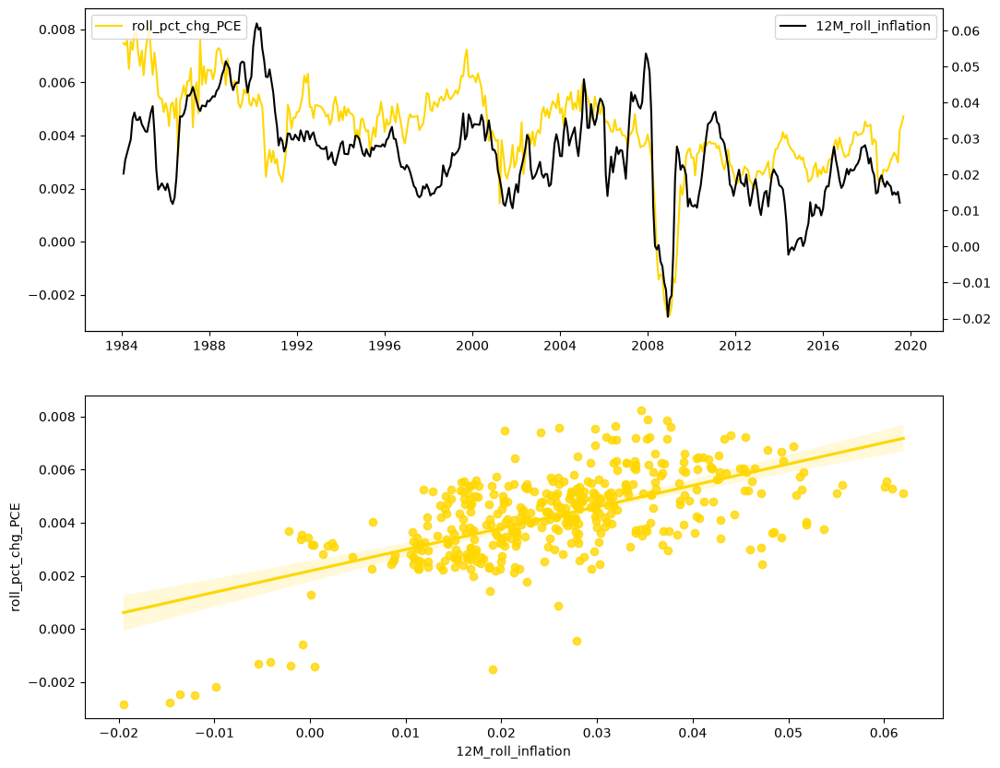

In [68]:
series_rel_plot(aux_df['roll_pct_chg_PCE'], aux_df['12M_roll_inflation'].shift(-2))

-2
0.6122079531168133


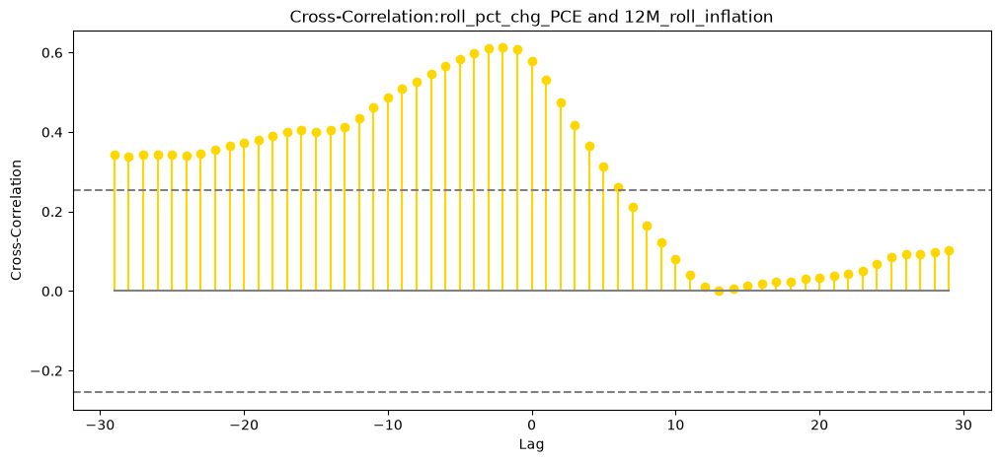

In [69]:
_ = ccf_funct(aux_df['roll_pct_chg_PCE'], aux_df['12M_roll_inflation'], 30, both_sides=True)

##### Furniture

np.float64(0.6358824933039398)

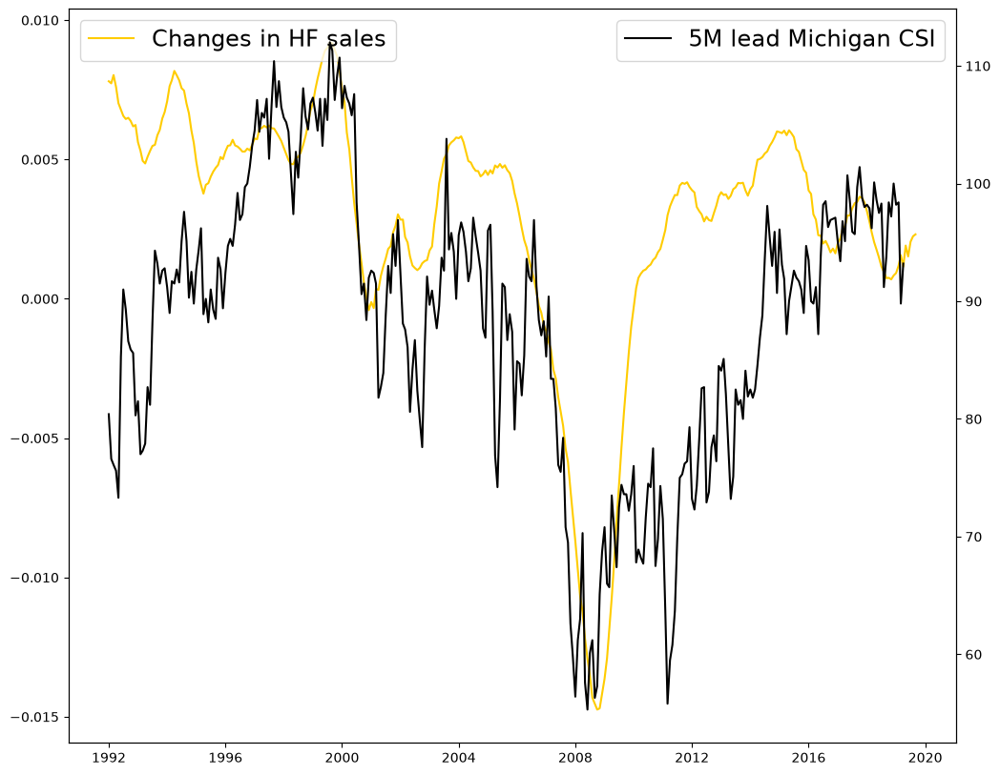

In [70]:
s_1 = short_df['roll_pct_chg_Y']
s_2 = short_df['Michigan CSI'].shift(-5)

label1, label2 = ["--" if not x.name else x.name for x in (s_1, s_2)]

plt.figure(figsize=(12,10))

plt.plot(s_1, color=color3, label="Changes in HF sales")
plt.legend(loc='upper left', fontsize=17)
ax2 = plt.twinx()
ax2.plot(s_2, color=color1, label="5M lead Michigan CSI")
ax2.legend(loc='upper right', fontsize=17)

s_1.corr(s_2)

<Axes: xlabel='roll_pct_chg_Y', ylabel='Michigan CSI'>

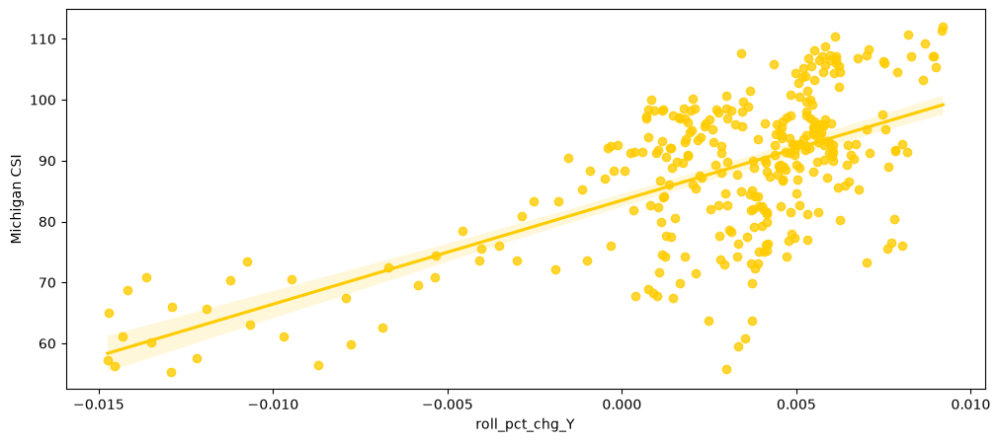

In [71]:
sns.regplot(x=s_1, y=s_2, color=color3)

np.float64(0.5518968828129837)

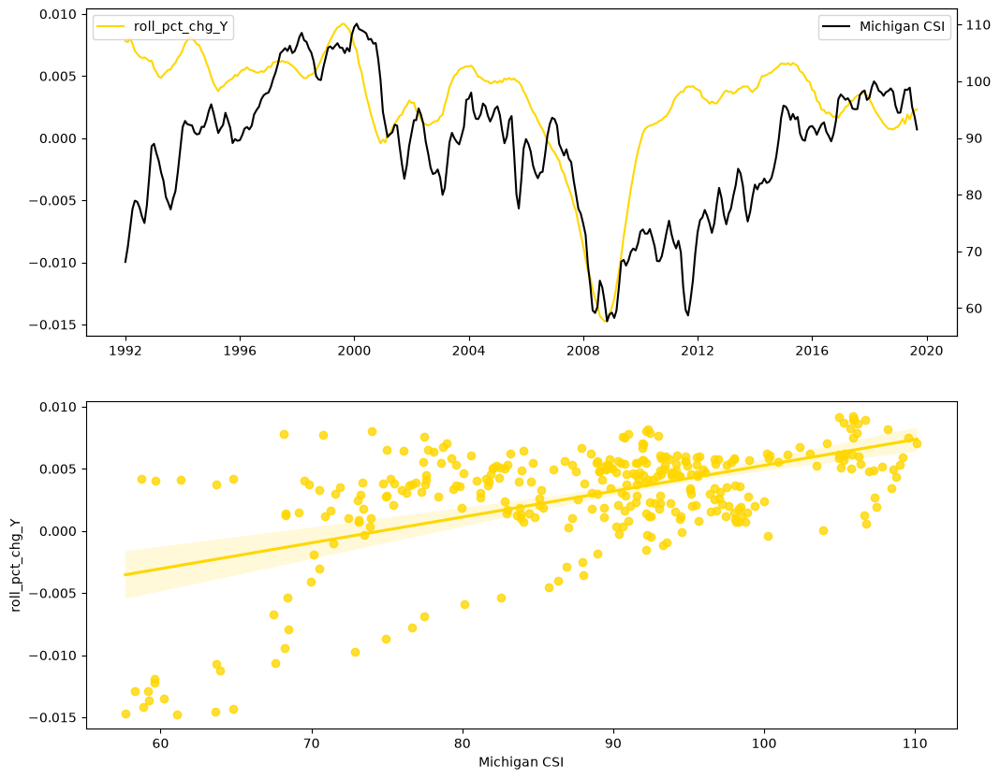

In [72]:
series_rel_plot(short_df['roll_pct_chg_Y'], 
                short_df['Michigan CSI'].rolling(window=3, min_periods=1, center=True).mean()
               )

-10
0.6782532093231884


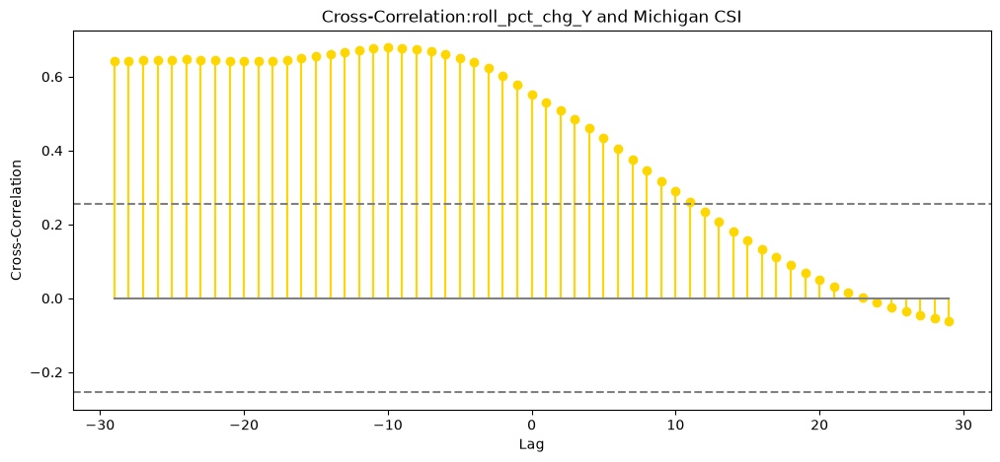

In [73]:
_ = ccf_funct(short_df['roll_pct_chg_Y'], 
              short_df['Michigan CSI'].rolling(window=3, min_periods=1, center=True).mean(), 
              30, both_sides=True)

-9
0.6709508736409279


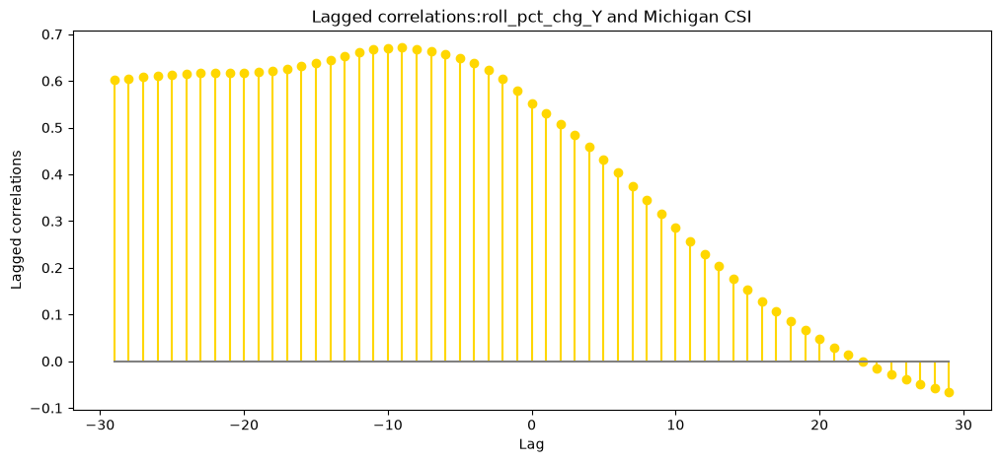

In [74]:
Y_MCSI_vals = lagged_corr_plot(short_df['roll_pct_chg_Y'], 
                  short_df['Michigan CSI'].rolling(window=3, min_periods=1, center=True).mean(), 
                  30, both_sides=True)

print(Y_MCSI_vals.argmax() - 29)
print(Y_MCSI_vals.max())

np.float64(0.6231269175316417)

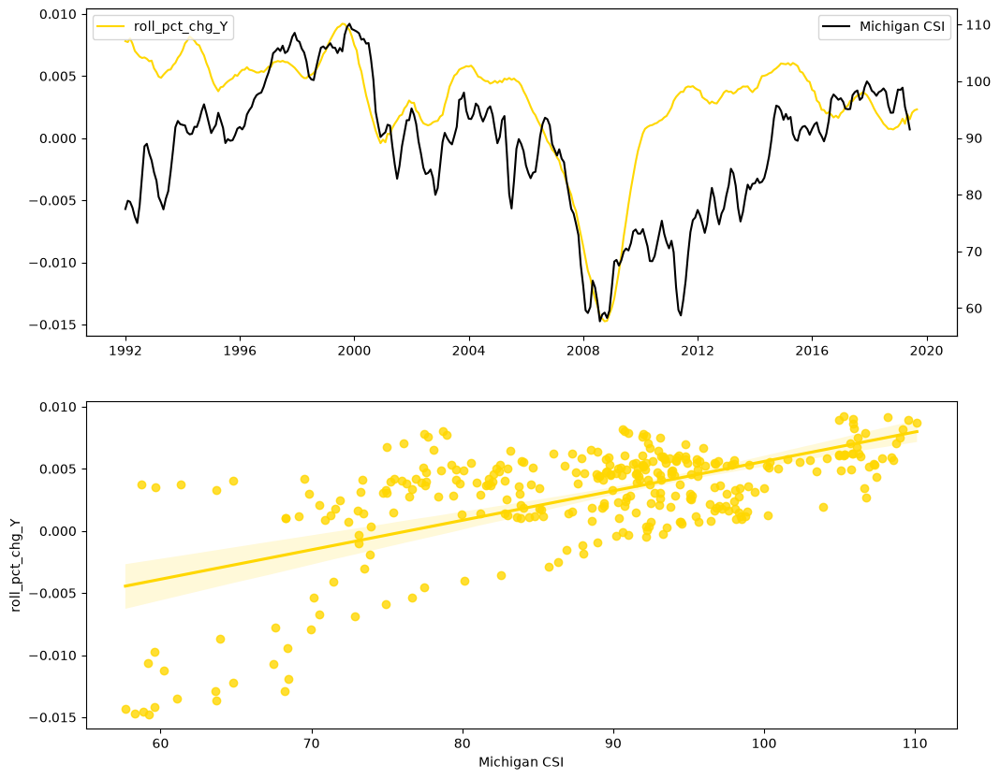

In [75]:
series_rel_plot(short_df['roll_pct_chg_Y'], 
                short_df['Michigan CSI'].rolling(window=3, min_periods=1, center=True).mean().shift(-3)
               )

#### Consumption

np.float64(0.9081281418641459)

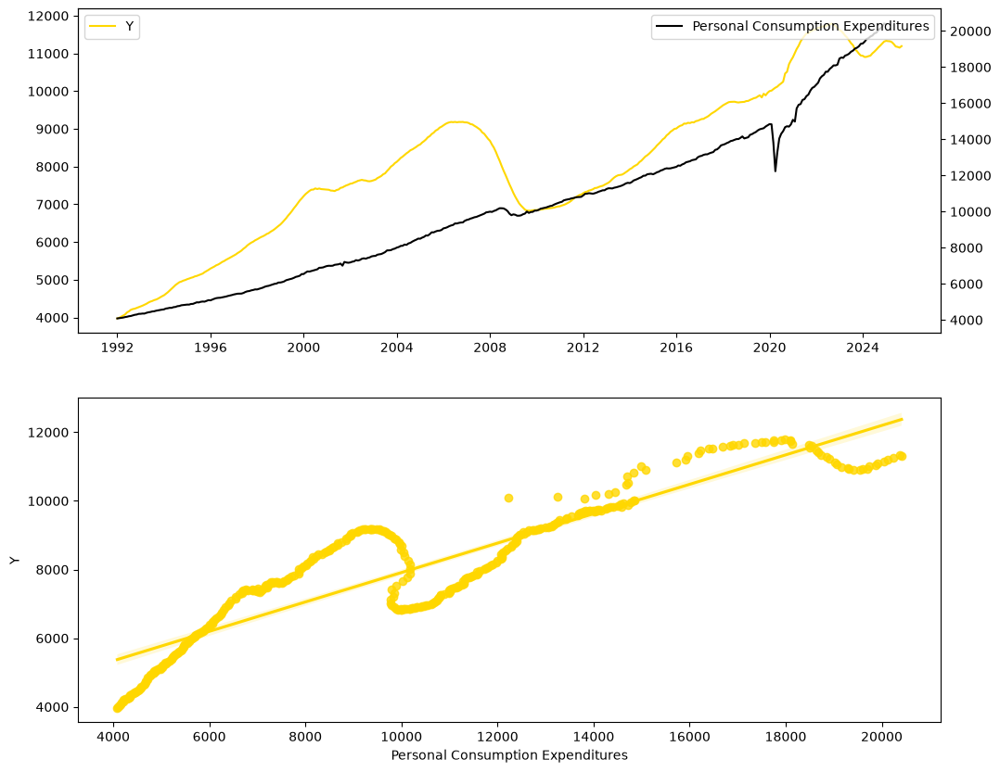

In [76]:
series_rel_plot(df['Y'], df['Personal Consumption Expenditures'])

np.float64(0.7657439053490512)

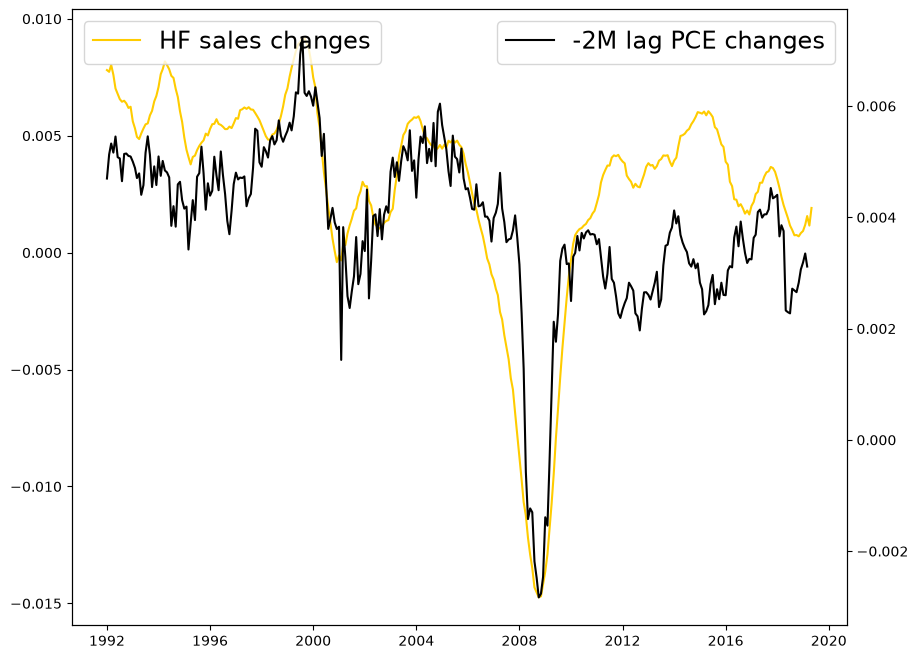

In [77]:
aux_df = df[df.index < "2019-06-01"]
s_1 = aux_df['roll_pct_chg_Y']
s_2 = aux_df['roll_pct_chg_Personal Consumption Expenditures'].shift(-2)

plt.figure(figsize = (10,8))
plt.plot(s_1, color=color3, label="HF sales changes")
plt.legend(loc='upper left', fontsize=17)
ax2 = plt.twinx()
ax2.plot(s_2, color=color1, label="-2M lag PCE changes")
ax2.legend(loc='upper right', fontsize=17)

s_2.corr(s_1)

Text(0, 0.5, '[]')

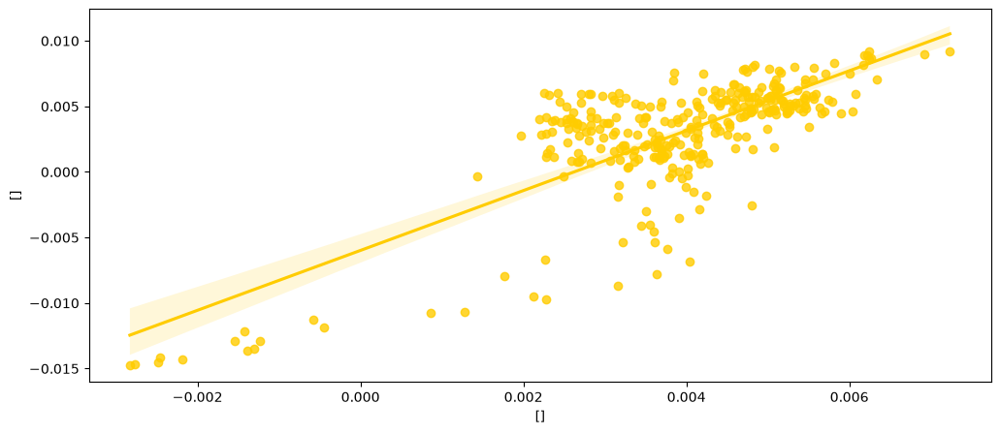

In [78]:
sns.regplot(x=s_2, y=s_1, color=color3)
plt.xlabel([])
plt.ylabel([])

np.float64(0.6578414253853438)

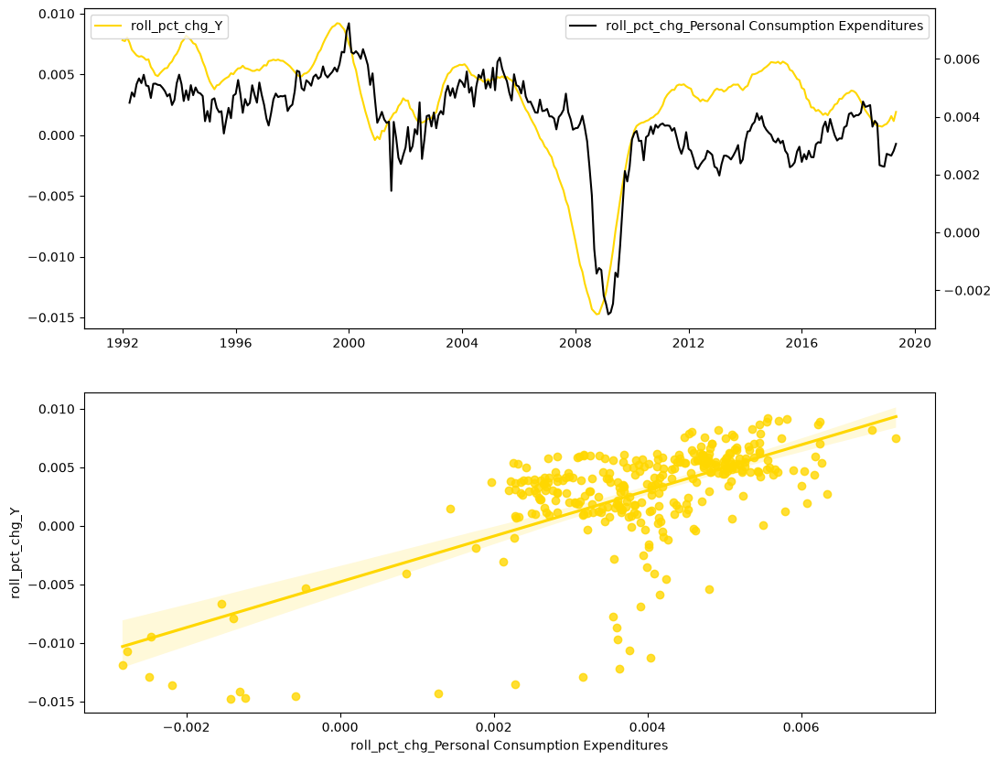

In [79]:
aux_df = df[df.index < "2019-06-01"]
# aux_df = df[(df.index < "2019-06-01") | (df.index > "2021-01-01")]
series_rel_plot(aux_df['roll_pct_chg_Y'], aux_df['roll_pct_chg_Personal Consumption Expenditures'].shift(3))

-3
0.7731619507903843


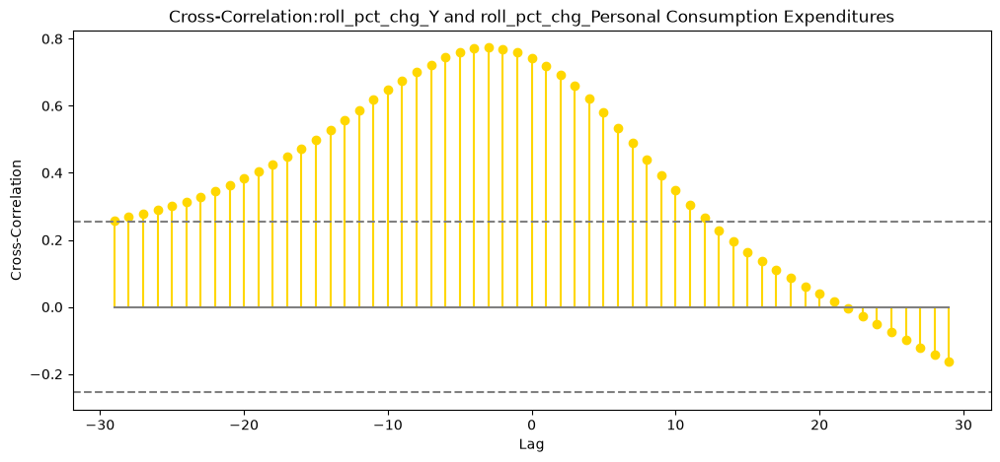

In [80]:
_ = ccf_funct(aux_df['roll_pct_chg_Y'], aux_df['roll_pct_chg_Personal Consumption Expenditures'], 30, both_sides=True)

##### Without 2008

np.float64(0.540878593125222)

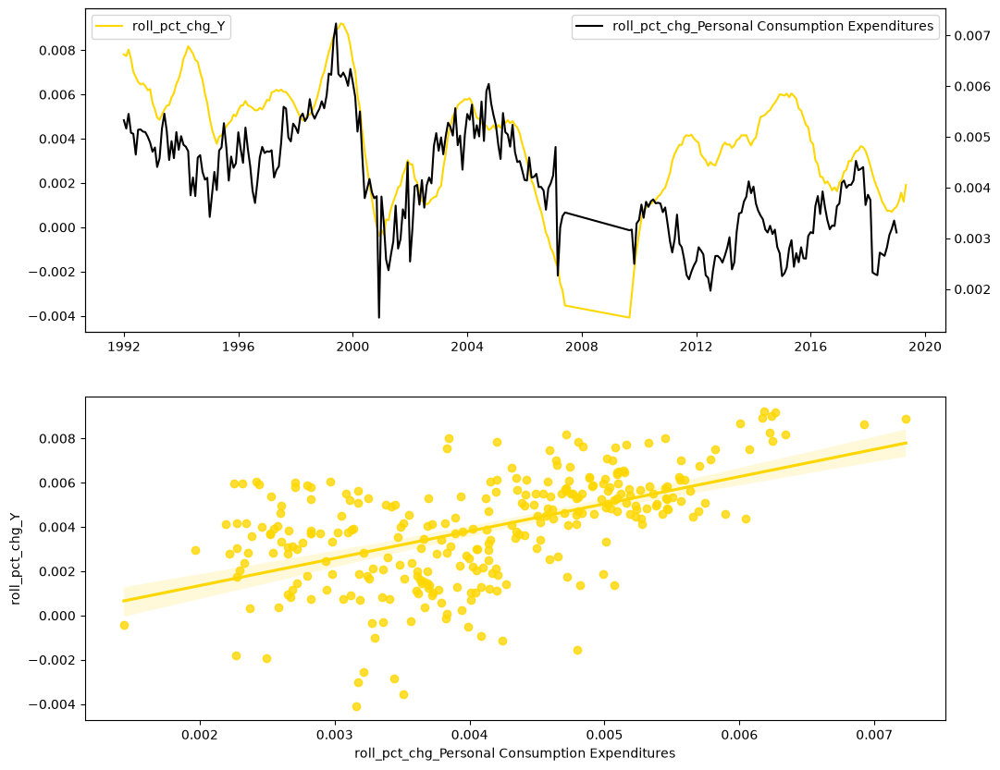

In [81]:
aux_df = df[(df.index < "2019-06-01") & ~((df.index > "2007-06-01") & (df.index < "2009-09-01"))]
# aux_df = df[(df.index < "2019-06-01") | (df.index > "2021-01-01")]
series_rel_plot(aux_df['roll_pct_chg_Y'], aux_df['roll_pct_chg_Personal Consumption Expenditures'].shift(-4))

-4
0.5425856043340826


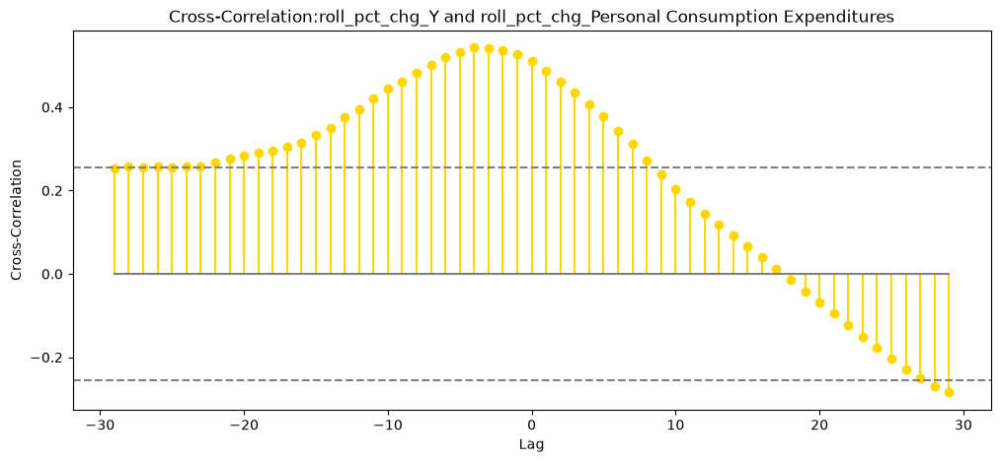

In [82]:
_ = ccf_funct(aux_df['roll_pct_chg_Y'], aux_df['roll_pct_chg_Personal Consumption Expenditures'], 30, both_sides=True)

#### Consumption and Furniture as share of GDP (nothing here)

np.float64(-0.6697862806641498)

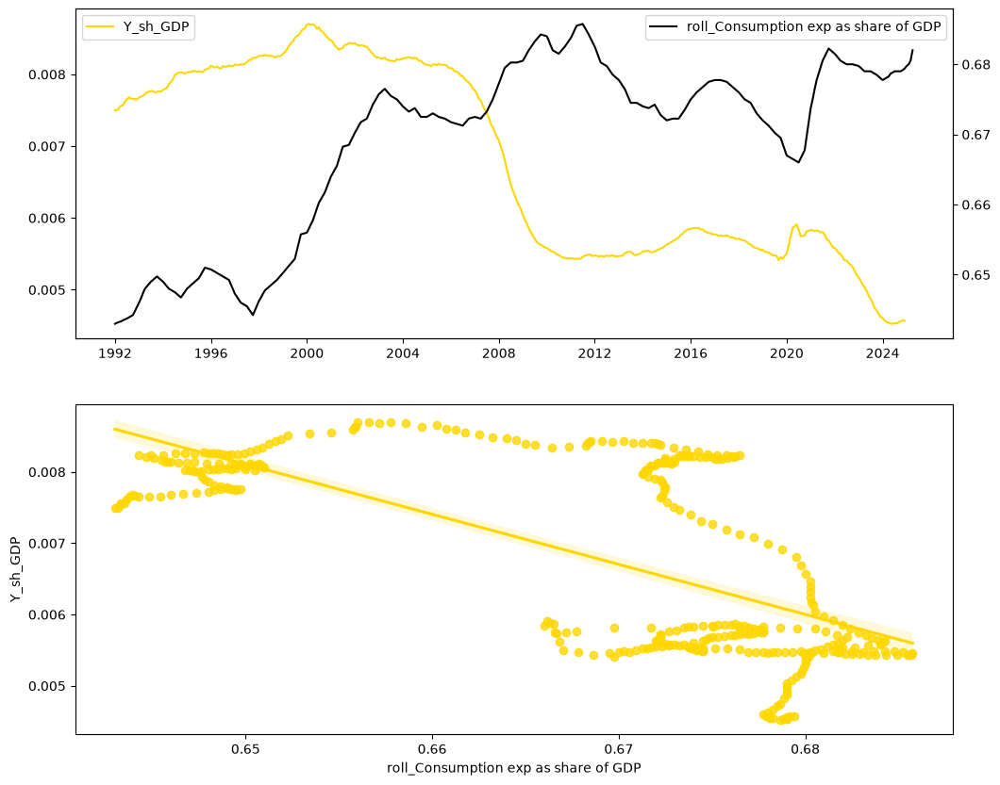

In [83]:
series_rel_plot(df['Y_sh_GDP'], df['roll_Consumption exp as share of GDP'])

np.float64(-0.07490690871395028)

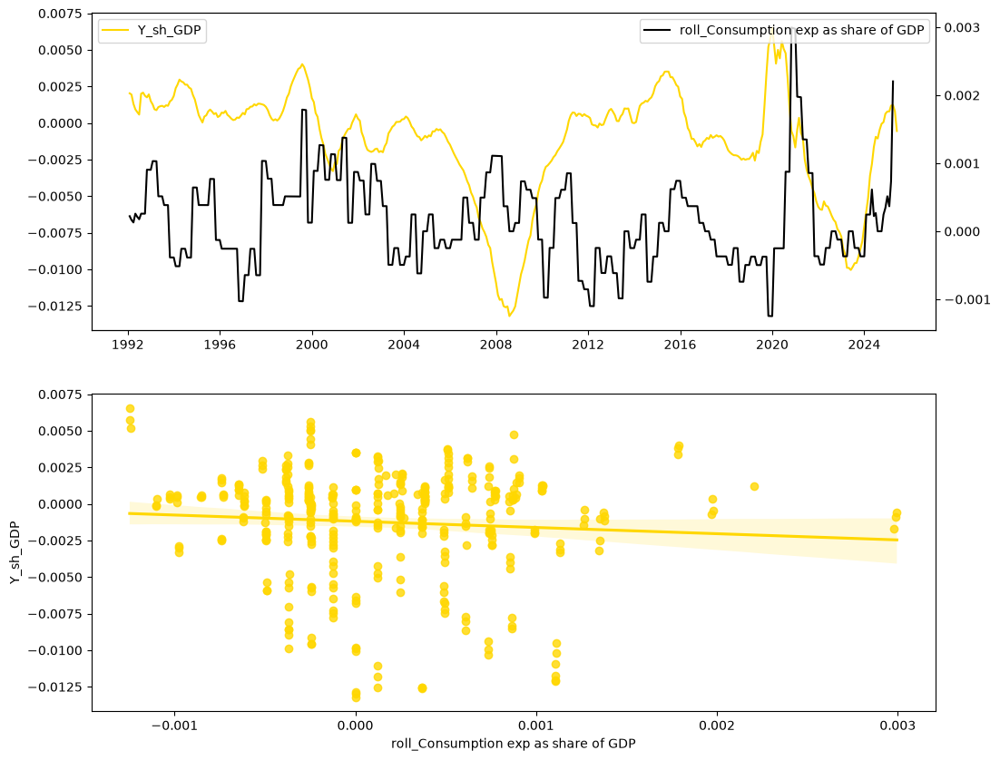

In [84]:
series1 = df['Y_sh_GDP'].rolling(window=12, min_periods=1, center=True).mean().pct_change(fill_method=None)
series2 = df['roll_Consumption exp as share of GDP'].pct_change(fill_method=None)
series_rel_plot(series1, series2)

np.float64(-0.03097633948832719)

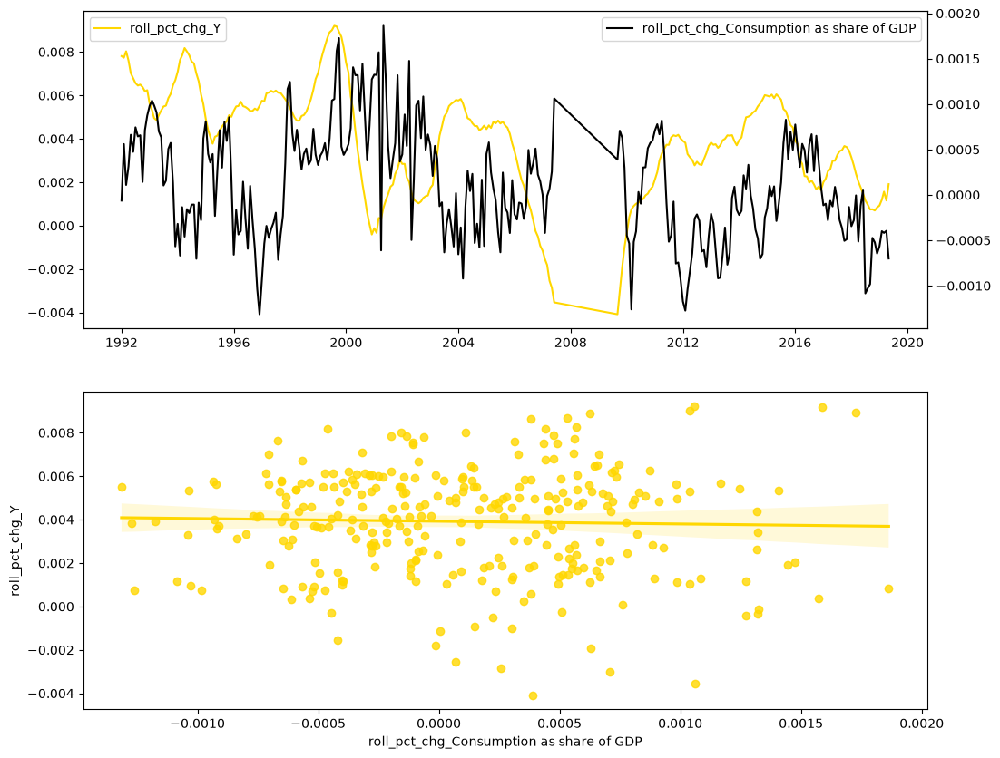

In [85]:
series_rel_plot(aux_df['roll_pct_chg_Y'], aux_df['roll_pct_chg_Consumption as share of GDP'])

#### Debt

PearsonRResult(statistic=np.float64(0.08048134927402645), pvalue=np.float64(0.11208322724088836))

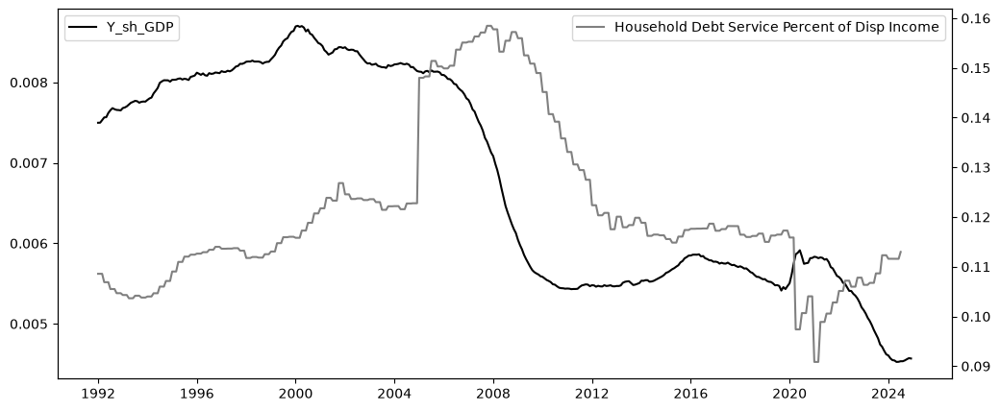

In [86]:
dual_plot_corr(df['Y_sh_GDP'], df['Household Debt Service Percent of Disp Income'])

In [87]:
# IR_MORT_ccf = ccf_funct(df['Y_sh_GDP'].diff().dropna(), df['Household Debt Service Percent of Disp Income'].diff().dropna(), 30)

#### Consumption vs debt

In [88]:
[x for x in df.columns if 'Debt' in x]

['Household Debt Service Percent of Disp Income',
 'Real Household Debt Service',
 'diff_Household Debt Service Percent of Disp Income',
 'diff_Real Household Debt Service',
 'pct_chg_Household Debt Service Percent of Disp Income',
 'pct_chg_Real Household Debt Service',
 'roll_pct_chg_Household Debt Service Percent of Disp Income',
 'roll_pct_chg_Real Household Debt Service']

PearsonRResult(statistic=np.float64(0.4275179429890616), pvalue=np.float64(8.350283889712007e-19))

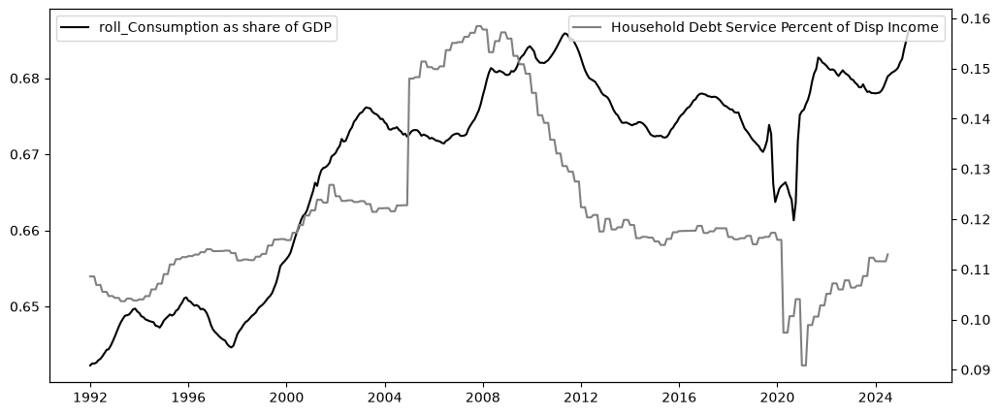

In [89]:
dual_plot_corr(df['roll_Consumption as share of GDP'], df['Household Debt Service Percent of Disp Income'])

PearsonRResult(statistic=np.float64(0.08032653663478095), pvalue=np.float64(0.11048773181811204))

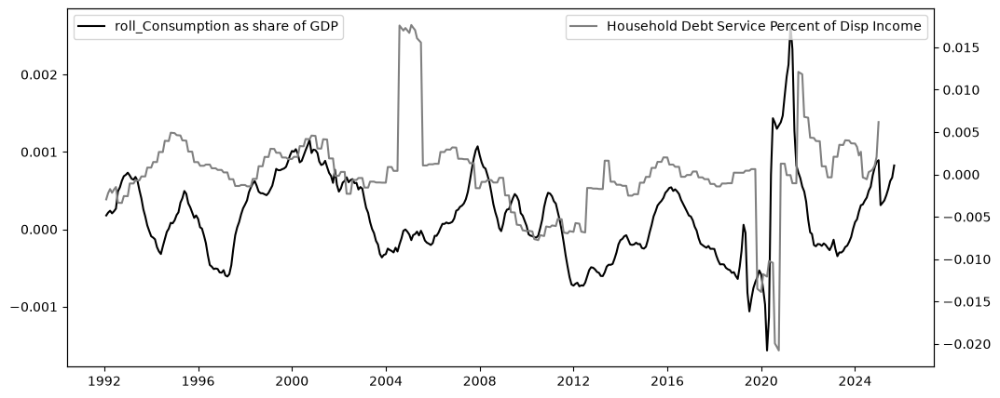

In [90]:
dual_plot_corr(df['roll_Consumption as share of GDP'].rolling(window=12, min_periods=1, center=True).mean().pct_change(fill_method=None), 
               df['Household Debt Service Percent of Disp Income'].rolling(window=12, min_periods=1, center=True).mean().pct_change(fill_method=None)
              )

PearsonRResult(statistic=np.float64(0.4275179429890616), pvalue=np.float64(8.350283889712007e-19))

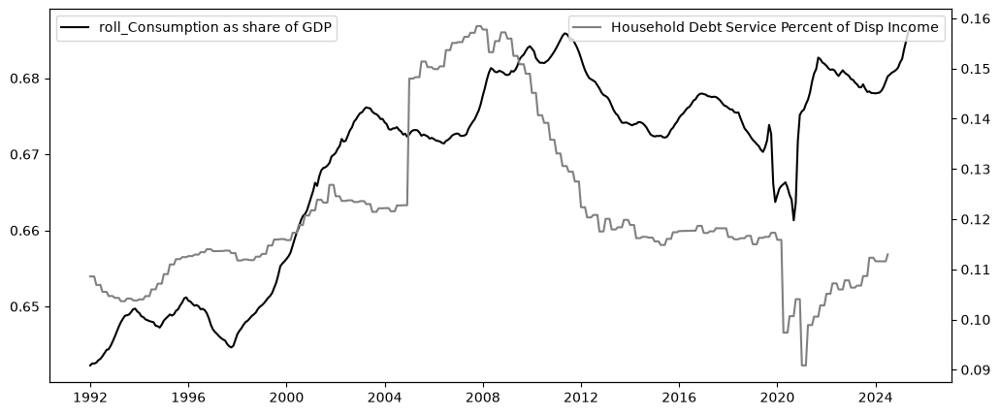

In [91]:
dual_plot_corr(df['roll_Consumption as share of GDP'], df['Household Debt Service Percent of Disp Income'])

PearsonRResult(statistic=np.float64(0.08032653663478095), pvalue=np.float64(0.11048773181811204))

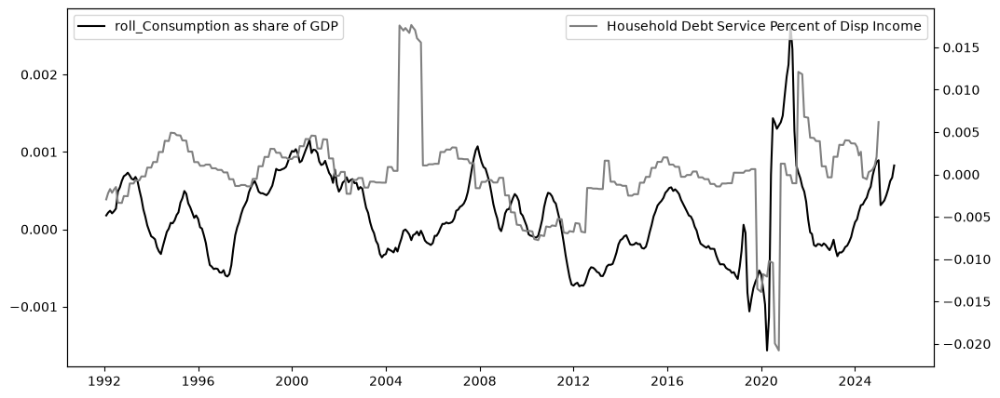

In [92]:
dual_plot_corr(df['roll_Consumption as share of GDP'].rolling(window=12, min_periods=1, center=True).mean().pct_change(fill_method=None), 
               df['Household Debt Service Percent of Disp Income'].rolling(window=12, min_periods=1, center=True).mean().pct_change(fill_method=None)
              )

### Real estate market

#### Plots

PearsonRResult(statistic=np.float64(0.9458107623008477), pvalue=np.float64(4.044870335502413e-192))
PearsonRResult(statistic=np.float64(0.11180844897783178), pvalue=np.float64(0.027252674249118553))


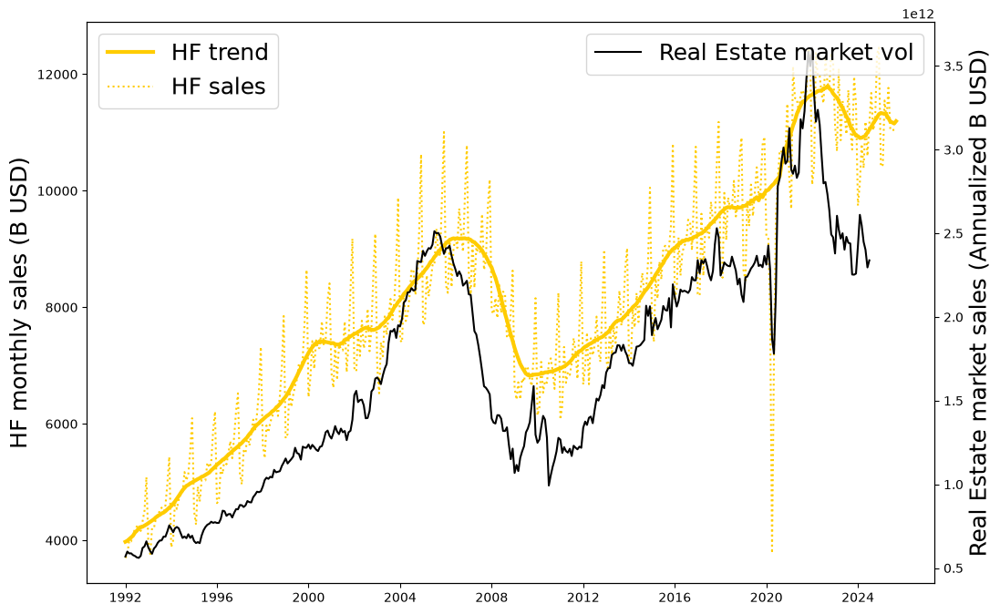

In [93]:
# SMALL_SIZE = 8
# MEDIUM_SIZE = 10
# BIGGER_SIZE = 14

# plt.rc('font', size=SMALL_SIZE)   
# plt.rc('axes', titlesize=BIGGER_SIZE)   
# plt.rc('axes', labelsize=BIGGER_SIZE)  
# plt.rc('xtick', labelsize=SMALL_SIZE)  
# plt.rc('ytick', labelsize=SMALL_SIZE)  
# plt.rc('legend', fontsize=BIGGER_SIZE)  
# plt.rc('figure', titlesize=BIGGER_SIZE)

shift = 0

series1 = df['Y']
series2 = df['Retail Sales Furniture & HF']
series3 = df['Real Estate - market sales'].shift(shift)


fig, ax1 = plt.subplots(figsize=(12,8))

ax1.plot(series1, color3, linewidth=3, label='HF trend')
ax1.plot(series2, color3, linestyle=':', label='HF sales')
ax1.legend(loc='upper left', fontsize=18)
ax1.set_ylabel('HF monthly sales (B USD)', fontsize=18)

ax2 = ax1.twinx()

ax2.plot(series3, color1, label='Real Estate market vol'.format(s=shift))
ax2.legend(loc='upper right', fontsize=18)
ax2.set_ylabel('Real Estate market sales (Annualized B USD)', fontsize=18)

bool_filter = series1.dropna().index.intersection(series3.dropna().index)

print(pearsonr(series1[bool_filter], series3[bool_filter]))
print(pearsonr(series1[bool_filter].pct_change().dropna(), series3[bool_filter].pct_change().dropna()))

Text(0.5, 0, '')

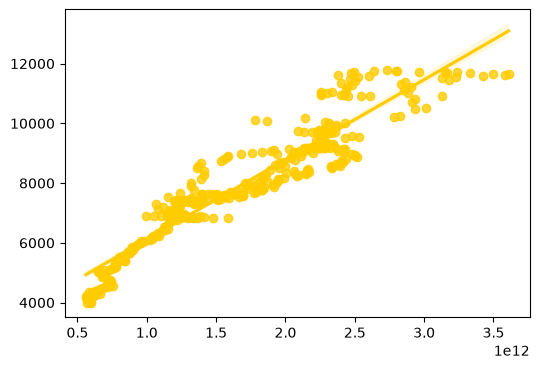

In [94]:
plt.figure(figsize=(6,4))
sns.regplot(x=series3, y=series1, color=color3)
plt.ylabel('')
plt.xlabel('')

PearsonRResult(statistic=np.float64(0.5223094635746935), pvalue=np.float64(3.6171195627043536e-29))
PearsonRResult(statistic=np.float64(0.720163340781131), pvalue=np.float64(1.0804370742300256e-64))
PearsonRResult(statistic=np.float64(-0.0015219159780079246), pvalue=np.float64(0.9759155038551733))


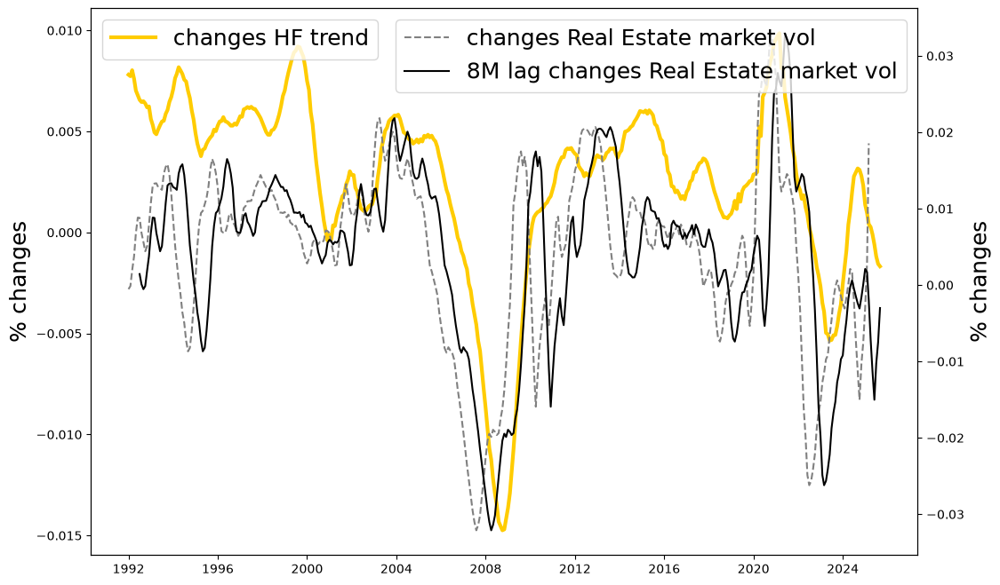

In [95]:
shift = 8

series1 = df['roll_pct_chg_Y']
series2 = df['roll_pct_chg_Retail Sales Furniture & HF']
series3 = df['roll_pct_chg_Real Estate - market sales']
series4 = df['roll_pct_chg_Real Estate - market sales'].shift(shift)


fig, ax1 = plt.subplots(figsize=(12,8))

ax1.plot(series1, color3, linewidth=3, label='changes HF trend')
# ax1.plot(series2, color3, linestyle=':', label='HF sales')
ax1.legend(loc='upper left', fontsize=18)
ax1.set_ylabel('% changes', fontsize=18)

ax2 = ax1.twinx()

ax2.plot(series3.rolling(window=5, min_periods=1, center=True).mean(), color2, linestyle='--', label='changes Real Estate market vol')
ax2.plot(series4.rolling(window=5, min_periods=1, center=True).mean(), color1, label='{s}M lag changes Real Estate market vol'.format(s=shift))
ax2.legend(loc='upper right', fontsize=18)
ax2.set_ylabel('% changes', fontsize=18)

bool_filter = series1.dropna().index.intersection(series3.dropna().index)
bool_filter_2 = series1.dropna().index.intersection(series4.dropna().index)

print(pearsonr(series1[bool_filter], series3[bool_filter]))
print(pearsonr(series1[bool_filter_2], series4[bool_filter_2]))
print(pearsonr(series1[bool_filter].pct_change().dropna(), series3[bool_filter].pct_change().dropna()))

#### Intro

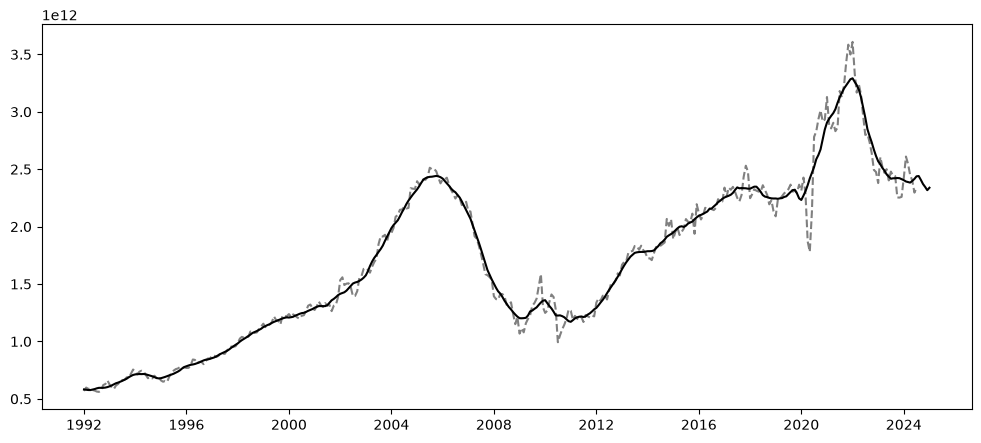

In [96]:
plt.plot(df['Real Estate - market sales'], 'grey', linestyle="--")
plt.plot(df['Real Estate - market sales'].rolling(window=12, min_periods=1, center=True).mean(), 'k')

C:\Users\illoi\AppData\Local\Temp\ipykernel_36812\3341749679.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['Y_sh_RE'] = df['Y'] / df['Real Estate - market sales'] * 12 * 1e6
C:\Users\illoi\AppData\Local\Temp\ipykernel_36812\3341749679.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['Y_sh__roll_RE'] = df['Y'] / df['Real Estate - market sales'].rolling(window=12, min_periods=1, center=True).mean() * 12 * 1e6


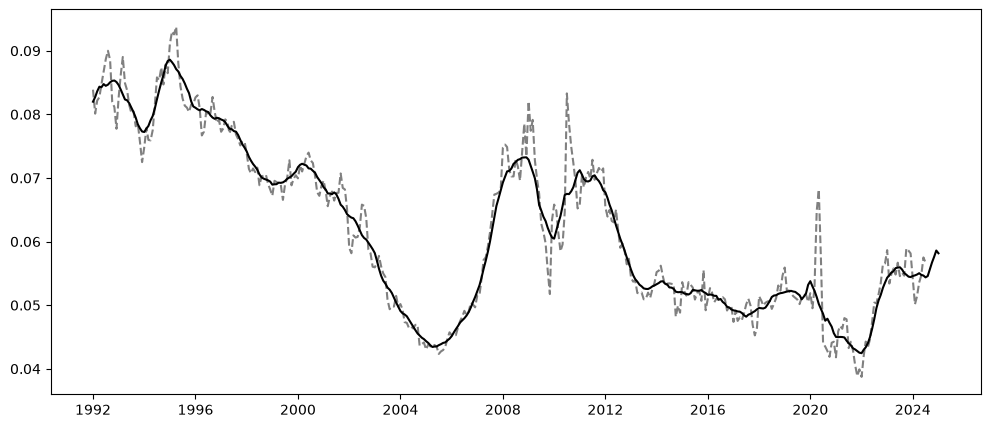

In [97]:
df['Y_sh_RE'] = df['Y'] / df['Real Estate - market sales'] * 12 * 1e6
df['Y_sh__roll_RE'] = df['Y'] / df['Real Estate - market sales'].rolling(window=12, min_periods=1, center=True).mean() * 12 * 1e6
plt.plot(df['Y_sh_RE'], 'grey', linestyle='--')
plt.plot(df['Y_sh__roll_RE'], 'k')

C:\Users\illoi\AppData\Local\Temp\ipykernel_36812\2107966300.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['Y_infl_adj_sh_RE'] = df['Y_infl_adj'] / df['US All home sales']
C:\Users\illoi\AppData\Local\Temp\ipykernel_36812\2107966300.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['Y_infl_adj_sh_roll_RE'] = df['Y_infl_adj'] / df['US All home sales'].rolling(window=12, min_periods=1, center=True).mean()


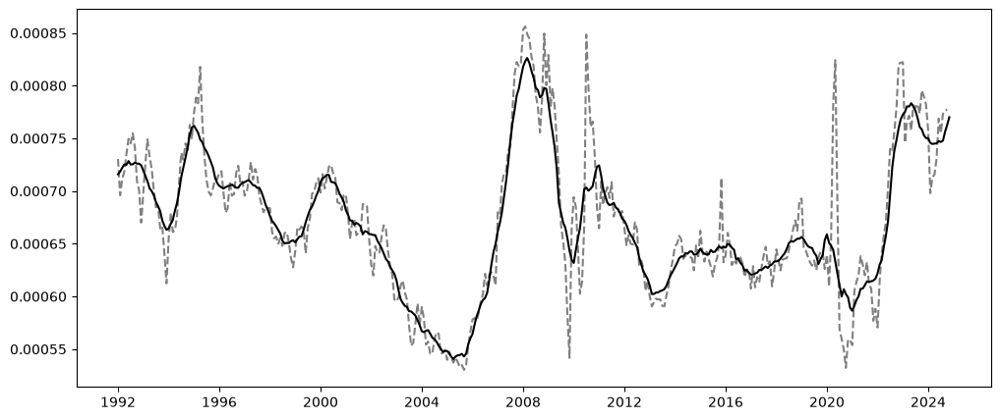

In [98]:
df['Y_infl_adj_sh_RE'] = df['Y_infl_adj'] / df['US All home sales']
df['Y_infl_adj_sh_roll_RE'] = df['Y_infl_adj'] / df['US All home sales'].rolling(window=12, min_periods=1, center=True).mean()
plt.plot(df['Y_infl_adj_sh_RE'], 'grey', linestyle='--')
plt.plot(df['Y_infl_adj_sh_roll_RE'], 'k')

#### RE Market size

##### Correlations

PearsonRResult(statistic=np.float64(0.9600553038813612), pvalue=np.float64(2.846322010433797e-217))
PearsonRResult(statistic=np.float64(0.22035999301980874), pvalue=np.float64(1.123666505031656e-05))


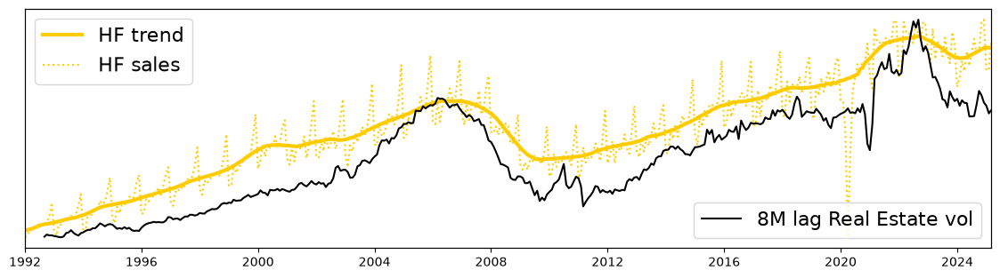

In [99]:
shift = 8

series1 = df['Y']
series2 = df['Retail Sales Furniture & HF']
series3 = df['Real Estate - market sales'].shift(shift)

fig, ax1 = plt.subplots(figsize= (14, 3.5))

ax1.plot(series1, color3, linewidth=3, label='HF trend')
ax1.plot(series2, color3, linestyle=':', label='HF sales')
ax1.legend(loc='upper left', fontsize=16)
ax1.set_ylabel('', fontsize=17)
# ax1.set_yticklabels([])
ax1.set_xlim([datetime(1992, 1, 1), datetime(2025, 3, 1)])
ax1.get_yaxis().set_visible(False)

# ax1.tick_params(
#     axis='y',
#     which='both',
#     left=False,     # remove ticks on the left (just in case)
#     right=False,    # remove ticks on the right
#     labelleft=False,
#     labelright=False
# )

# HF monthly sales (B USD)

ax2 = ax1.twinx()
# ax2.set_yticklabels([])
ax2.get_yaxis().set_visible(False)

ax2.plot(series3, color1, label='{s}M lag Real Estate vol'.format(s=shift))
ax2.legend(loc='lower right', fontsize=16)
# ax2.set_ylabel('Real Estate market sales (Annualized B USD)')

bool_filter = series1.dropna().index.intersection(series3.dropna().index)

print(pearsonr(series1[bool_filter], series3[bool_filter]))
print(pearsonr(series1[bool_filter].pct_change().dropna(), series3[bool_filter].pct_change().dropna()))

PearsonRResult(statistic=np.float64(0.9600553038813612), pvalue=np.float64(2.846322010433797e-217))
PearsonRResult(statistic=np.float64(0.22035999301980874), pvalue=np.float64(1.123666505031656e-05))


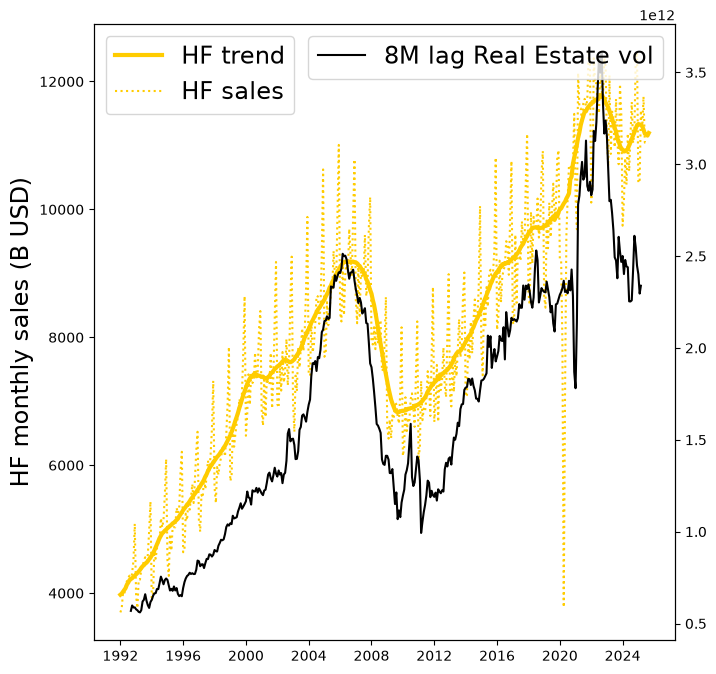

In [100]:
# SMALL_SIZE = 8
# MEDIUM_SIZE = 10
# BIGGER_SIZE = 14

# plt.rc('font', size=SMALL_SIZE)   
# plt.rc('axes', titlesize=BIGGER_SIZE)   
# plt.rc('axes', labelsize=BIGGER_SIZE)  
# plt.rc('xtick', labelsize=SMALL_SIZE)  
# plt.rc('ytick', labelsize=SMALL_SIZE)  
# plt.rc('legend', fontsize=BIGGER_SIZE)  
# plt.rc('figure', titlesize=BIGGER_SIZE)

shift = 8

series1 = df['Y']
series2 = df['Retail Sales Furniture & HF']
series3 = df['Real Estate - market sales'].shift(shift)


fig, ax1 = plt.subplots(figsize=(7.5,8))

ax1.plot(series1, color3, linewidth=3, label='HF trend')
ax1.plot(series2, color3, linestyle=':', label='HF sales')
ax1.legend(loc='upper left', fontsize=17)
ax1.set_ylabel('HF monthly sales (B USD)', fontsize=17)

ax2 = ax1.twinx()

ax2.plot(series3, color1, label='{s}M lag Real Estate vol'.format(s=shift))
ax2.legend(loc='upper right', fontsize=17)
# ax2.set_ylabel('Real Estate market sales (Annualized B USD)')

bool_filter = series1.dropna().index.intersection(series3.dropna().index)

print(pearsonr(series1[bool_filter], series3[bool_filter]))
print(pearsonr(series1[bool_filter].pct_change().dropna(), series3[bool_filter].pct_change().dropna()))

Text(0.5, 0, '')

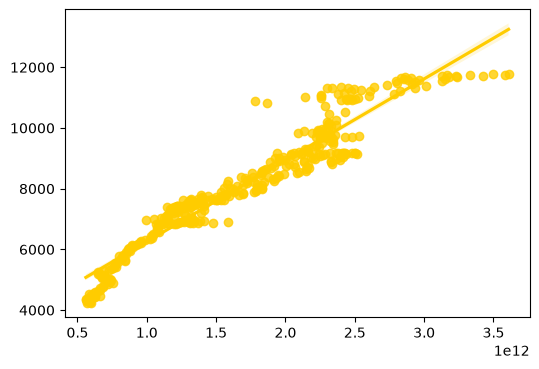

In [101]:
plt.figure(figsize=(6,4))
sns.regplot(x=series3, y=series1, color=color3)
plt.ylabel('')
plt.xlabel('')

In [102]:
print(adfuller(df['roll_pct_chg_Y'].dropna())[1])
print(adfuller(df['roll_pct_chg_Real Estate - market sales'].dropna())[1])
infl_adj_granger_results = grangercausalitytests(df[['roll_pct_chg_Y', 'roll_pct_chg_Real Estate - market sales']].dropna(), maxlag=9)

0.004604899112076163
0.020924696853956377


C:\Users\illoi\AppData\Local\Temp\ipykernel_36812\1278418673.py:1: FutureWarning: adfuller currently returns a plain tuple whose length depends on the store and autolag arguments. In release 0.16 or after July 2027, whichever is later, the default behavior will switch to always returning an ADFullerResult. Set result_object=True to switch now, or result_object=False to keep the current behavior and silence this warning.
  print(adfuller(df['roll_pct_chg_Y'].dropna())[1])
C:\Users\illoi\AppData\Local\Temp\ipykernel_36812\1278418673.py:2: FutureWarning: adfuller currently returns a plain tuple whose length depends on the store and autolag arguments. In release 0.16 or after July 2027, whichever is later, the default behavior will switch to always returning an ADFullerResult. Set result_object=True to switch now, or result_object=False to keep the current behavior and silence this warning.
  print(adfuller(df['roll_pct_chg_Real Estate - market sales'].dropna())[1])


PearsonRResult(statistic=np.float64(nan), pvalue=np.float64(nan))


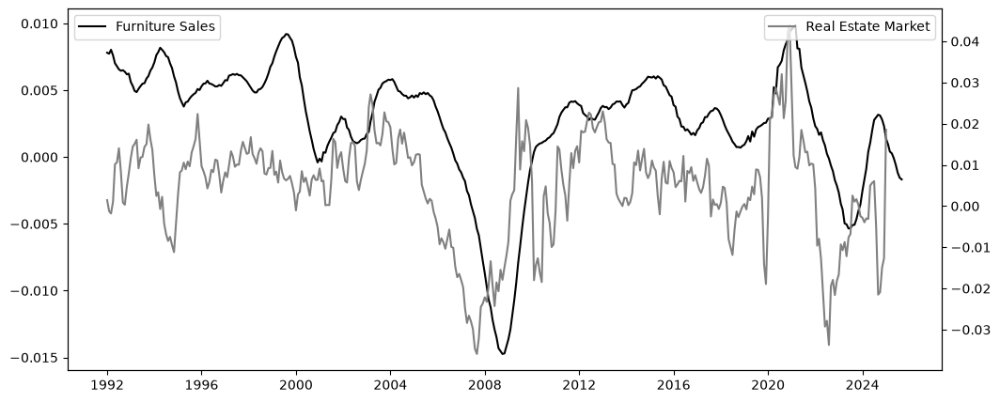

In [103]:
plt_dict_1 = {'Furniture Sales': df['roll_pct_chg_Y']}
plt_dict_2 = {'Real Estate Market': df['roll_pct_chg_Real Estate - market sales']}

twinplot(plt_dict_1, plt_dict_2)

np.int64(9)

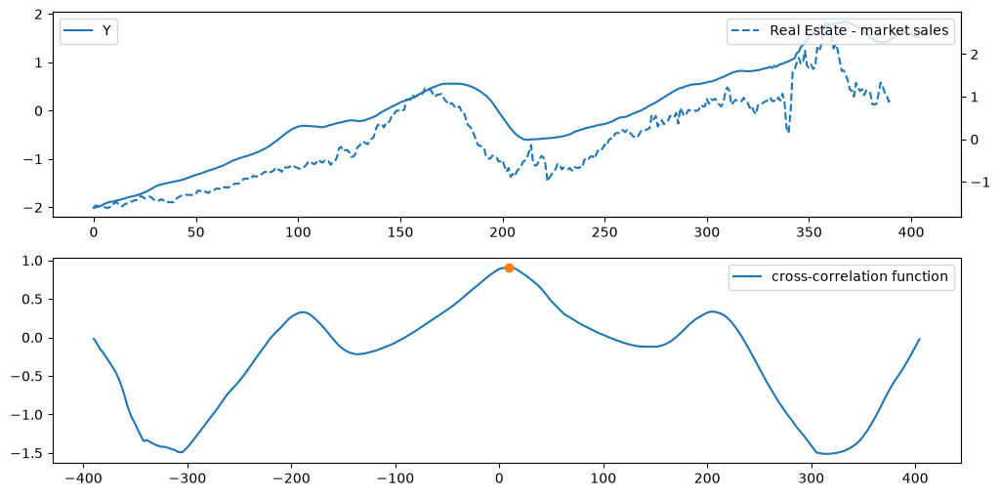

In [104]:
cross_correlate(df, 'Y', 'Real Estate - market sales', adjusted=True)

4
0.9234253674192406


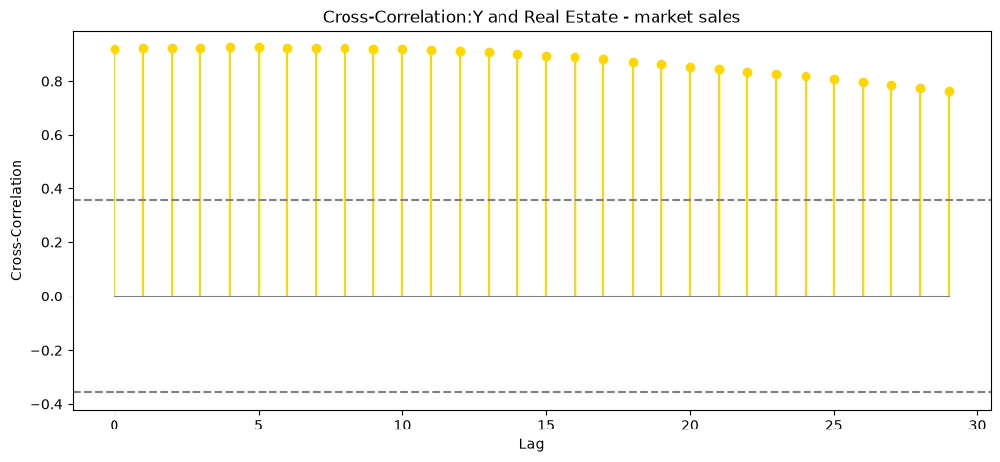

In [105]:
IR_MORT_ccf = ccf_funct(df['Y'].dropna(), df['Real Estate - market sales'].dropna(), 30)

8
0.9600553038813615


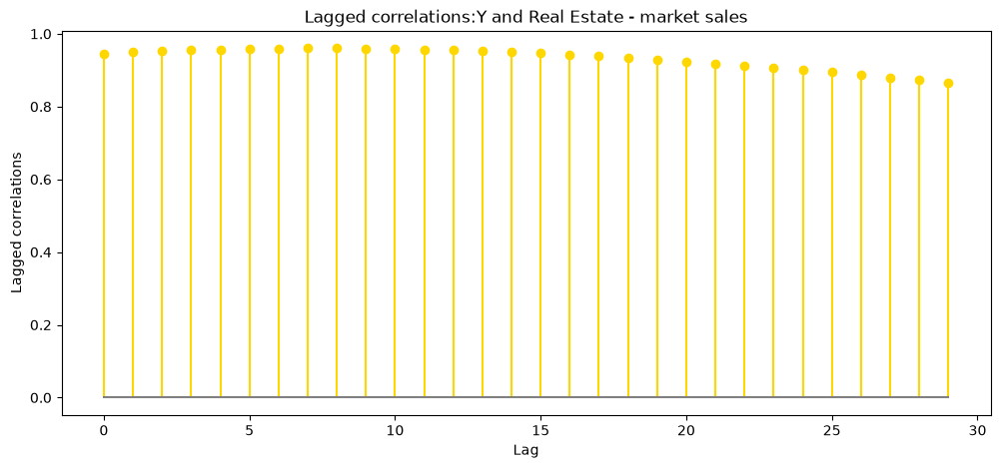

In [106]:
corr_values = lagged_corr_plot(df['Y'], df['Real Estate - market sales'], 30)
print(corr_values.argmax())
print(corr_values.max())

np.int64(9)

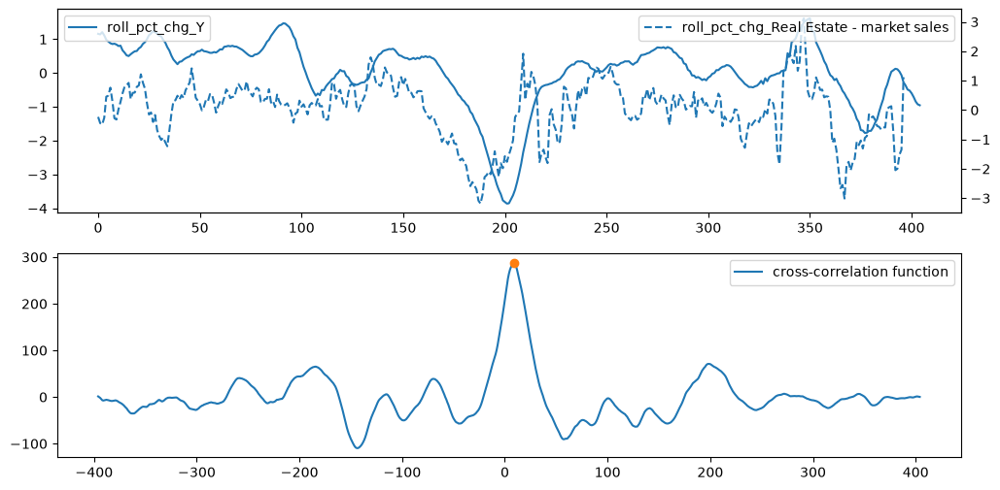

In [107]:
cross_correlate(df, 'roll_pct_chg_Y', 'roll_pct_chg_Real Estate - market sales', adjusted=False)

9
0.7261932439734523


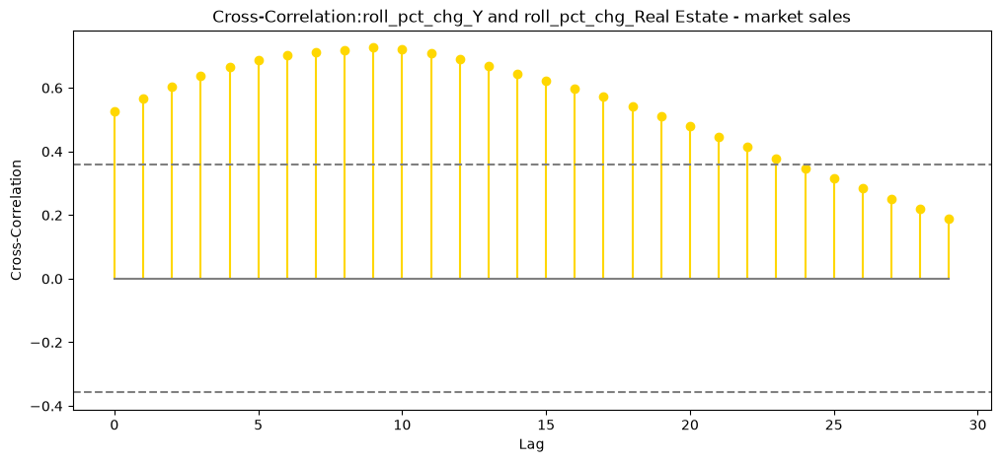

In [108]:
IR_MORT_ccf = ccf_funct(df['roll_pct_chg_Y'].dropna(), df['roll_pct_chg_Real Estate - market sales'].dropna(), 30)

np.int64(9)

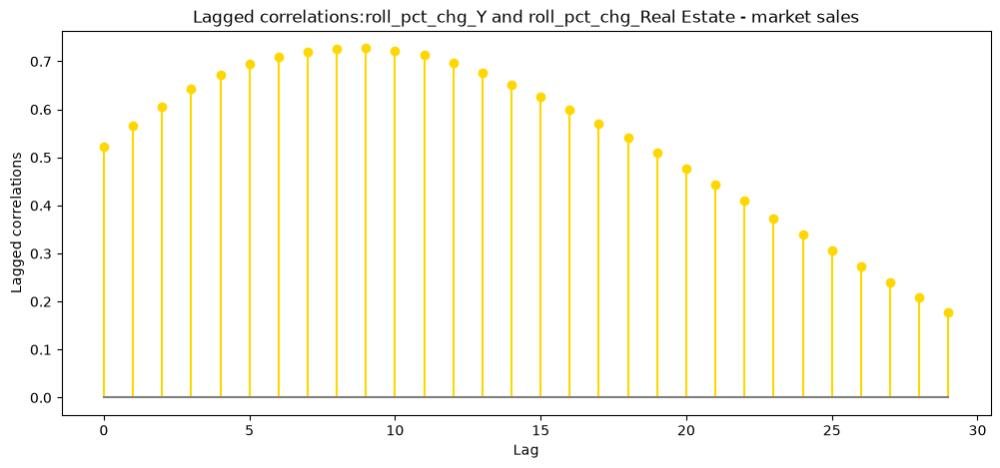

In [109]:
IR_MORT_lagged = lagged_corr_plot(df['roll_pct_chg_Y'].dropna(), df['roll_pct_chg_Real Estate - market sales'].dropna(), 30)
IR_MORT_lagged.argmax()

PearsonRResult(statistic=np.float64(0.720163340781131), pvalue=np.float64(1.0804370742300256e-64))

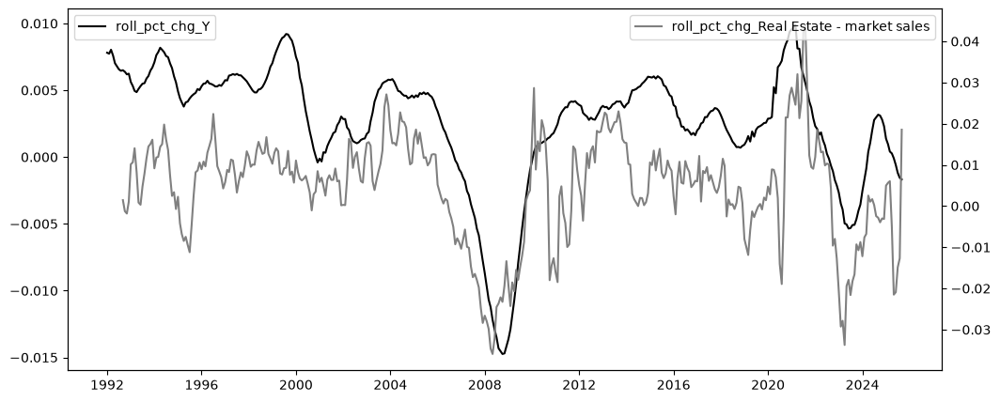

In [110]:
plt_dict_1 = {'Furniture Sales': df['roll_pct_chg_Y']}
plt_dict_2 = {'Real Estate Market': df['roll_pct_chg_Real Estate - market sales']}

dual_plot_corr(df['roll_pct_chg_Y'], df['roll_pct_chg_Real Estate - market sales'].shift(8))

PearsonRResult(statistic=np.float64(0.9600553038813612), pvalue=np.float64(2.846322010433797e-217))
PearsonRResult(statistic=np.float64(0.9665037341741693), pvalue=np.float64(7.191787848011637e-232))
PearsonRResult(statistic=np.float64(0.9458107623008477), pvalue=np.float64(4.044870335502413e-192))
PearsonRResult(statistic=np.float64(0.9544025274525852), pvalue=np.float64(2.4720193958098557e-206))


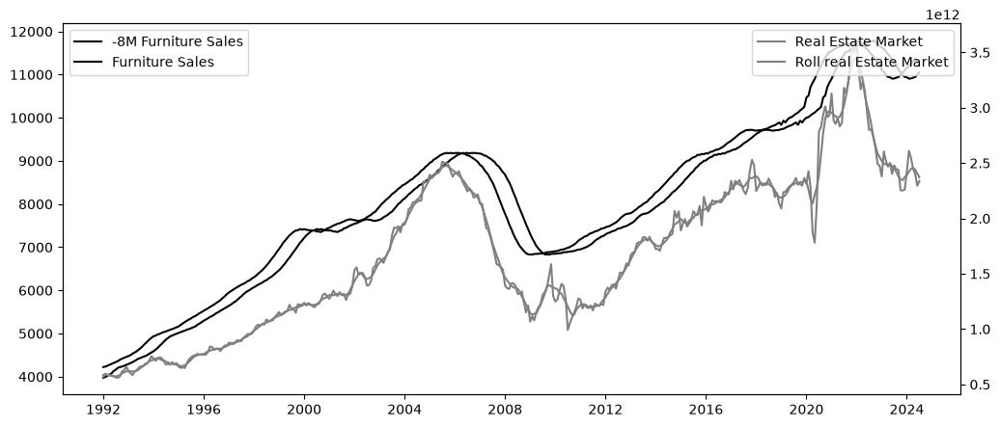

In [111]:
### THIS IS IMPORTANT

shift = -8
aux_df = df[['Y', 'Real Estate - market sales']].copy()
aux_df['shift_Y'] = aux_df['Y'].shift(shift)
aux_df = aux_df.dropna()

plt_dict_1 = {'{shift}M Furniture Sales'.format(shift=shift): aux_df['shift_Y'], 
              'Furniture Sales': aux_df['Y']
             }

# plt_dict_1 = {'{shift}M Furniture Sales'.format(shift=shift): shifted_series, 'Furniture Sales': df.loc[shifted_series.index, 'Y']}
plt_dict_2 = {'Real Estate Market': aux_df['Real Estate - market sales'],
              'Roll real Estate Market': aux_df['Real Estate - market sales'].rolling(window=6, min_periods=1, center=True).mean()
             }

twinplot(plt_dict_1, plt_dict_2)

# dual_plot_corr(df['Y'], df['GDP'])

PearsonRResult(statistic=np.float64(nan), pvalue=np.float64(nan))


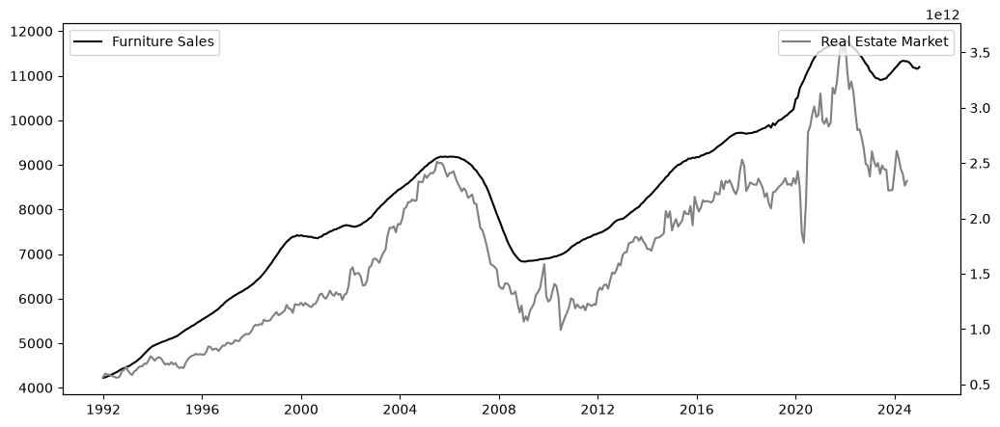

In [112]:
shift = -8
shifted_series = df['Y'].shift(shift).dropna()

plt_dict_1 = {'Furniture Sales': shifted_series}
plt_dict_2 = {'Real Estate Market': df.loc[shifted_series.index, 'Real Estate - market sales']}

twinplot(plt_dict_1, plt_dict_2)

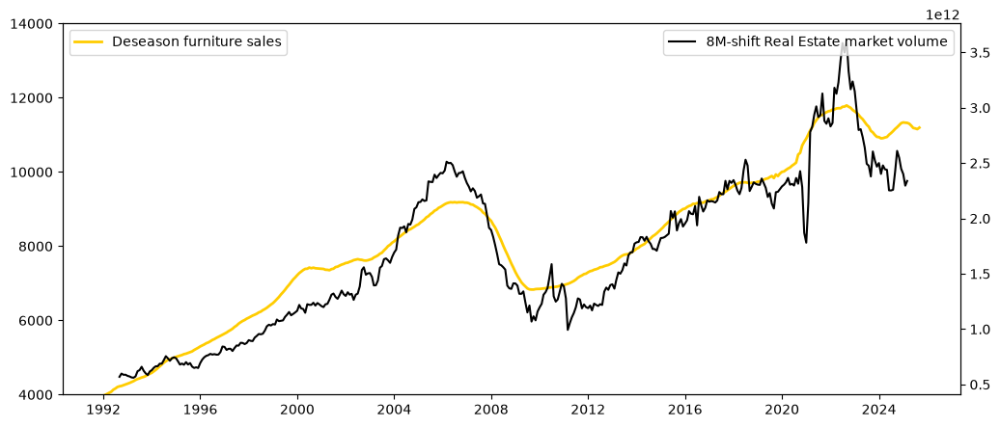

In [113]:
fig, ax1 = plt.subplots()
ax1.plot(df['Y'], color=color3, linewidth=2, label='Deseason furniture sales')
ax1.legend(loc='upper left')
ax1.set_ylim([4000,14000])
ax2 = ax1.twinx()
ax2.plot(df['Real Estate - market sales'].shift(8), color=color1, label='8M-shift Real Estate market volume')
ax2.legend(loc='upper right')

np.float64(0.9600553038813615)

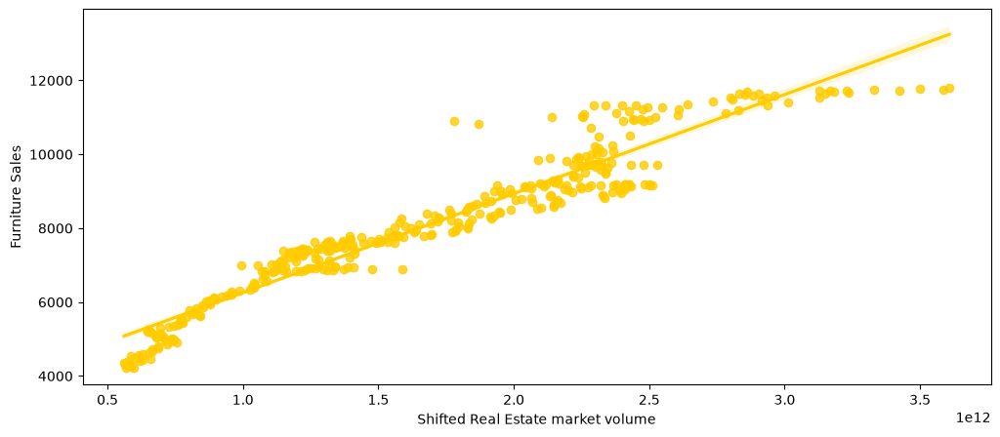

In [114]:
sns.regplot(x=df['Real Estate - market sales'].shift(8), y=df['Y'], color=color3)
plt.xlabel('Shifted Real Estate market volume')
plt.ylabel('Furniture Sales')
df['Real Estate - market sales'].shift(8).corr(df['Y'])

PearsonRResult(statistic=np.float64(nan), pvalue=np.float64(nan))


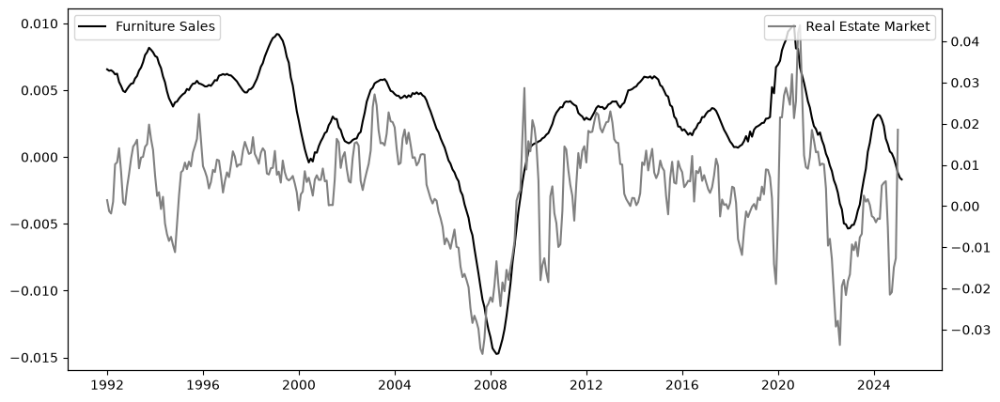

In [115]:
shift = -6
shifted_series = df['roll_pct_chg_Y'].shift(shift).dropna()

plt_dict_1 = {'Furniture Sales': shifted_series}
plt_dict_2 = {'Real Estate Market': df.loc[shifted_series.index, 'roll_pct_chg_Real Estate - market sales']}

twinplot(plt_dict_1, plt_dict_2)

PearsonRResult(statistic=np.float64(nan), pvalue=np.float64(nan))
PearsonRResult(statistic=np.float64(nan), pvalue=np.float64(nan))


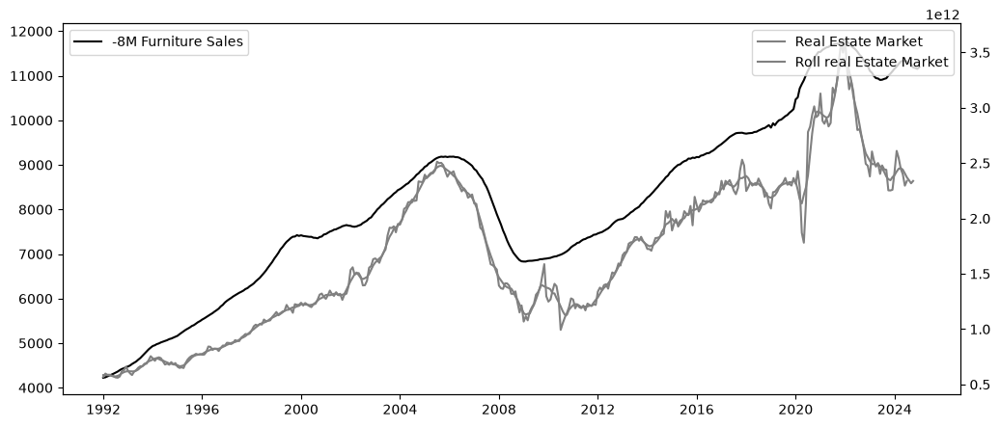

In [116]:
shift = -8
shifted_series = df['Y'].shift(shift).dropna()

plt_dict_1 = {'{shift}M Furniture Sales'.format(shift=shift): shifted_series}
# plt_dict_1 = {'{shift}M Furniture Sales'.format(shift=shift): shifted_series, 'Furniture Sales': df.loc[shifted_series.index, 'Y']}
plt_dict_2 = {'Real Estate Market': df.loc[shifted_series.index, 'Real Estate - market sales'],
              'Roll real Estate Market': df.loc[shifted_series.index, 'Real Estate - market sales'].rolling(window=6, min_periods=1, center=True).mean()
             }

twinplot(plt_dict_1, plt_dict_2)

<Axes: xlabel='Real Estate - market sales', ylabel='Y'>

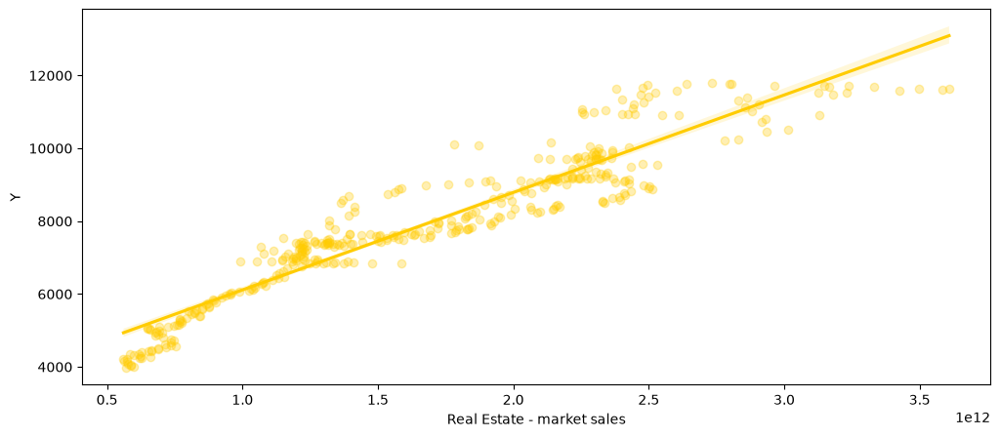

In [117]:
scatter_kws={'alpha':0.3, 'color':'#ffcc00'}
line_kws={'color':'#ffcc00'}
sns.regplot(x=df['Real Estate - market sales'], y=df['Y'], scatter_kws=scatter_kws, line_kws=line_kws)

<Axes: xlabel='Real Estate - market sales', ylabel='Y'>

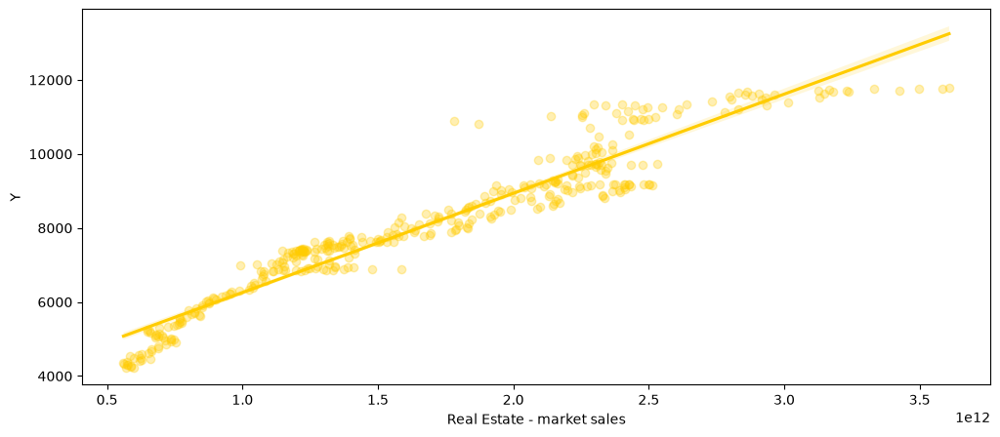

In [118]:
sns.regplot(x=df.loc[shifted_series.index, 'Real Estate - market sales'], y=shifted_series, scatter_kws=scatter_kws, line_kws=line_kws)

<Axes: xlabel='Real Estate - market sales', ylabel='Y'>

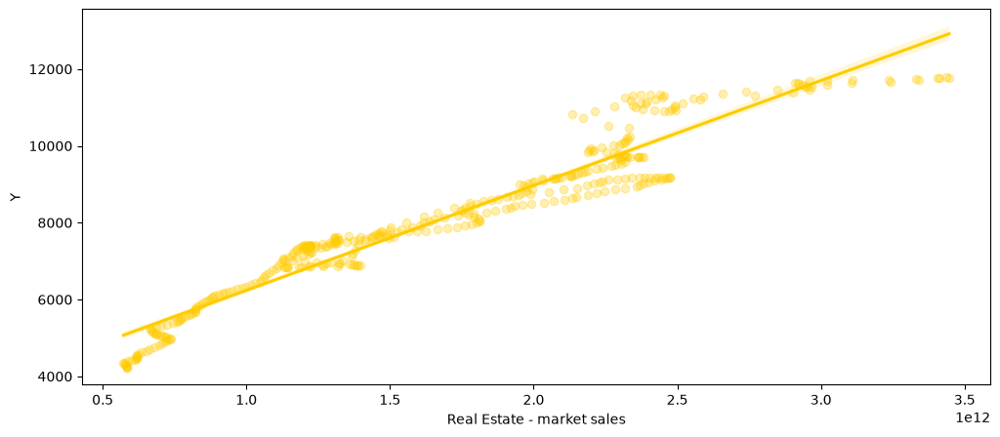

In [119]:
x_series = df.loc[shifted_series.index, 'Real Estate - market sales'].rolling(window=6, min_periods=1, center=True).mean()
sns.regplot(x=x_series, y=shifted_series, scatter_kws=scatter_kws, line_kws=line_kws)

PearsonRResult(statistic=np.float64(0.9652260713322899), pvalue=np.float64(1.6402130869599212e-230))

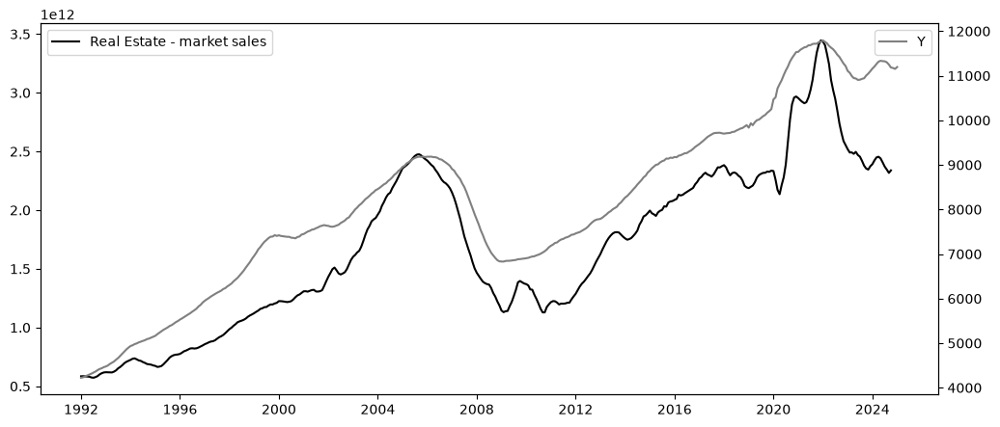

In [120]:
dual_plot_corr(x_series, shifted_series)

##### Model

[2.72129950e-09 3.51433472e+03]
0.05069320672234961
0.9301754436390908


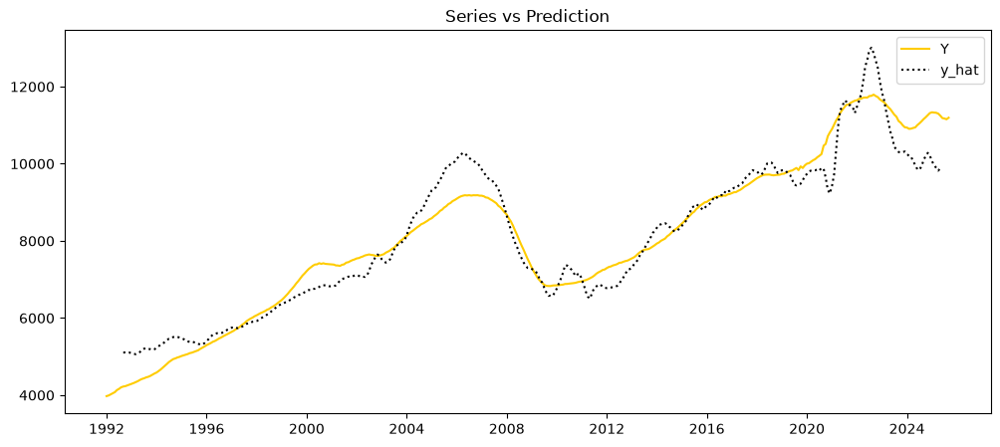

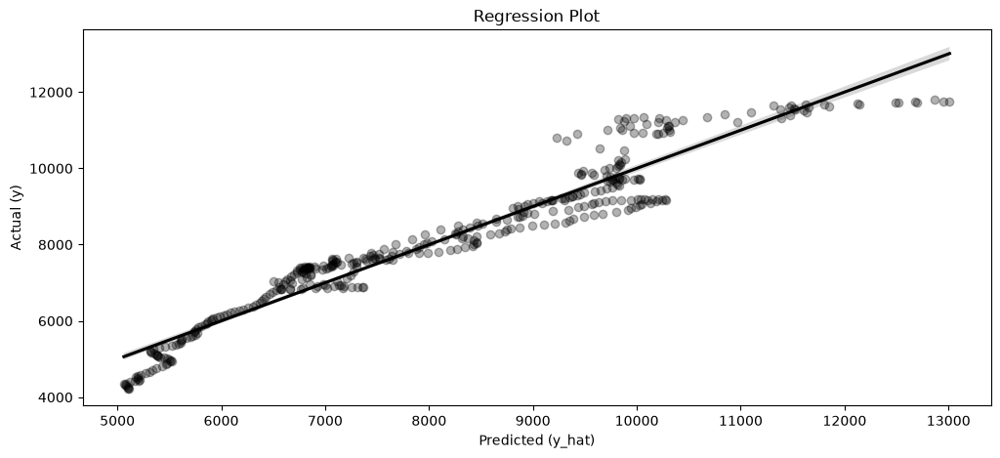

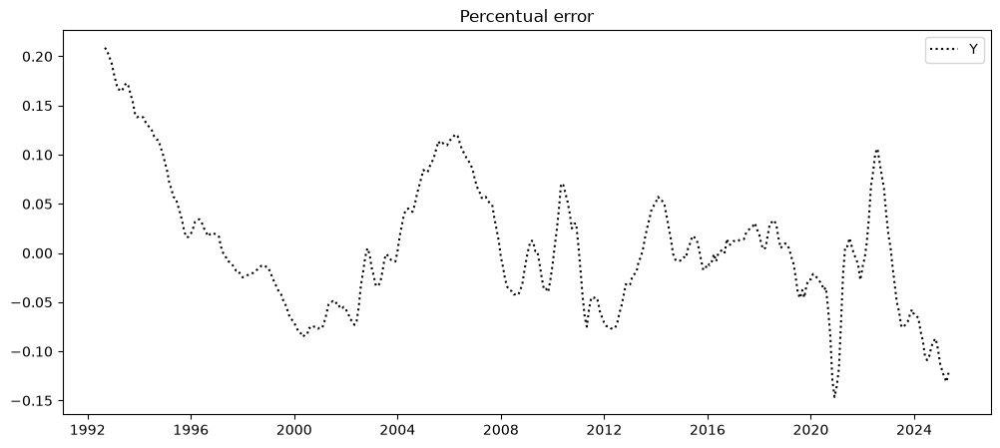

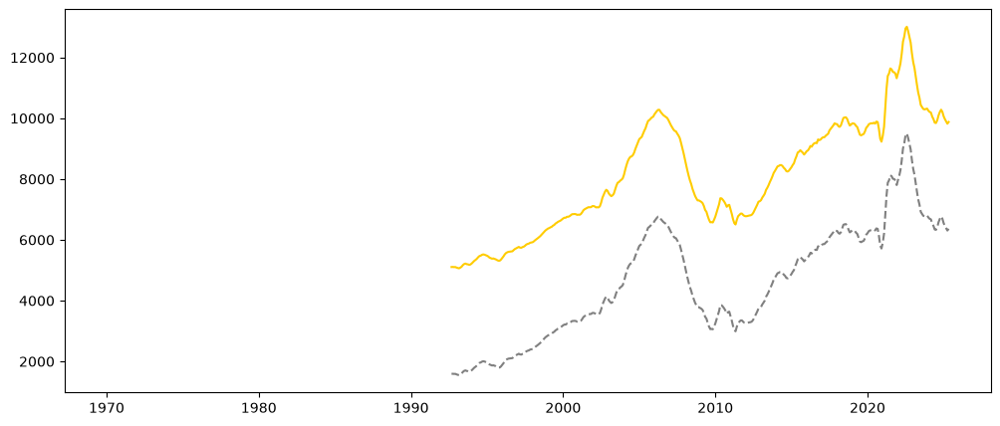

In [121]:
shift=8

scatter_kws={'alpha':0.3, 'color':'black'}
line_kws={'color':'black'}

# x = df.loc[shifted_series.index, 'Real Estate - market sales'].rolling(window=5, min_periods=1, center=True).mean()
# y = shifted_series

x = df['Real Estate - market sales'].rolling(window=5, min_periods=1, center=True).mean().shift(shift)
y = df['Y']

LM = LinearModelClass()
LM.fit(x,y)

print(LM.coefs)
print(LM.mape)
print(LM.r2)
LM.plot_prediction(color1=color3, color2=color1)
LM.plot_regression(scatter_kws=scatter_kws, line_kws=line_kws)
LM.plot_perc_error(color=color1)
LM.plot_prediction_decomposition(color3, color2, color2)

np.float64(1684.745295118745)

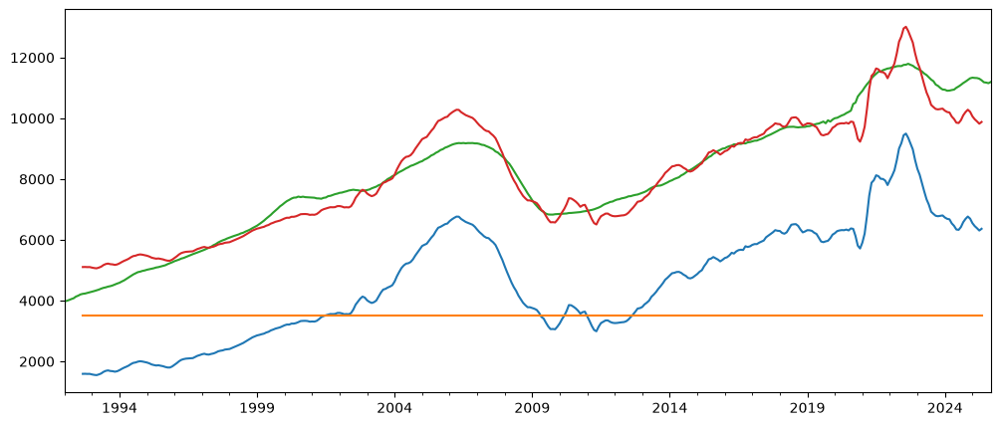

In [122]:
(LM.coefs[0] * LM.x).plot()
(LM.coefs[1] + LM.x * 0).plot()
LM.y.plot()
LM.y_hat.plot()
LM.x.mean() /1e9

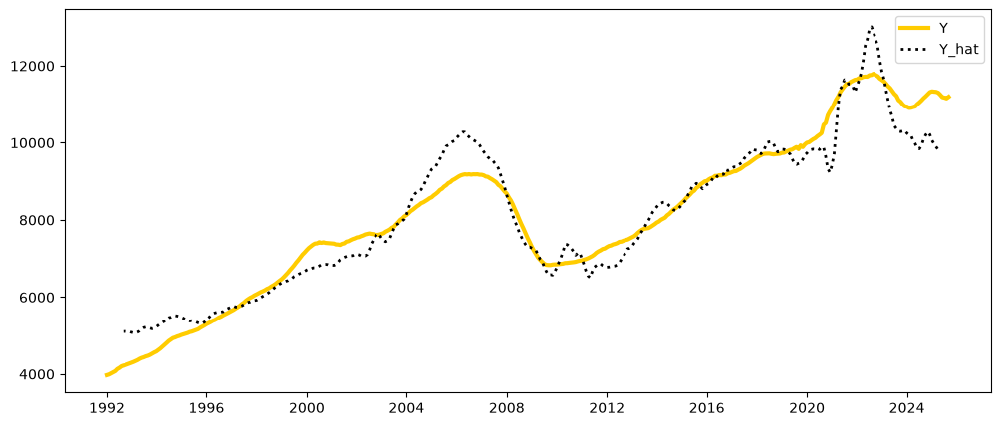

In [123]:
plt.plot(LM.y, color=color3, linewidth=3, label='Y')
plt.plot(LM.y_hat,  color=color1, linestyle=':', linewidth=2, label='Y_hat')
plt.legend();

##### Differences

[0.25531417 0.00138726]
1.2865646966737987
0.5186352374050394


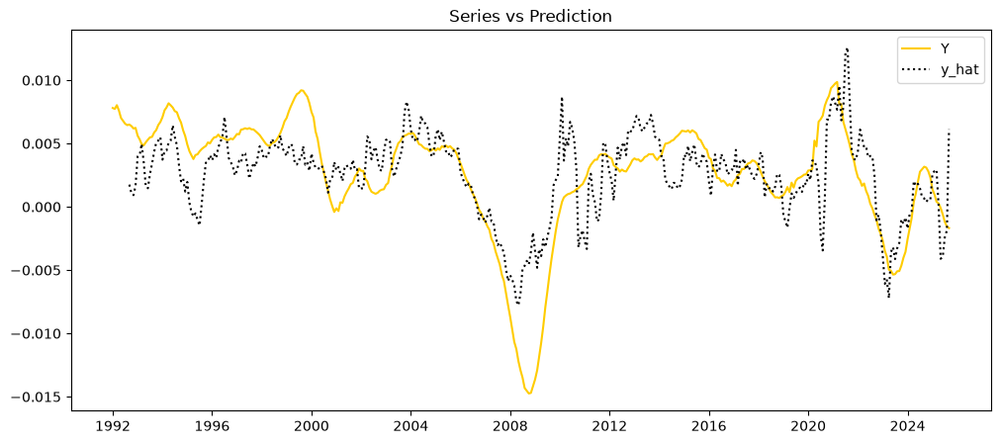

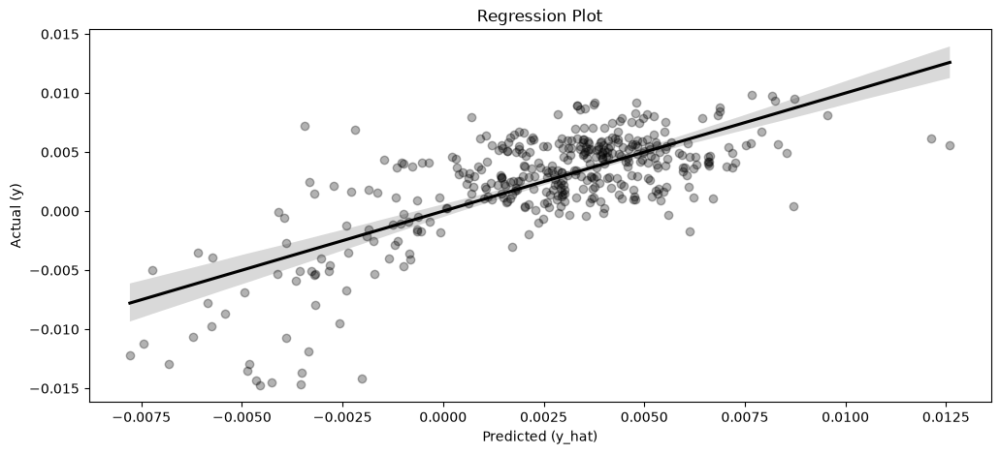

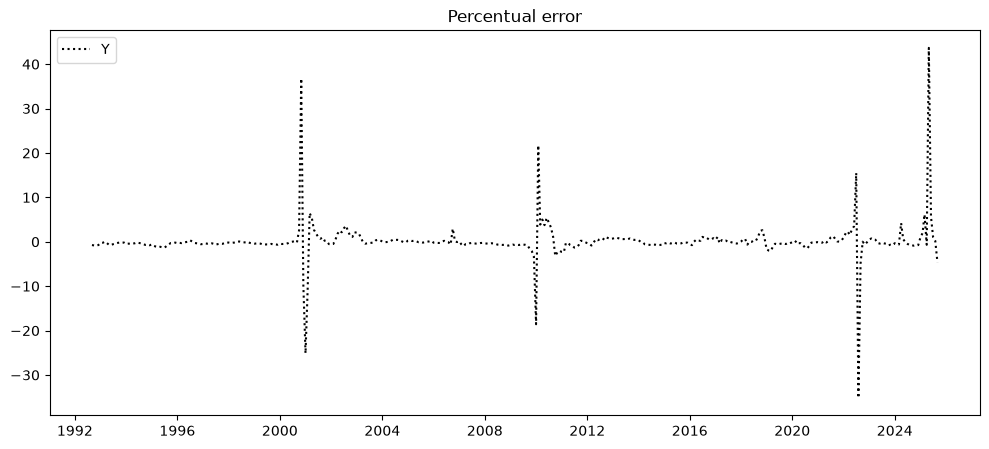

In [124]:
shift = 8

x_series = df['roll_pct_chg_Real Estate - market sales'].shift(shift)
shifted_series = df['roll_pct_chg_Y']

x = x_series.dropna()
y = shifted_series.dropna()

LM_1_diff = LinearModelClass()
LM_1_diff.fit(x,y)

print(LM_1_diff.coefs)
print(LM_1_diff.mape)
print(LM_1_diff.r2)
LM_1_diff.plot_prediction(color1=color3, color2=color1)
LM_1_diff.plot_regression(scatter_kws=scatter_kws, line_kws=line_kws)
LM_1_diff.plot_perc_error(color=color1)

##### Checking  Y as share of RE market

C:\Users\illoi\AppData\Local\Temp\ipykernel_36812\2194905800.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['Y_sh_shift_RE'] = df['Y'].shift(shift) / df['Real Estate - market sales'].rolling(window=12, min_periods=1, center=True).mean() * f


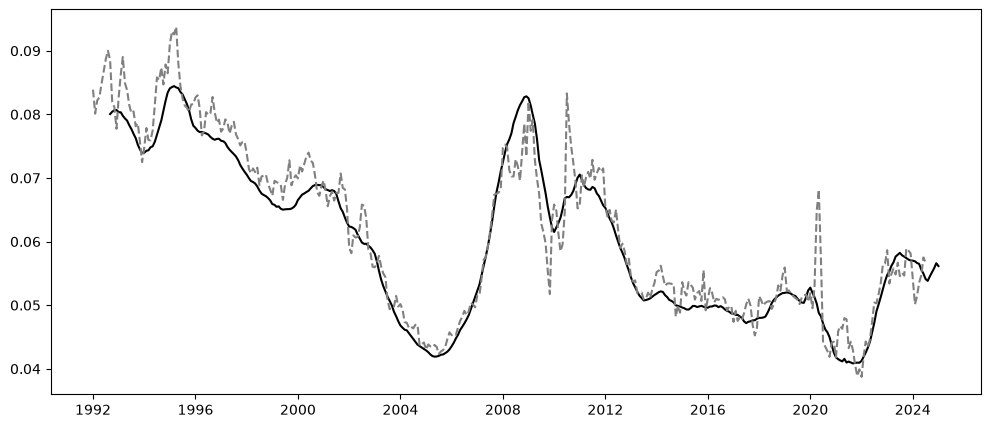

In [125]:
df['Y_sh_shift_RE'] = df['Y'].shift(shift) / df['Real Estate - market sales'].rolling(window=12, min_periods=1, center=True).mean() * f
plt.plot(df['Y_sh_shift_RE'], 'k')
plt.plot(df['Y_sh_RE'], 'grey', linestyle="--")

C:\Users\illoi\AppData\Local\Temp\ipykernel_36812\2704816625.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['Y_sh_mcoef_shift_RE'] = (df['Y'].shift(shift) - factor) / df['Real Estate - market sales'].rolling(window=12, min_periods=1, center=True).mean() * f


2635.751043236728
0.037566874310854294
5414.237484634578


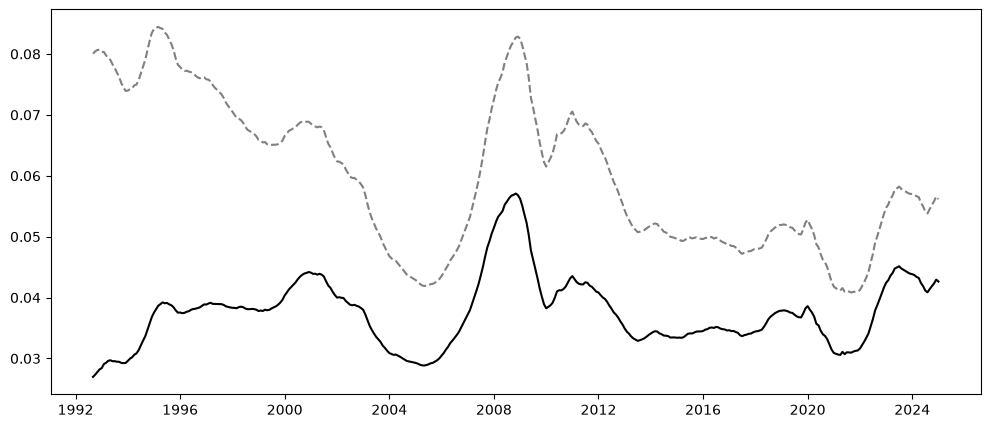

In [126]:
factor = 0.75 * LM.coefs[1]
df['Y_sh_mcoef_shift_RE'] = (df['Y'].shift(shift) - factor) / df['Real Estate - market sales'].rolling(window=12, min_periods=1, center=True).mean() * f
plt.plot(df['Y_sh_mcoef_shift_RE'], 'k')
plt.plot(df['Y_sh_shift_RE'], 'grey', linestyle="--")
print(factor)
print(df['Y_sh_mcoef_shift_RE'].mean())
print(df['Y'].mean() - factor)

#### RE Market operations

##### Correlations

In [127]:
print(adfuller(df['roll_pct_chg_Y_infl_adj'].dropna())[1])
print(adfuller(df['roll_pct_chg_US All home sales'].dropna())[1])
infl_adj_granger_results = grangercausalitytests(df[['roll_pct_chg_Y_infl_adj', 'roll_pct_chg_US All home sales']].dropna(), maxlag=9)

0.01974951314011712
0.01626137107466826


C:\Users\illoi\AppData\Local\Temp\ipykernel_36812\3514761600.py:1: FutureWarning: adfuller currently returns a plain tuple whose length depends on the store and autolag arguments. In release 0.16 or after July 2027, whichever is later, the default behavior will switch to always returning an ADFullerResult. Set result_object=True to switch now, or result_object=False to keep the current behavior and silence this warning.
  print(adfuller(df['roll_pct_chg_Y_infl_adj'].dropna())[1])
C:\Users\illoi\AppData\Local\Temp\ipykernel_36812\3514761600.py:2: FutureWarning: adfuller currently returns a plain tuple whose length depends on the store and autolag arguments. In release 0.16 or after July 2027, whichever is later, the default behavior will switch to always returning an ADFullerResult. Set result_object=True to switch now, or result_object=False to keep the current behavior and silence this warning.
  print(adfuller(df['roll_pct_chg_US All home sales'].dropna())[1])


np.int64(5)

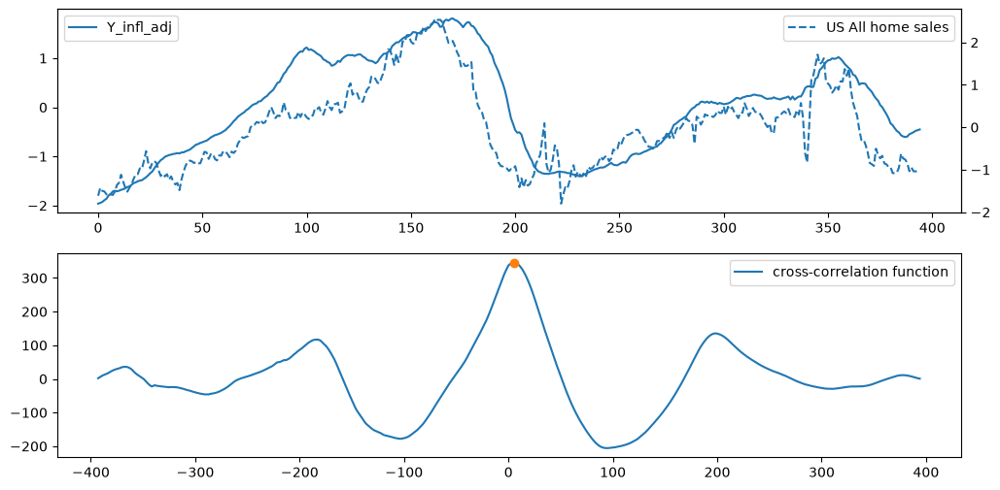

In [128]:
cross_correlate(df, 'Y_infl_adj', 'US All home sales', adjusted=False)

7
0.8862665523124805


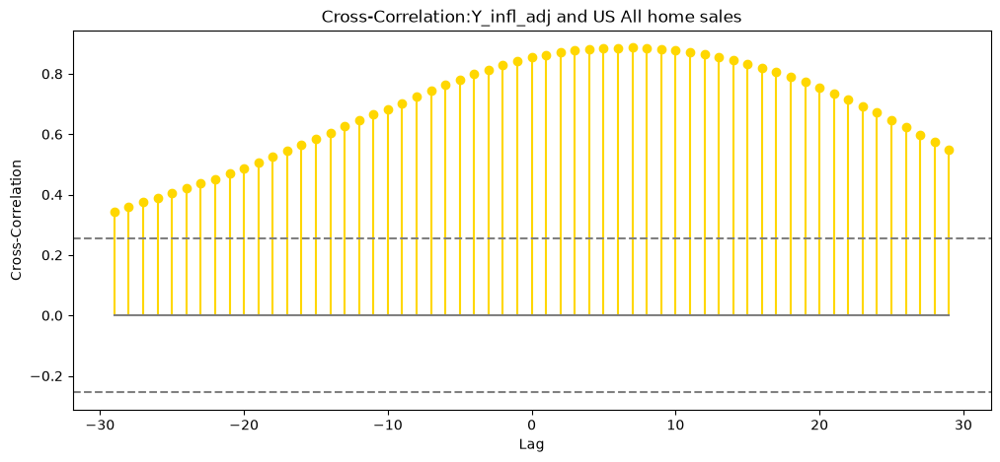

In [129]:
ccf_values = ccf_funct(df['Y_infl_adj'].dropna(), df['US All home sales'].dropna(), 30, adjusted=True, both_sides=True)

37
0.9084123500622598


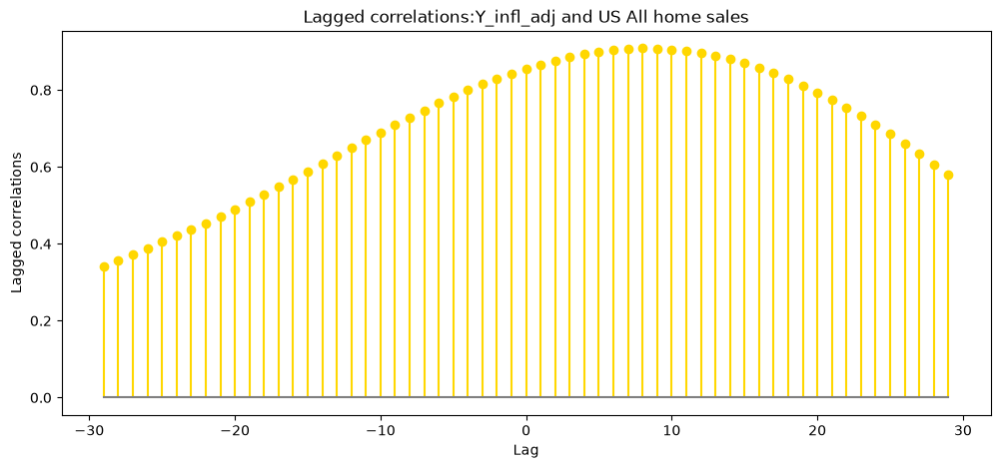

In [130]:
corr_values = lagged_corr_plot(df['Y_infl_adj'], df['US All home sales'], 30, both_sides=True)
print(corr_values.argmax())
print(corr_values.max())

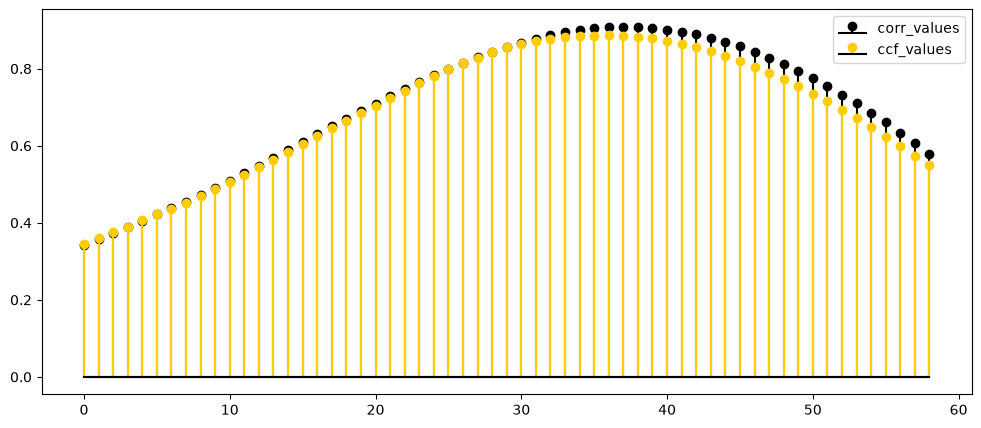

In [131]:
plt.stem(corr_values, linefmt=color1, markerfmt=color1, basefmt=color1, label='corr_values')
plt.stem(ccf_values, linefmt=color3, markerfmt=color3, basefmt=color1, label='ccf_values')
plt.legend();

np.int64(9)

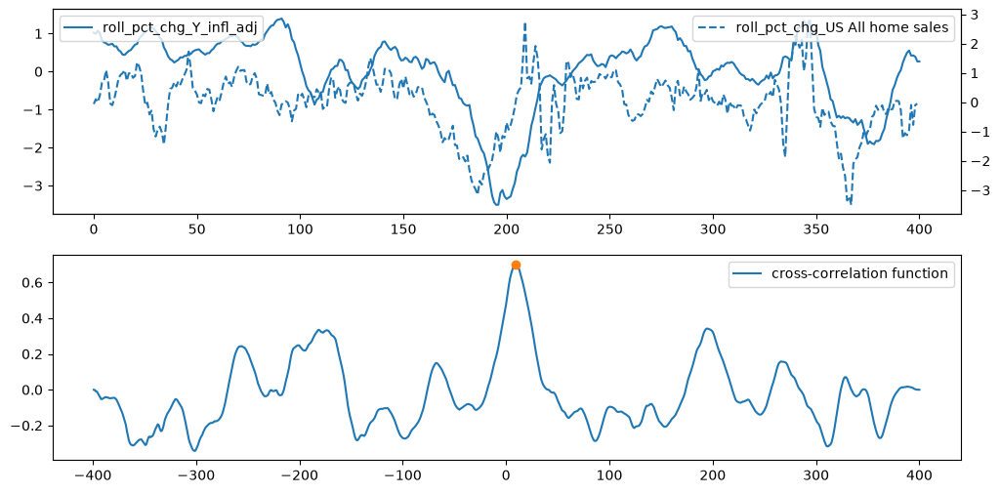

In [132]:
cross_correlate(df, 'roll_pct_chg_Y_infl_adj', 'roll_pct_chg_US All home sales')

9
0.700244466715895


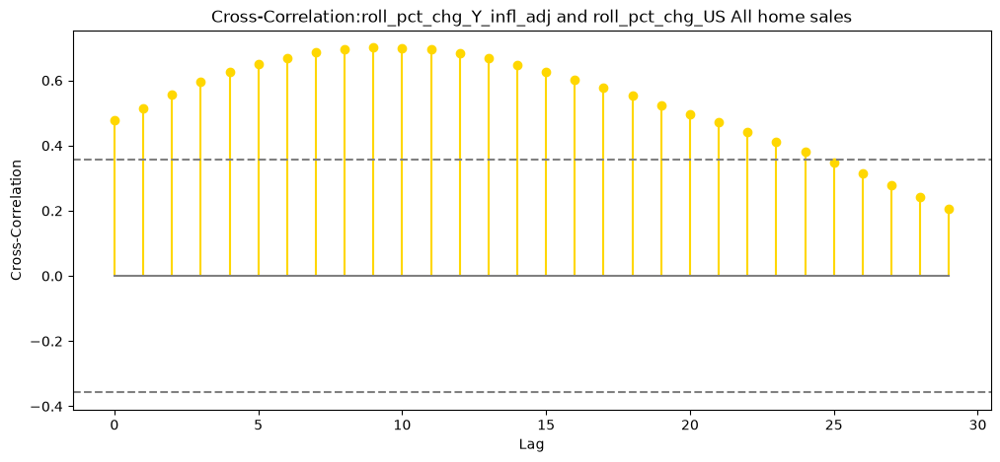

In [133]:
# df['pct_chg_Y_infl_adj'] = df['Y_infl_adj'].pct_change(fill_method=None)
# df['roll_pct_chg_Y_infl_adj'] = df['pct_chg_Y_infl_adj'].rolling(window=12, min_periods=1, center=True).mean()
IR_MORT_ccf = ccf_funct(df['roll_pct_chg_Y_infl_adj'].dropna(), df['roll_pct_chg_US All home sales'].dropna(), 30, adjusted=True)

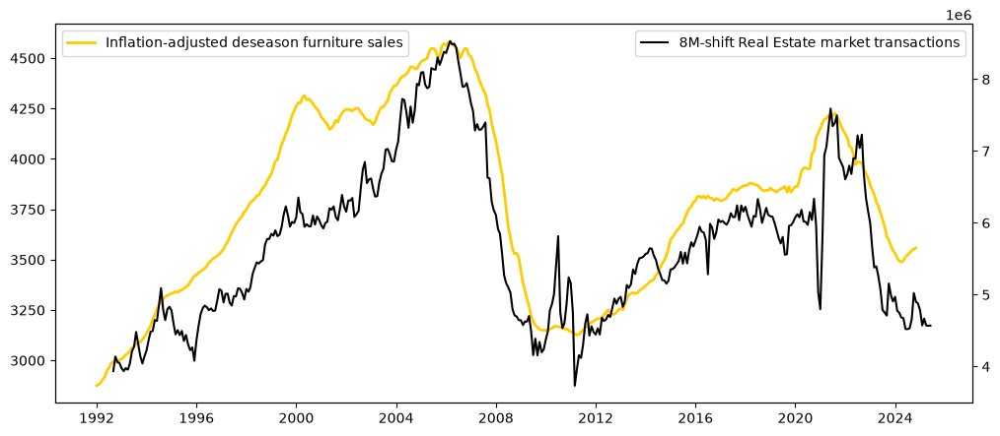

In [134]:
fig, ax1 = plt.subplots()
ax1.plot(df['Y_infl_adj'], color=color3, linewidth=2, label='Inflation-adjusted deseason furniture sales')
ax1.legend(loc='upper left')
# ax1.set_ylim([4000,14000])
ax2 = ax1.twinx()
ax2.plot(df['US All home sales'].shift(8), color=color1, label='8M-shift Real Estate market transactions')
ax2.legend(loc='upper right')

np.float64(0.90841235006226)

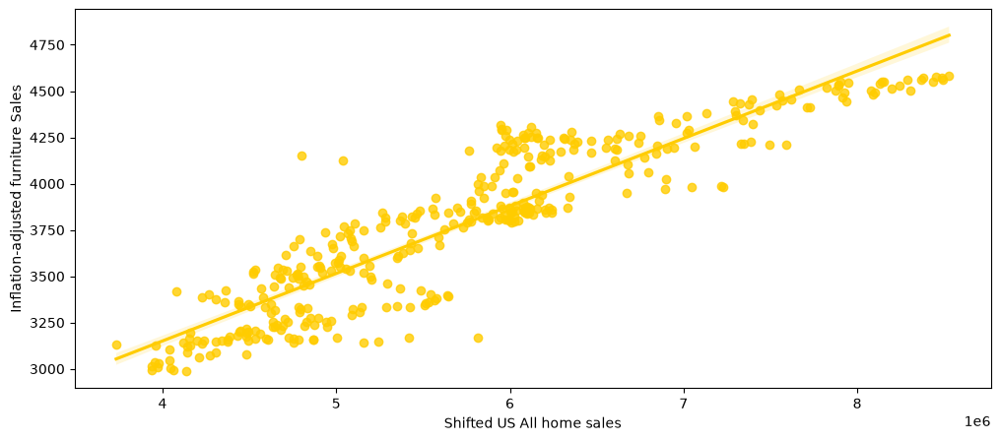

In [135]:
sns.regplot(x=df['US All home sales'].shift(8), y=df['Y_infl_adj'], color=color3)
plt.xlabel('Shifted US All home sales')
plt.ylabel('Inflation-adjusted furniture Sales')
df['US All home sales'].shift(8).corr(df['Y_infl_adj'])

##### Model

4621.6674838987
1575.9154413132815
[3.85138957e-04 1.57591544e+03]
0.03536898692425542


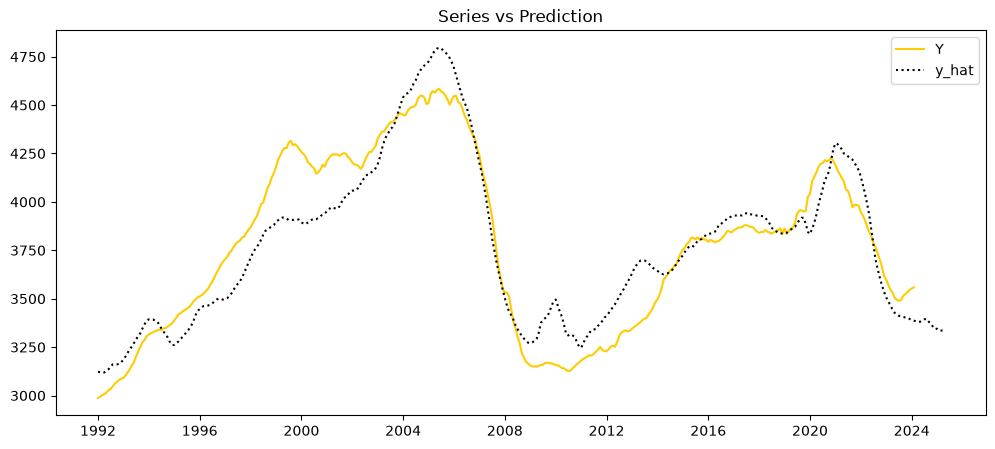

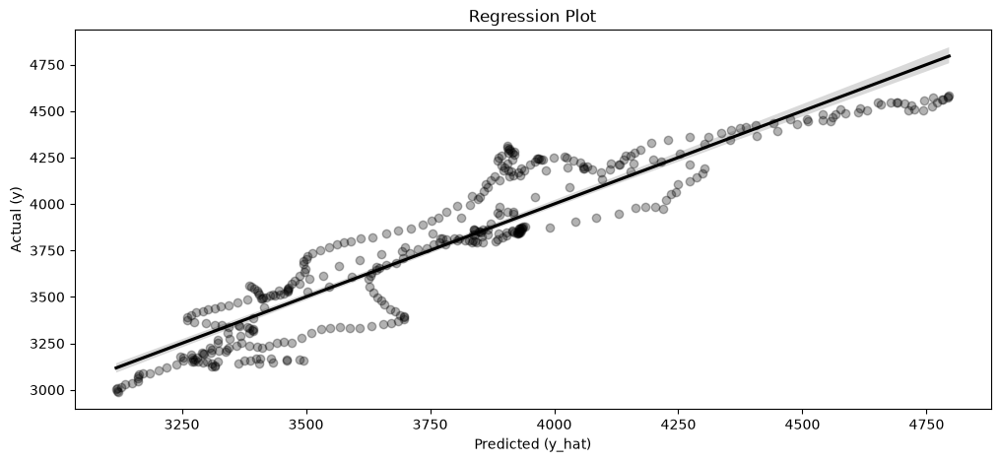

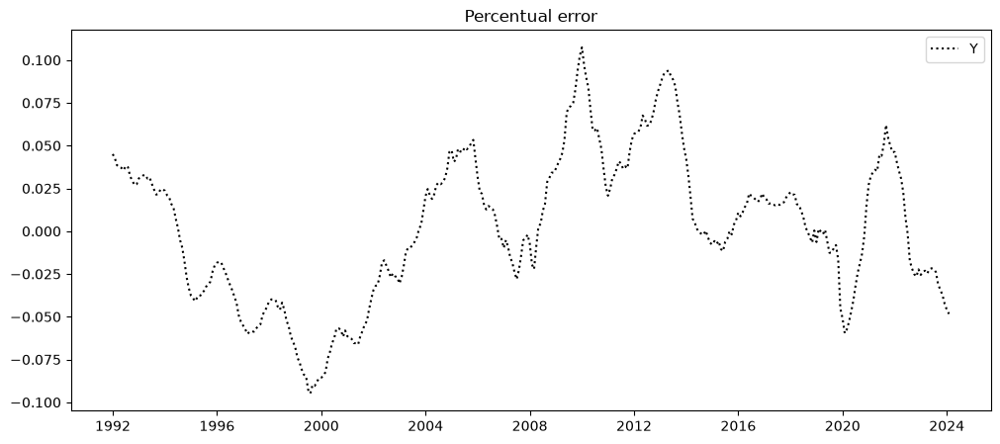

In [136]:
shift = -9
var1='US All home sales'
var2='Y_infl_adj'

scatter_kws={'alpha':0.3, 'color':'black'}
line_kws={'color':'black'}

houses_sold_roll_series = df[var1].rolling(window=12, min_periods=1, center=True).mean()
IA_shifted_series = df[var2].shift(shift)

LM_2 = LinearModelClass()
LM_2.fit(houses_sold_roll_series,IA_shifted_series)

print(f * LM_2.coefs[0])
print(LM_2.coefs[1])

print(LM_2.coefs)
print(LM_2.mape)
LM_2.plot_prediction(color1=color3, color2=color1)
LM_2.plot_regression(scatter_kws=scatter_kws, line_kws=line_kws)
LM_2.plot_perc_error(color=color1)

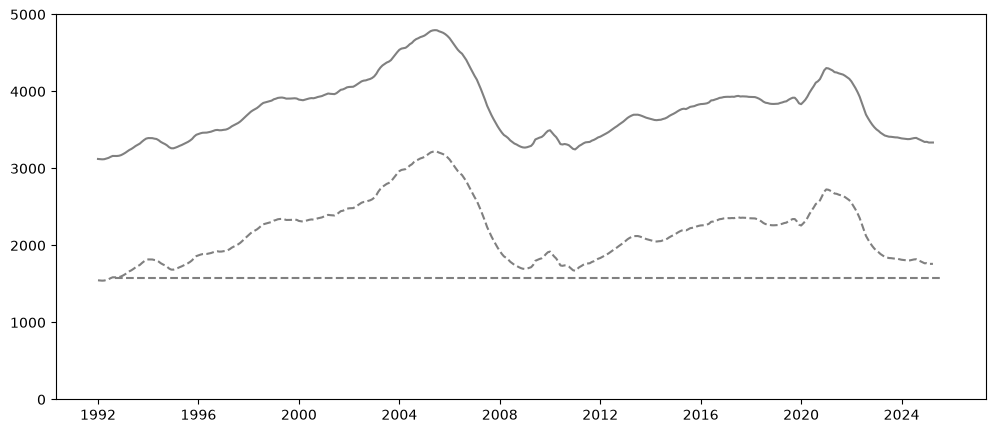

In [137]:
plt.plot(LM_2.coefs[0] * houses_sold_roll_series + LM_2.coefs[1], color='grey')
plt.plot(LM_2.coefs[0] * houses_sold_roll_series, color='grey', linestyle='--')
plt.plot(0 * x + LM_2.coefs[1], color='grey', linestyle='--')
plt.ylim([0,5000]);

In [138]:
last_CPI = df['Consumer Price Index'].dropna().iloc[-1]

print('coefs in constant dollars:')
print(LM_2.coefs[0] * 1e6)
print(LM_2.coefs[1] * 1e6)

print('\n')

print('coefs in current USD, and meaning:')
print(LM_2.coefs[0] * 1e6 * 12 * last_CPI)
print(LM_2.coefs[1] * 1e6  * last_CPI)

coefs in constant dollars:
385.13895699155836
1575915441.3132815


coefs in current USD, and meaning:
14624.850802723886
4986842581.646161


C:\Users\illoi\AppData\Local\Temp\ipykernel_36812\2465743666.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend();


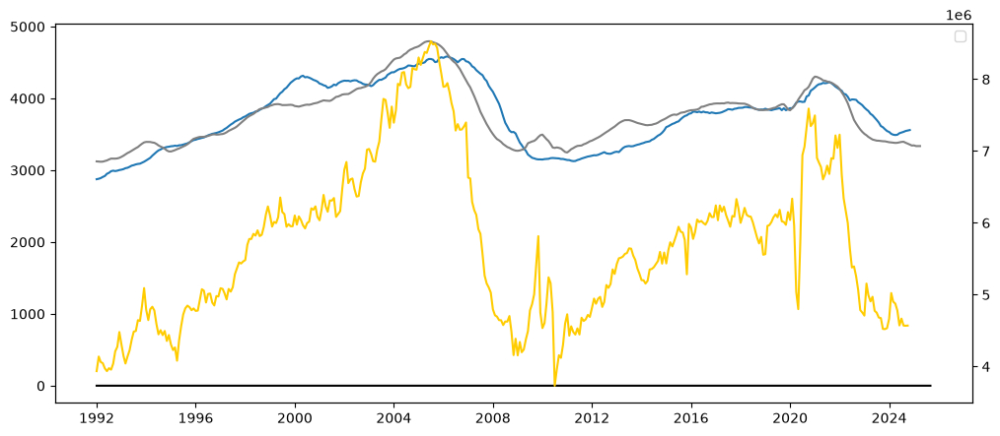

In [139]:
fig, ax = plt.subplots()
ax.plot(df['Y_infl_adj'], label='Y_infl_adj')
ax.plot(y, color='black', label='Y')
ax.plot(LM_2.y_hat, color='grey', label='y_hat')

ax2 = ax.twinx()

ax2.plot(df['US All home sales'], color3)
plt.legend();

##### Differences

[3.04867366e-01 1.94274200e-04]
3.7286161345813995
0.47916008946454036


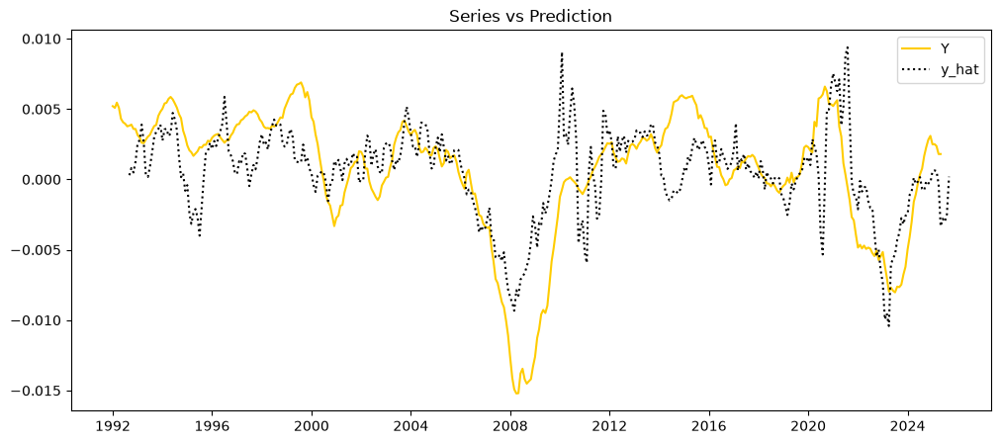

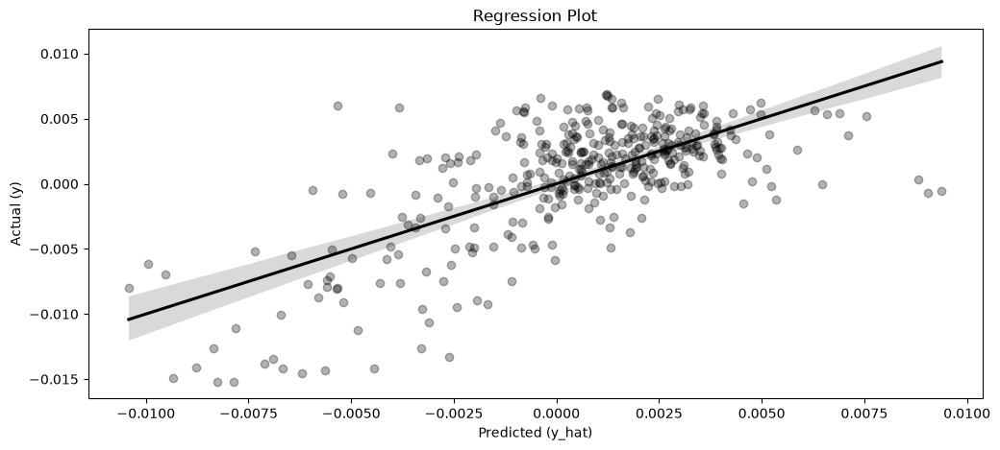

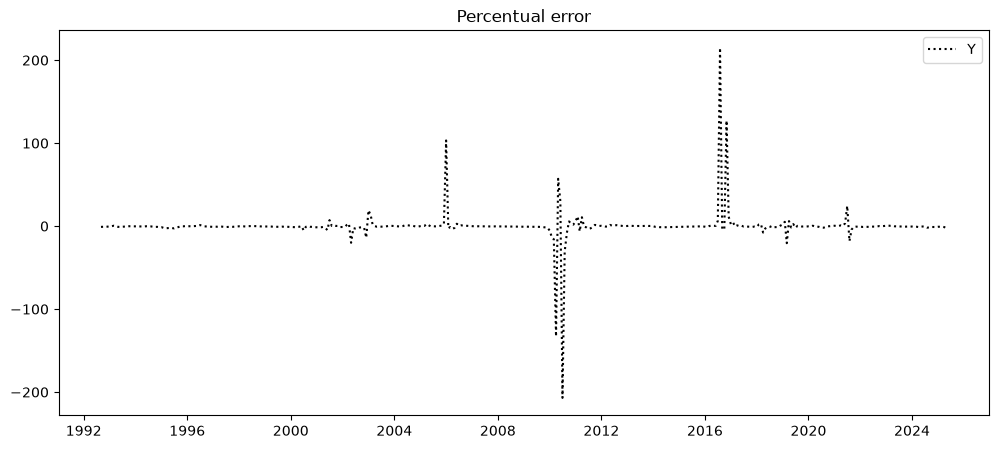

In [140]:
shift = 8

x_series = df['roll_pct_chg_US All home sales'].shift(shift)
shifted_series = df['roll_pct_chg_Y_infl_adj']

x = x_series.dropna()
y = shifted_series.dropna()

LM_2_diff = LinearModelClass()
LM_2_diff.fit(x,y)

print(LM_2_diff.coefs)
print(LM_2_diff.mape)
print(LM_2_diff.r2)
LM_2_diff.plot_prediction(color1=color3, color2=color1)
LM_2_diff.plot_regression(scatter_kws=scatter_kws, line_kws=line_kws)
LM_2_diff.plot_perc_error(color=color1)

##### Ratio to Real Estate Market

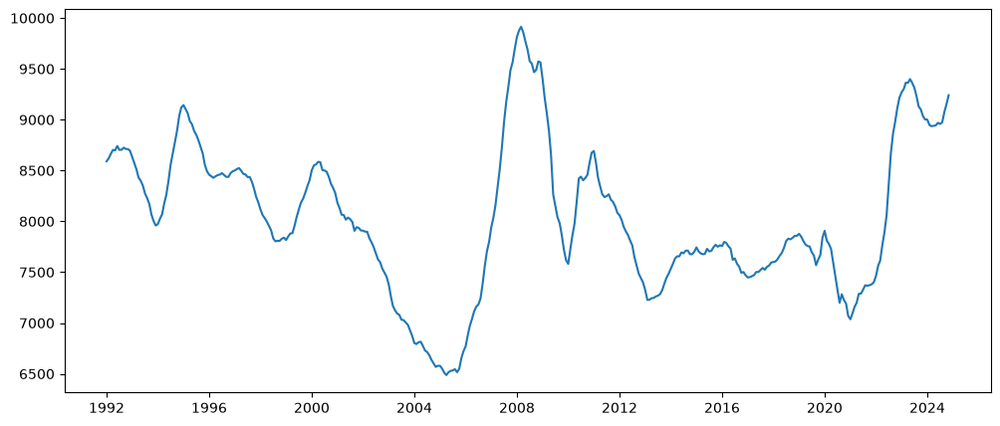

In [141]:
plt.plot((f * df['Y_infl_adj'] / df['US All home sales'].rolling(window=12, min_periods=1, center=True).mean()))

PearsonRResult(statistic=np.float64(0.9999999999999997), pvalue=np.float64(0.0))

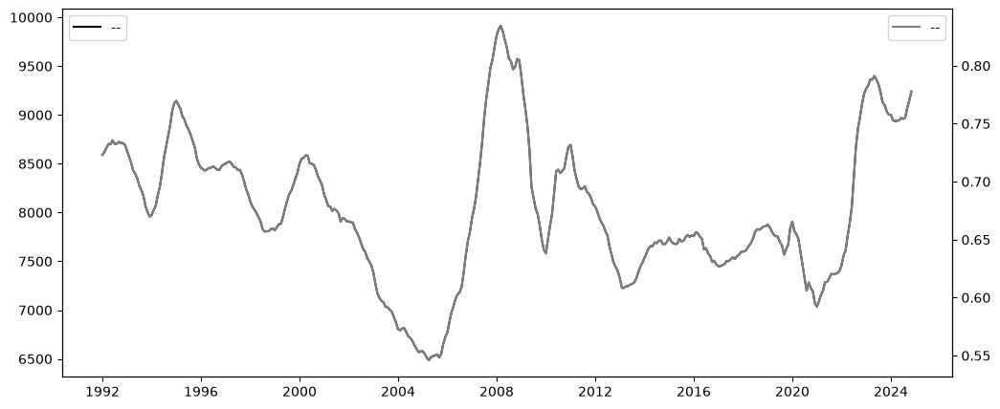

In [142]:
dual_plot_corr(f * df['Y_infl_adj'] / df['US All home sales'].rolling(window=12, min_periods=1, center=True).mean(), 
               HF_spend_vs_CPI_series
              )

C:\Users\illoi\AppData\Local\Temp\ipykernel_36812\3252056516.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['Y_infl_adj_home_sales'] = df['Y_infl_adj'] / df['US All home sales'] * f
C:\Users\illoi\AppData\Local\Temp\ipykernel_36812\3252056516.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['Y_infl_adj_roll_home_sales'] = df['Y_infl_adj'] / df['US All home sales'].rolling(window=12, min_periods=1, center=True).mean() * f
C:\Users\illoi\AppData\Local\Temp\ipykernel_36812\3252056516.py:3: PerformanceWarning: DataFram

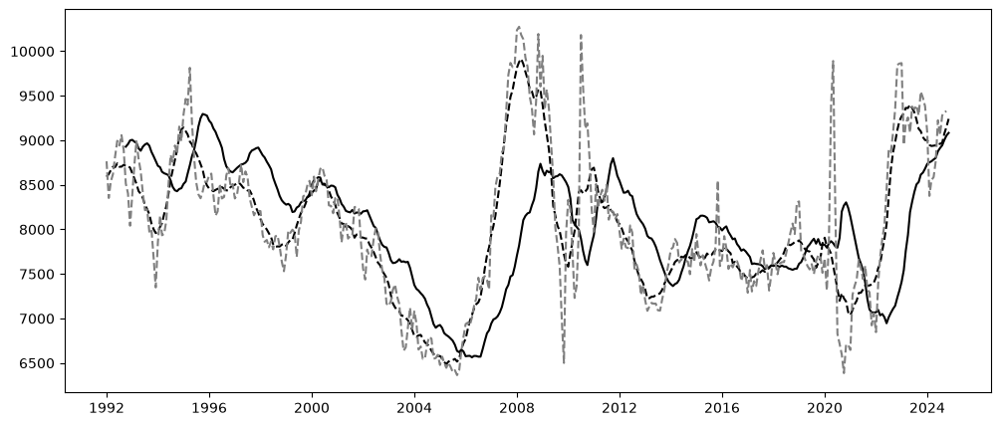

In [143]:
df['Y_infl_adj_home_sales'] = df['Y_infl_adj'] / df['US All home sales'] * f
df['Y_infl_adj_roll_home_sales'] = df['Y_infl_adj'] / df['US All home sales'].rolling(window=12, min_periods=1, center=True).mean() * f
df['Y_infl_adj_shift_roll_home_sales'] = df['Y_infl_adj'] / df['US All home sales'].rolling(window=12, min_periods=1, center=True).mean().shift(9) * f

plt.plot(df['Y_infl_adj_shift_roll_home_sales'], 'k')
plt.plot(df['Y_infl_adj_roll_home_sales'], 'k', linestyle="--")
plt.plot(df['Y_infl_adj_home_sales'], 'grey', linestyle="--")

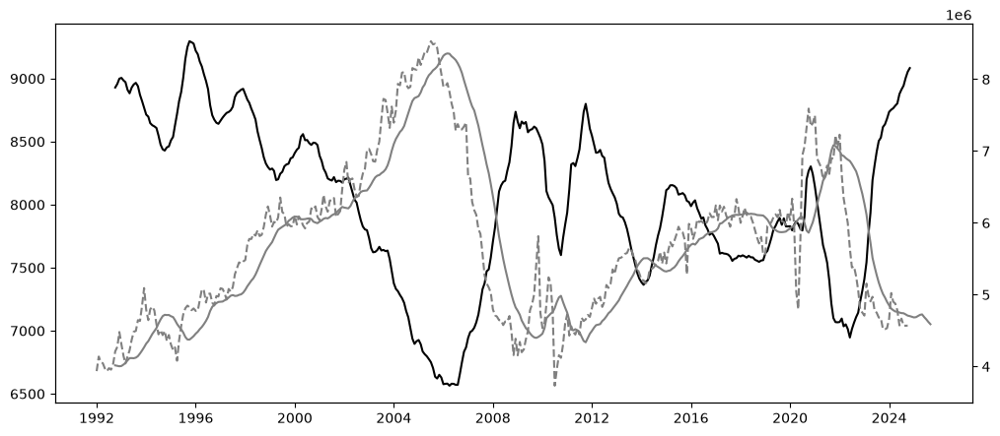

In [144]:
fig, ax = plt.subplots()
ax.plot(df['Y_infl_adj_shift_roll_home_sales'], 'k')
ax2 = ax.twinx()
ax2.plot(df['US All home sales'], 'grey', linestyle='--')
ax2.plot(df['US All home sales'].rolling(window=12, min_periods=1, center=True).mean().shift(9), 'grey')

np.float64(8026.555956539158)

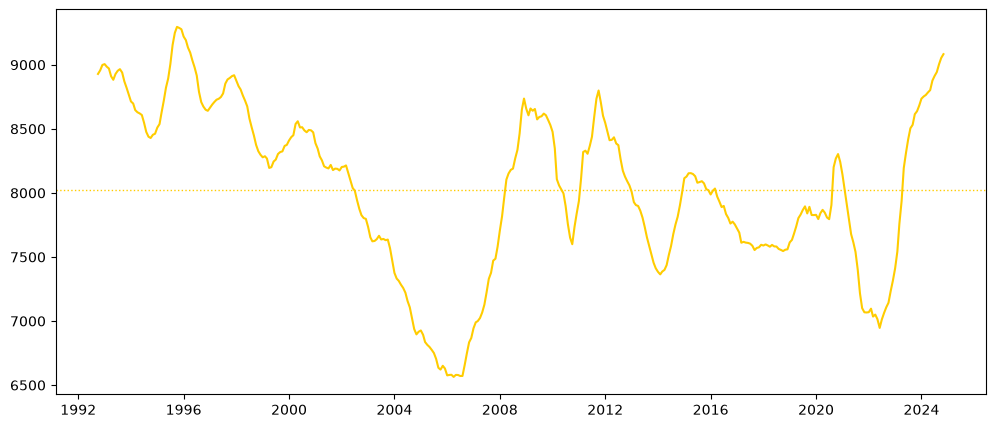

In [145]:
# aaa = f * df['Y_infl_adj'].shift(-4) / df['All home sales FR'].rolling(window=12, min_periods=1, center=True).mean()
plt.plot(df['Y_infl_adj_shift_roll_home_sales'], color=color3)
plt.axhline(df['Y_infl_adj_shift_roll_home_sales'].mean(), color=color3, linestyle=':', lw=1)
df['Y_infl_adj_shift_roll_home_sales'].mean()